# ENCUESTA DE CURSADA
## Primer Cuatrimestre de 2021
### Departamento de Computación FIUBA

Se recomienda ejecutar este notebook con [jupyterlab](https://jupyterlab.readthedocs.io/en/stable/).

Código disponible en [github.com/CrossNox/FIUBA-encuesta-depto-computacion](https://github.com/CrossNox/FIUBA-encuesta-depto-computacion).

In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set(style='darkgrid');
import sys
from IPython.display import display, Markdown
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from textwrap import wrap

pd.options.display.max_colwidth = None
pd.set_option('display.max_rows', None)

In [2]:
comp = pd.read_csv("../datasets/2021c1/encuesta_1C2021.csv")

# Análisis de respuestas

## Total de Encuestas Procesadas

In [3]:
comp.pipe(len)

687

## Hay duplicados?

In [4]:
comp.duplicated().any()

False

## Encoding de preguntas de opción múltiple

In [5]:
map_opinion = {"Excelente": 5, "Muy Bueno": 4, "Bueno": 3, "Regular": 2, "Malo": 1}
map_sino = {"Sí": 5, "No": 0}
map_temas = {
    "Muy Interesantes": 5,
    "Interesantes": 4,
    "Poco Interesantes": 2,
    "Nada Interesantes": 1,
}
map_clases_teoricas = {
    "Excelentes": 5,
    "Muy Buenas": 4,
    "Buenas": 3,
    "Regulares": 2,
    "Malas": 1,
    "No hay clases teóricas": np.nan,
    "No hay clase teóricas": np.nan,
}
map_clases_practicas = {
    "Excelentes": 5,
    "Muy Buenas": 4,
    "Buenas": 3,
    "Regulares": 2,
    "Malas": 1,
    "No Hay Clases Prácticas": np.NaN,
}
map_dificultad_curso = {
    "Muy Facil": 5,
    "Muy Fácil": 5,
    "Facil": 4,
    "Fácil": 4,
    "Normal": 3,
    "Dificil": 2,
    "Difícil": 2,
    "Muy Dificil": 1,
    "Muy Difícil": 1,
}
map_dificultad_tp = {
    "Muy dificil": 1,
    "Muy difícil": 1,
    "Dificil": 2,
    "Difícil": 2,
    "Normal": 3,
    "Fácil": 4,
    "Facil": 4,
    "Muy Fácil": 5,
    "Muy fácil": 5,
    "Muy Facil": 5,
    "No hay TP": np.NaN,
}

comp.replace(
    {
        "Opinión General Sobre el Curso": map_opinion,
        "¿Aprobó la Cursada?": map_sino,
        "¿Cómo te Resultaron los Temas de la Materia?": map_temas,
        "¿Los Temas de la Materia Están Actualizados?": map_sino,
        "Nivel de las Clases Teóricas del Curso": map_clases_teoricas,
        "Nivel de las Clases Prácticas del Curso": map_clases_practicas,
        "Dificultad del Curso": map_dificultad_curso,
        "Dificultad del TP": map_dificultad_tp,
    },
    inplace=True,
)

cols_sino = ["¿Aprobó la Cursada?", "¿Los Temas de la Materia Están Actualizados?"]

#comp['¿Aprobó la Cursada?'] = comp['¿Aprobó la Cursada?'].astype('category')
#comp['¿Los Temas de la Materia Están Actualizados?'] = comp['¿Los Temas de la Materia Están Actualizados?'].astype('category')

In [6]:
comp['Promedio nivel teóricas y prácticas'] = (comp["Nivel de las Clases Teóricas del Curso"] + comp["Nivel de las Clases Prácticas del Curso"]) / 2

## Opinión general del curso

In [7]:
def reverse_map(m):
    return {v:k for k,v in m.items()}

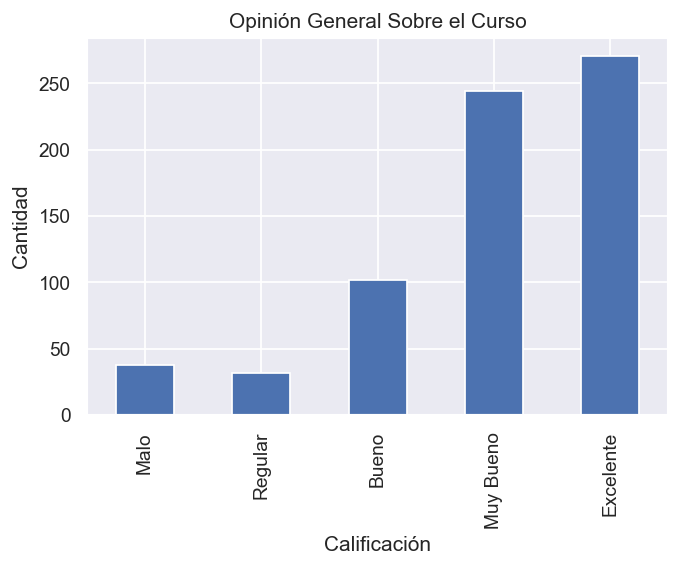

In [8]:
plt.figure(dpi=125)
plt.title('Opinión General Sobre el Curso')
ax = comp['Opinión General Sobre el Curso'].value_counts().sort_index().plot(kind='bar')
ax.set_xticklabels([reverse_map(map_opinion)[int(x.get_text())] for x in ax.get_xticklabels()])
plt.xlabel("Calificación")
plt.ylabel("Cantidad")
plt.show()

## Cantidad de Encuestados por Curso
Cantidad de encuestas completadas por cada Curso.

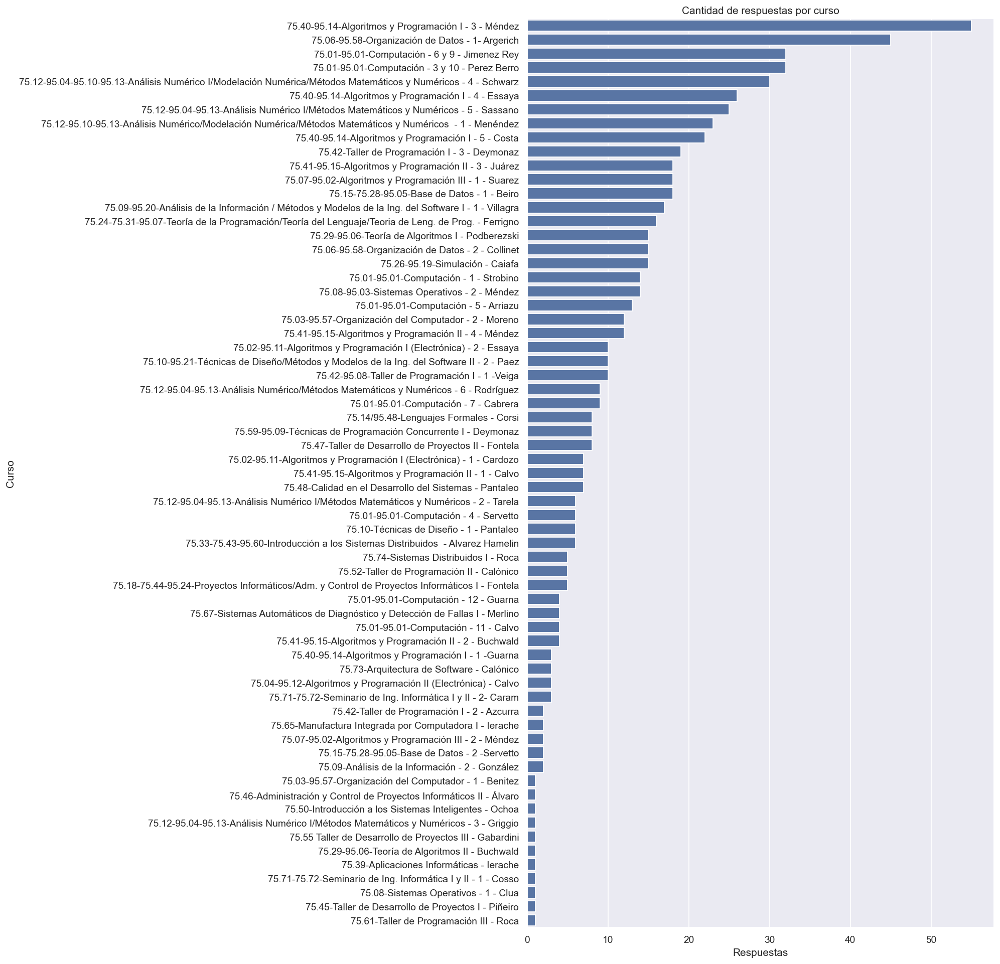

In [9]:
plt.figure(dpi=125, figsize=(6.4*1.5, 4.8*4))

data = comp['Elige el curso'].value_counts().sort_values(ascending=False)
ax = sns.barplot(x=data.values, y=data.index, color='b')

plt.title("Cantidad de respuestas por curso")
plt.xlabel("Respuestas")
plt.ylabel("Curso")

plt.show()

## Varianza de la Opinión por Curso
Este gráfico muestra la variabilidad de la pregunta "Opinión General Sobre el Curso", a menor valor mas consistentes los resultados de la encuesta. Los valores mayores muestran disparidad de resultados en cuanto a la opinión general sobre el curso.

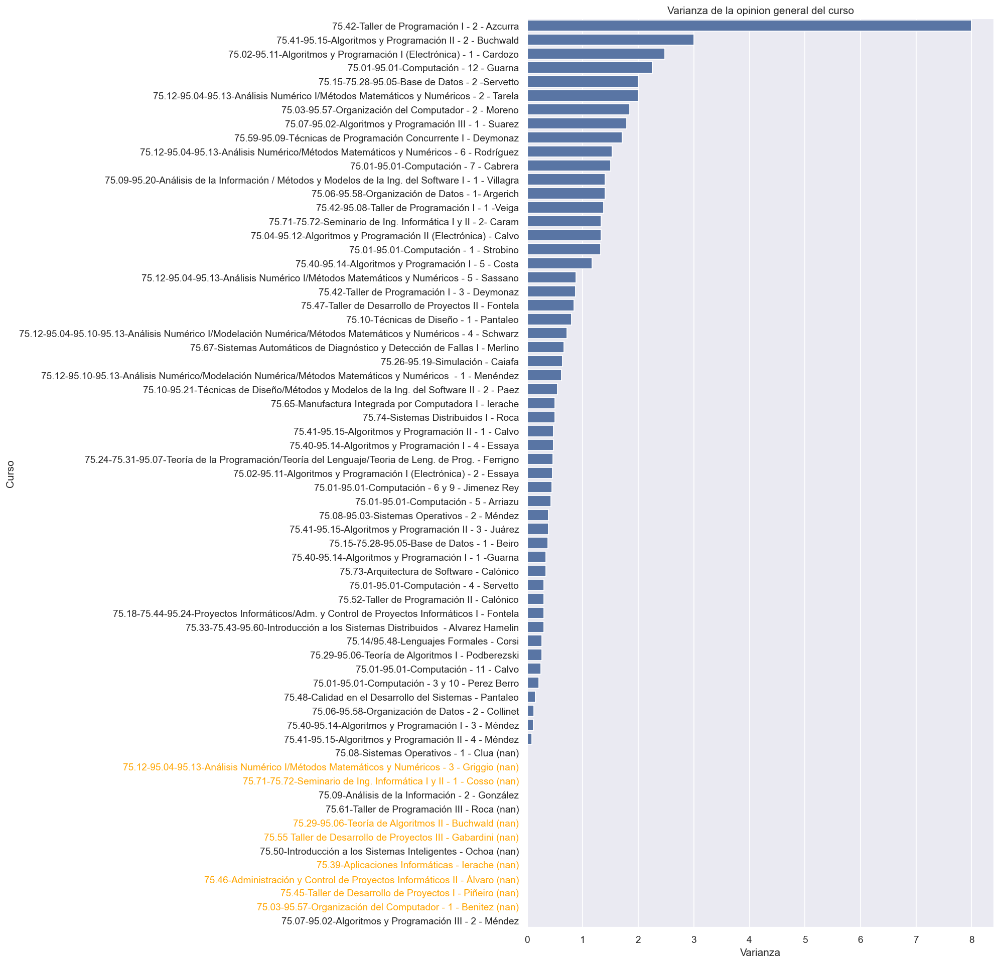

In [10]:
plt.figure(dpi=125, figsize=(6.4*1.5, 4.8*4))

var_curso = comp.groupby('Elige el curso')['Opinión General Sobre el Curso'].var()
nan_var = var_curso[var_curso.isna()].index.tolist()

data = var_curso.fillna(0).sort_values(ascending=False)

ax = sns.barplot(x=data.values, y=data.index, color='b')

ax.set_yticklabels([x if x.get_text() not in nan_var else f"{x.get_text()} (nan)" for x in ax.get_yticklabels()])

for yticklabel in ax.get_yticklabels():
    if yticklabel.get_text().rstrip(" (na)") in nan_var:
        yticklabel.set_color("orange")
    
plt.title("Varianza de la opinion general del curso")
plt.xlabel("Varianza")
plt.ylabel("Curso")

plt.show()

## Comparativa de promedios por pregunta
Esta matriz muestra el promedio de calificaciones para cada pregunta de la encuesta para los cursos que tienen 5 o mas encuestas. Orden alfabético por curso.

In [11]:
num_cols = ['Opinión General Sobre el Curso',
 '¿Aprobó la Cursada?',
 '¿Cómo te Resultaron los Temas de la Materia?',
 '¿Los Temas de la Materia Están Actualizados?',
 'Nivel de las Clases Teóricas del Curso',
 'Nivel de las Clases Prácticas del Curso',
 'Dificultad del Curso',
 'Dificultad del TP',
 'Promedio nivel teóricas y prácticas']

In [12]:
cursos_5p_respuestas = comp['Elige el curso'].value_counts().where(lambda x: x >= 5).dropna().index.tolist()
comp_5p = comp[comp['Elige el curso'].isin(cursos_5p_respuestas)].sort_values(by='Elige el curso')
comp_5p_mean = comp_5p.groupby('Elige el curso')[num_cols].mean()

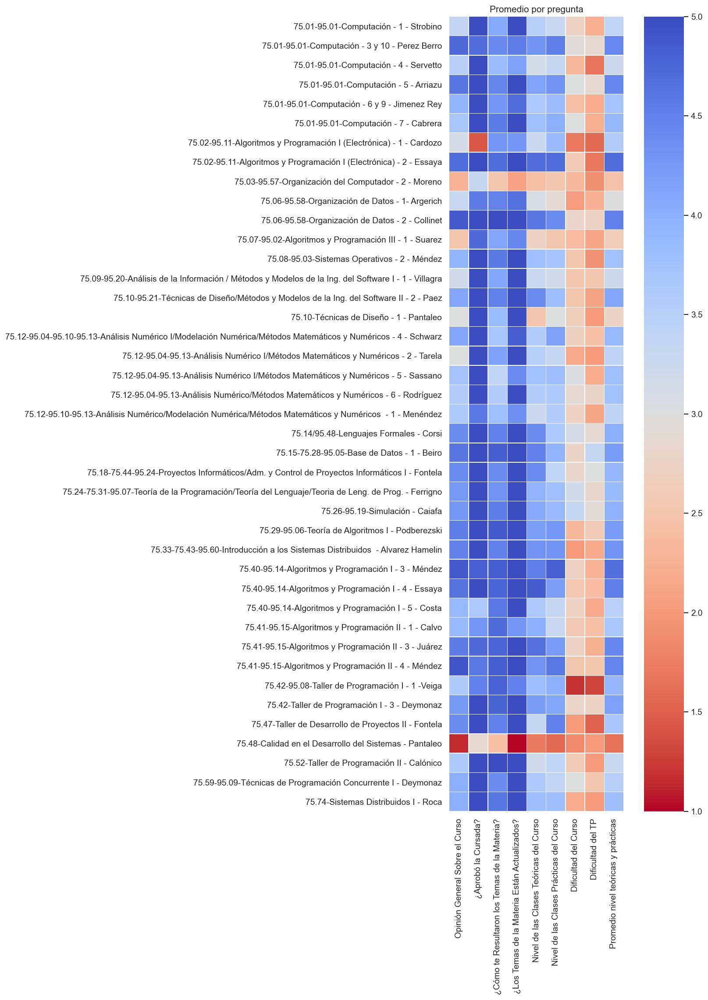

In [13]:
plt.figure(dpi=125, figsize=(6.4*1.5, 4.8*4))

sns.heatmap(data=comp_5p_mean, cmap='coolwarm_r',linewidths=.2, square=True, vmin=1, vmax=5)
plt.ylabel("")
plt.title("Promedio por pregunta")
plt.show()

## Histograma de promedios por pregunta
Por cada curso se calcula el promedio de cada pregunta numérica y luego se hace un histograma de esos promedios.

### Histograma de promedios de Opinión General Sobre el Curso

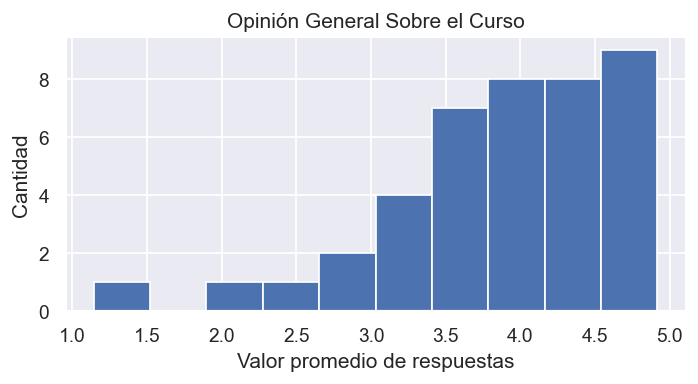

### Histograma de promedios de ¿Aprobó la Cursada?

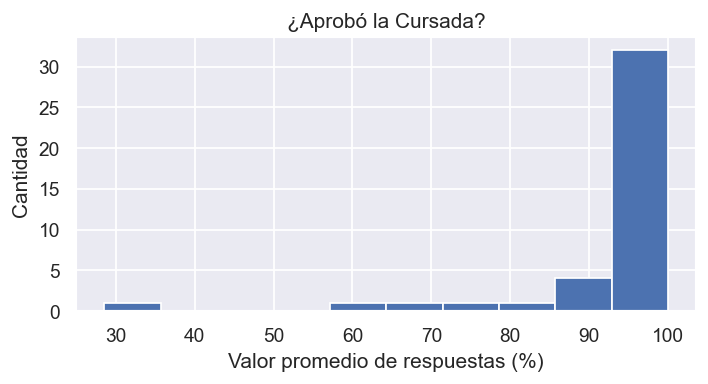

### Histograma de promedios de ¿Cómo te Resultaron los Temas de la Materia?

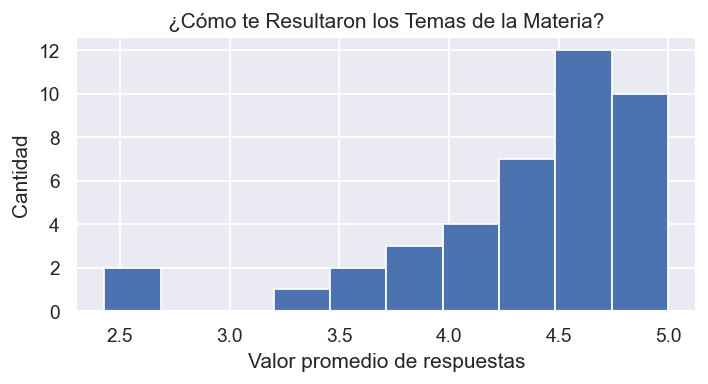

### Histograma de promedios de ¿Los Temas de la Materia Están Actualizados?

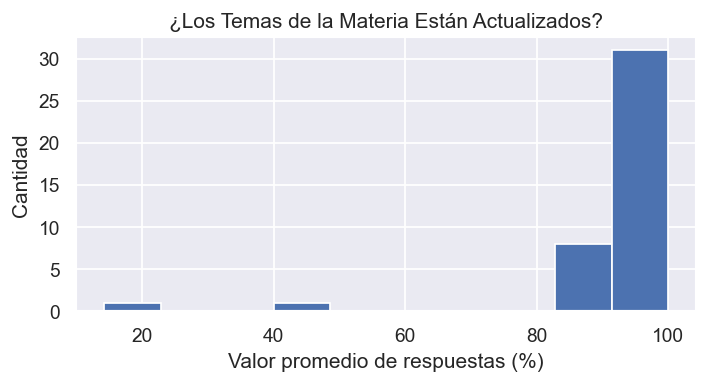

### Histograma de promedios de Nivel de las Clases Teóricas del Curso

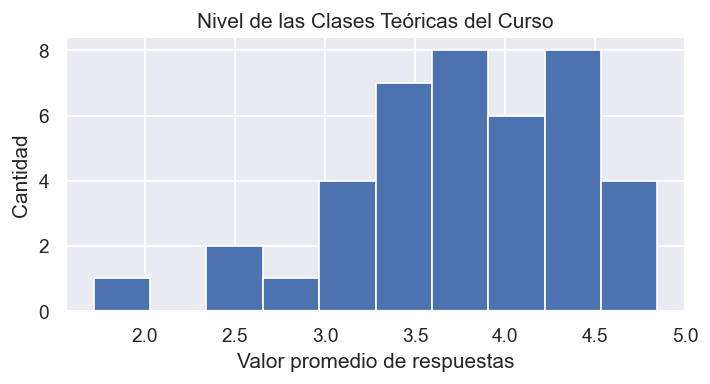

### Histograma de promedios de Nivel de las Clases Prácticas del Curso

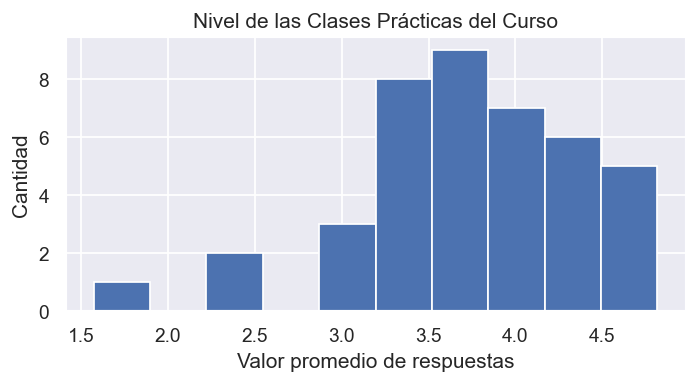

### Histograma de promedios de Dificultad del Curso

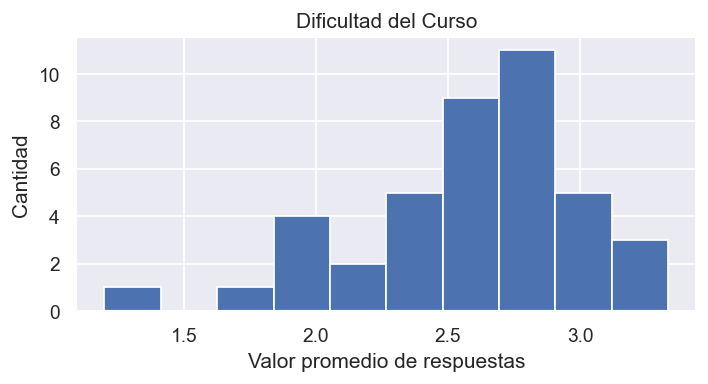

### Histograma de promedios de Dificultad del TP

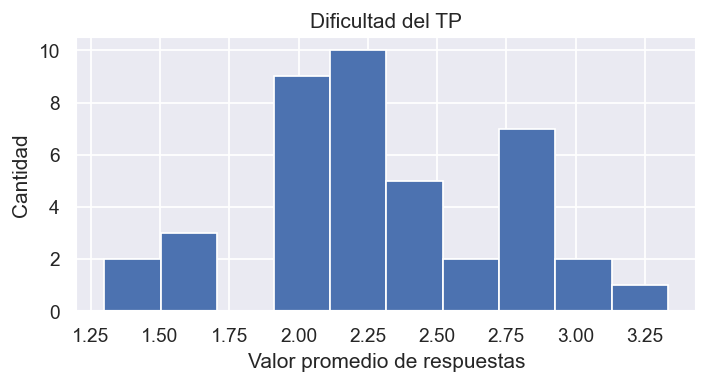

### Histograma de promedios de Promedio nivel teóricas y prácticas

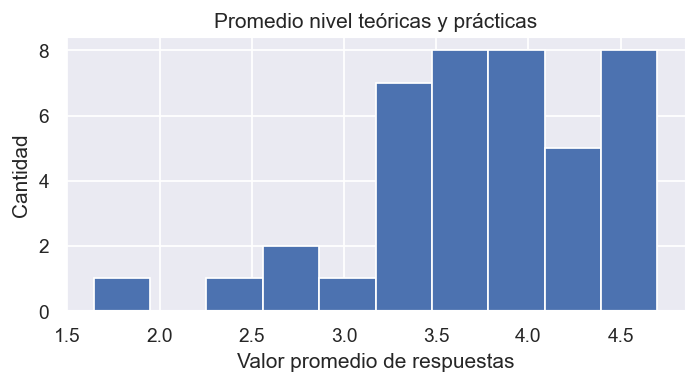

In [14]:
for col in num_cols:
    
    display(Markdown(f"### Histograma de promedios de {col}"))
    fig = plt.figure(dpi=125, figsize=(6.4, 2.9))
    
    values = comp_5p_mean[col].copy()
    if col in cols_sino:
        values *= 20
    
    plt.hist(values, bins=10)
    plt.title(col)
    plt.ylabel("Cantidad")
    
    xlabel = "Valor promedio de respuestas"
    if col in cols_sino:
        xlabel = f"{xlabel} (%)"
    
    plt.xlabel(xlabel)
    plt.show()

## Ranking de cursos por promedio

### Opinión General Sobre el Curso

Se analizan los promedios por curso de Opinión General Sobre el Curso. Se dividen en 4 contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores.

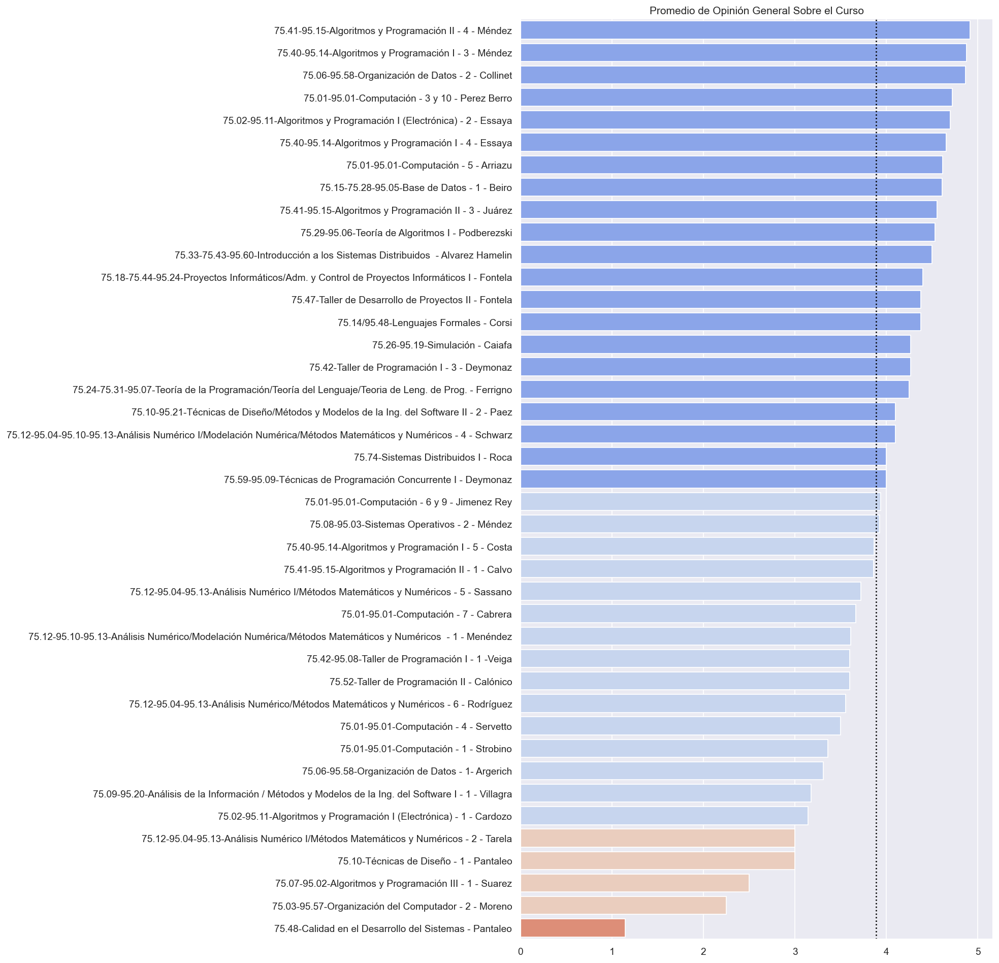

### ¿Aprobó la Cursada?

Se analizan los promedios por curso de ¿Aprobó la Cursada?. Se dividen en 4 contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores.

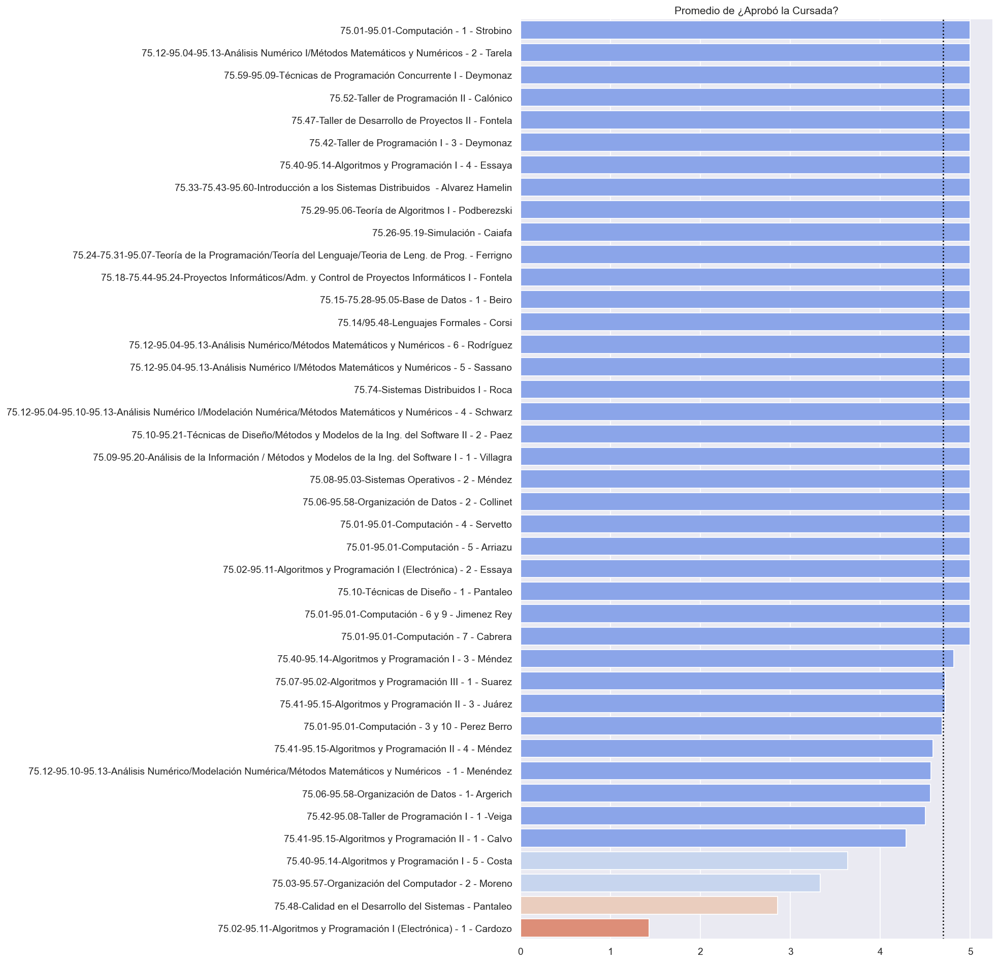

### ¿Cómo te Resultaron los Temas de la Materia?

Se analizan los promedios por curso de ¿Cómo te Resultaron los Temas de la Materia?. Se dividen en 4 contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores.

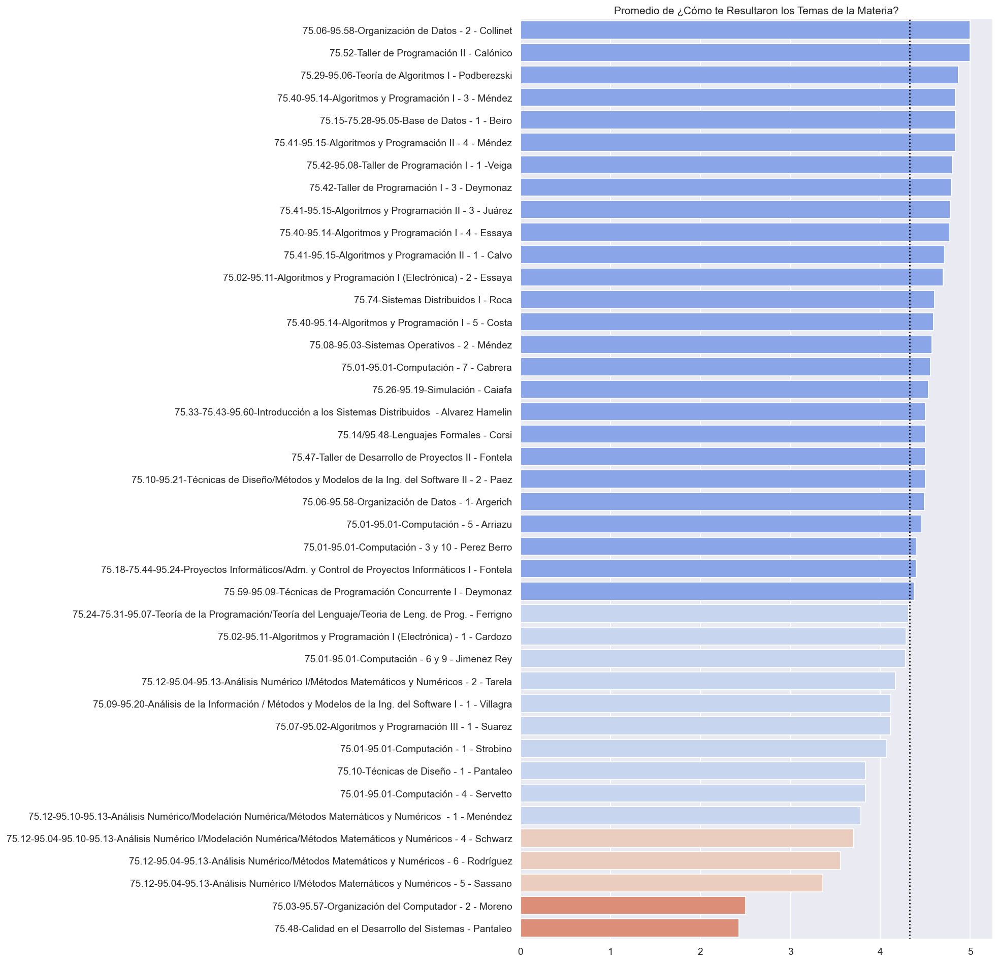

### ¿Los Temas de la Materia Están Actualizados?

Se analizan los promedios por curso de ¿Los Temas de la Materia Están Actualizados?. Se dividen en 4 contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores.

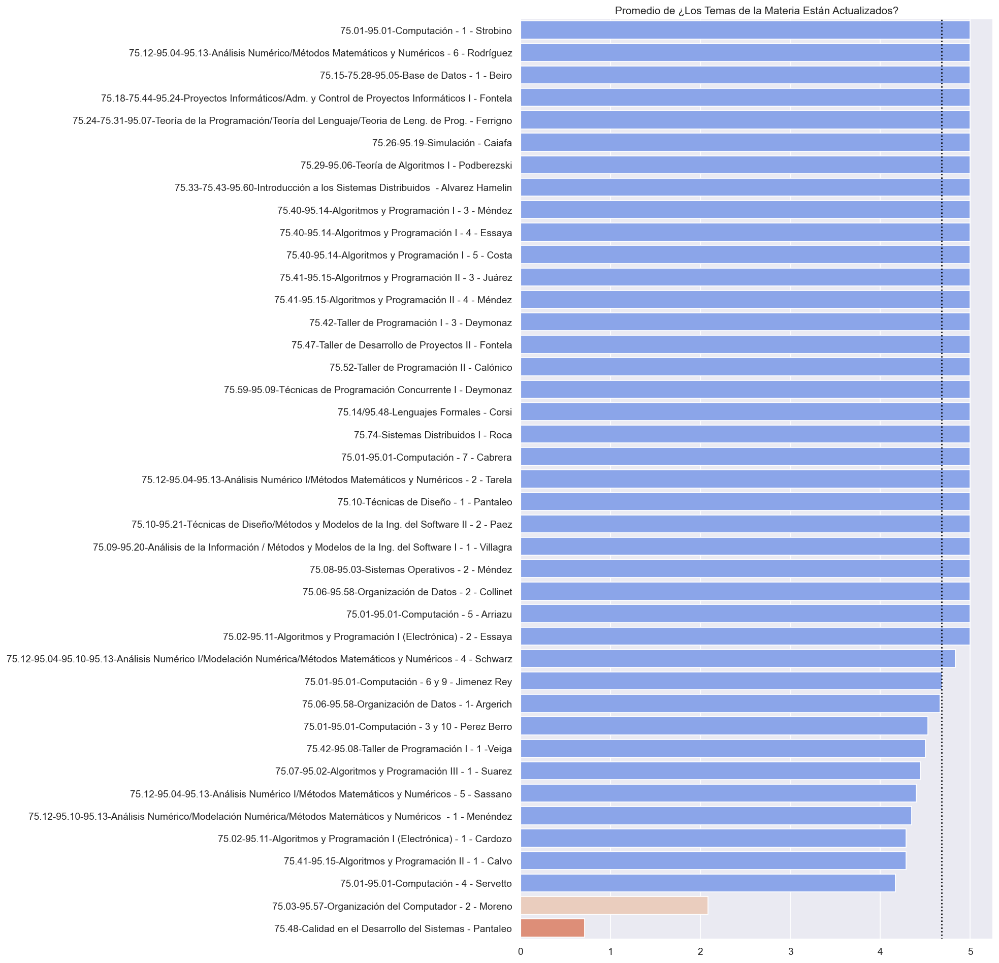

### Nivel de las Clases Teóricas del Curso

Se analizan los promedios por curso de Nivel de las Clases Teóricas del Curso. Se dividen en 4 contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores.

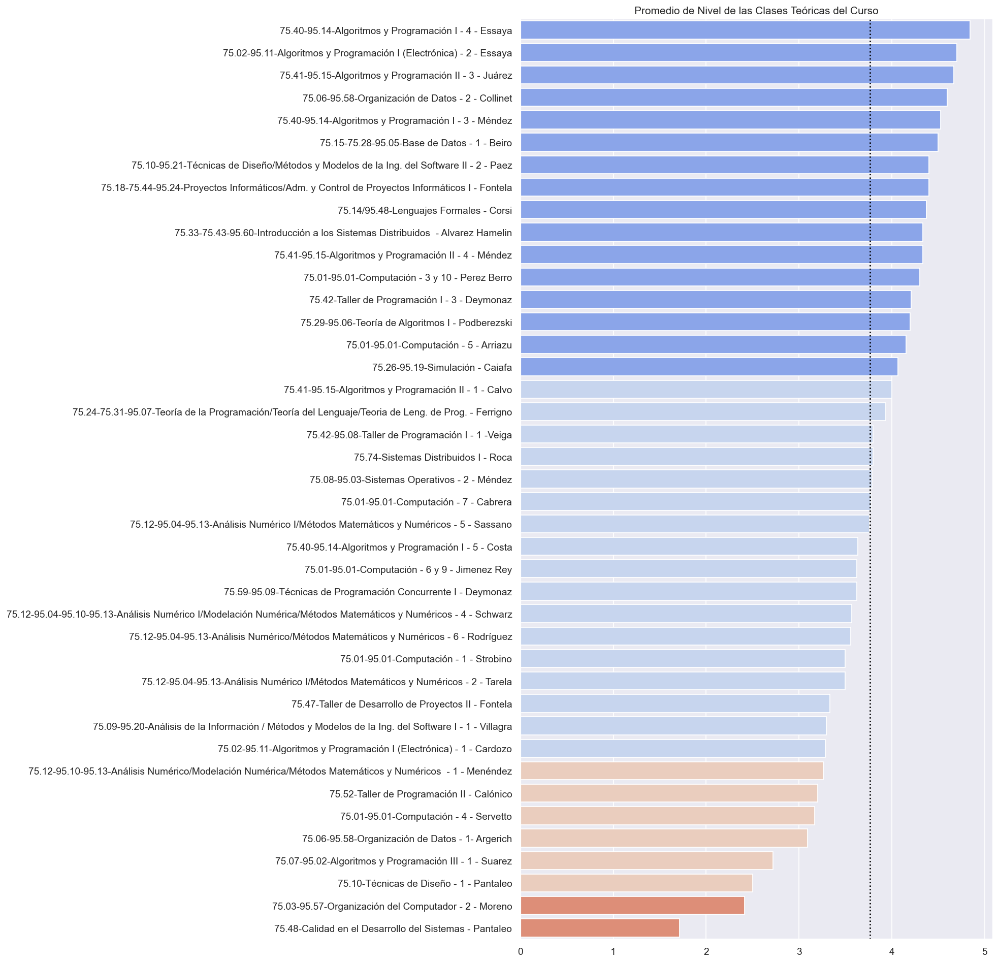

### Nivel de las Clases Prácticas del Curso

Se analizan los promedios por curso de Nivel de las Clases Prácticas del Curso. Se dividen en 4 contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores.

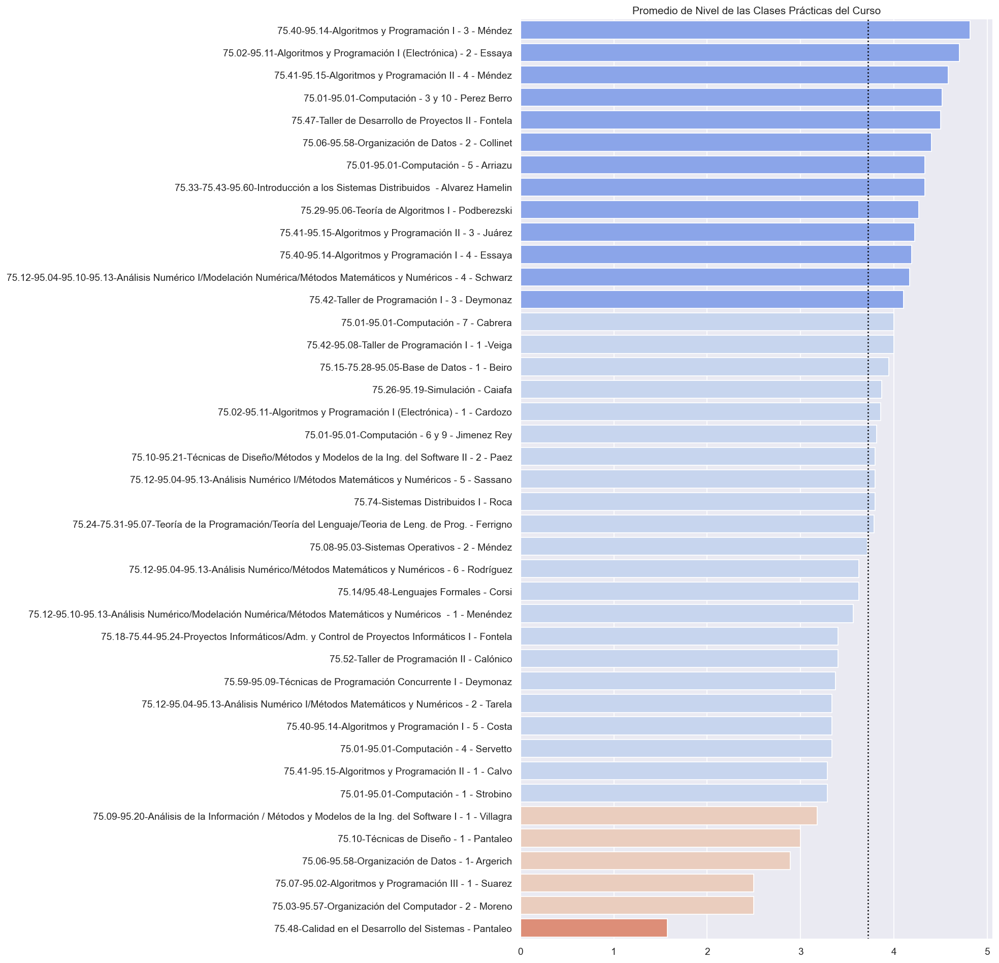

### Dificultad del Curso

Se analizan los promedios por curso de Dificultad del Curso. Se dividen en 4 contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores.

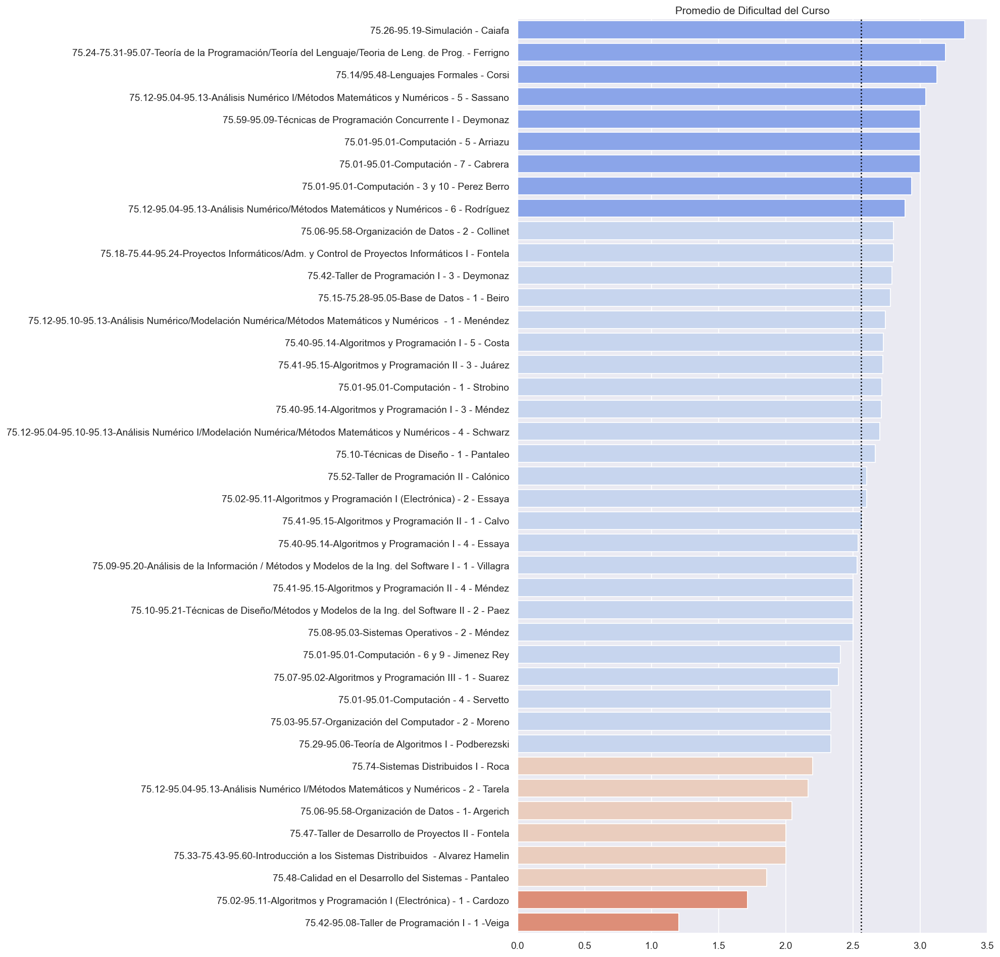

### Dificultad del TP

Se analizan los promedios por curso de Dificultad del TP. Se dividen en 4 contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores.

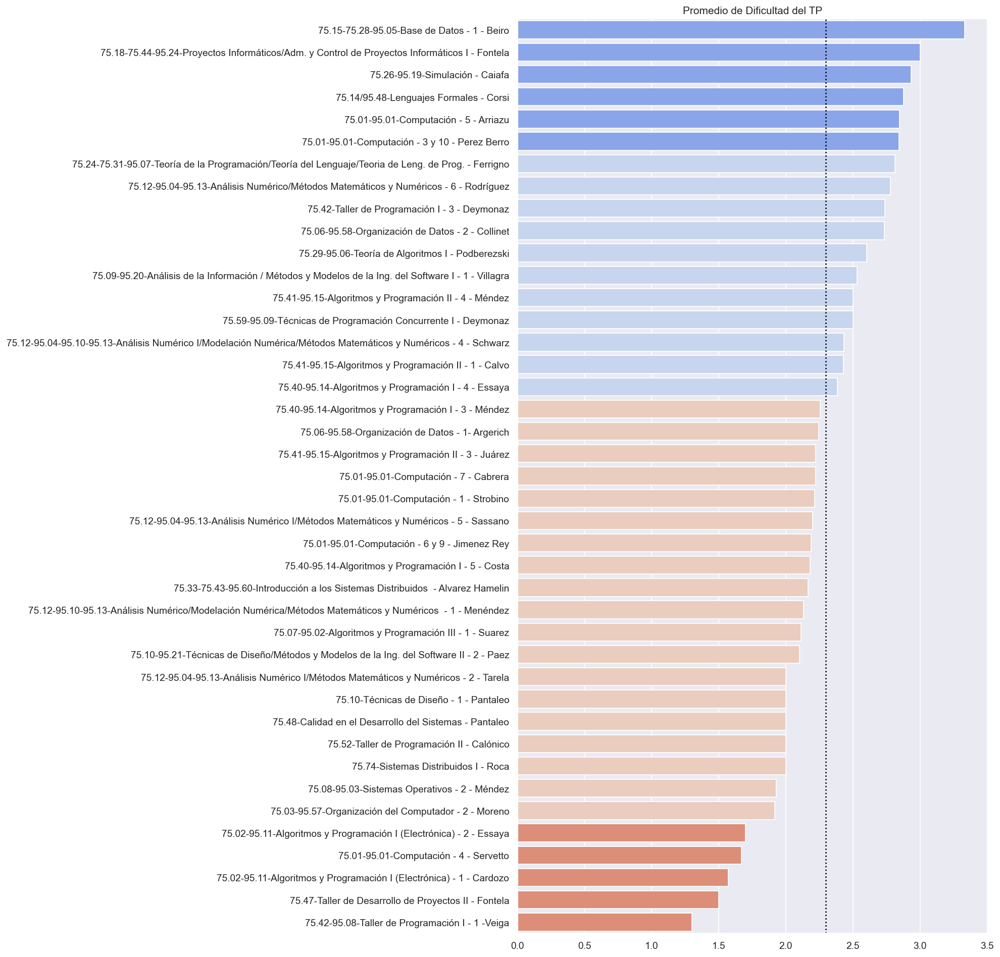

### Promedio nivel teóricas y prácticas

Se analizan los promedios por curso de Promedio nivel teóricas y prácticas. Se dividen en 4 contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores.

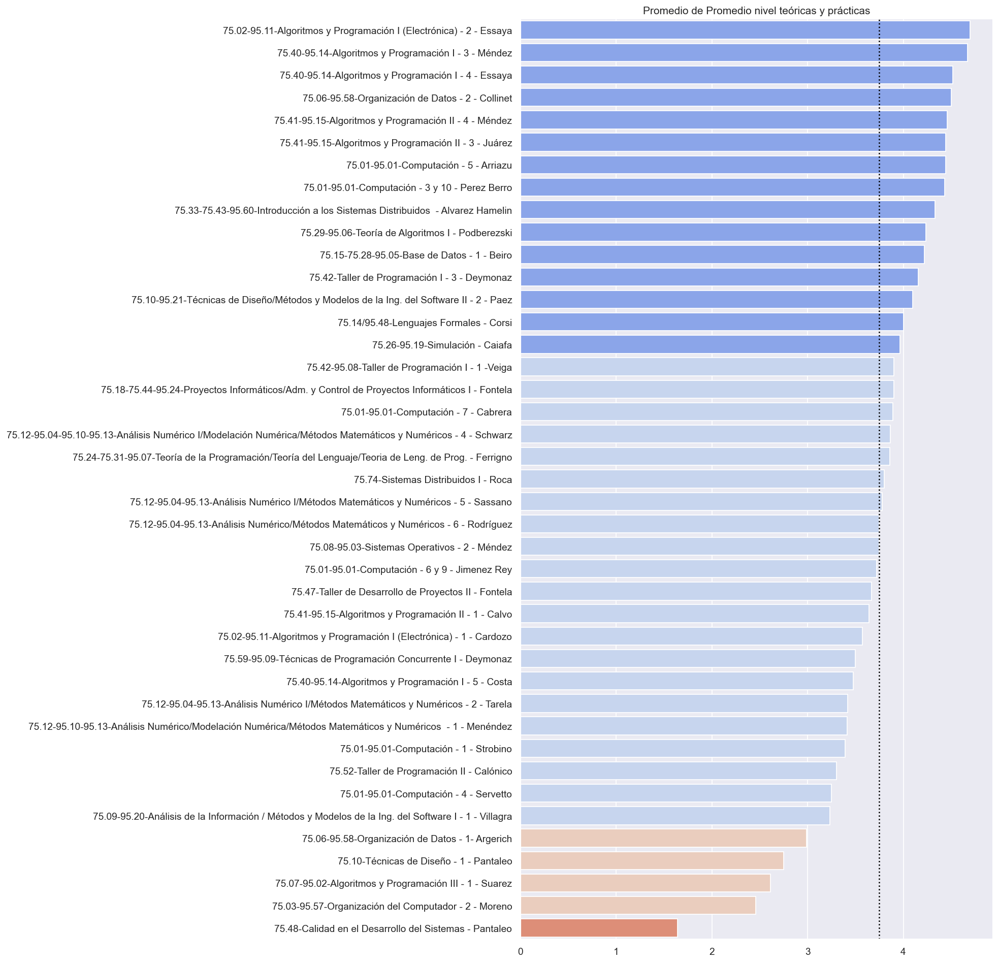

In [15]:
n_bins = 4

for col in num_cols:
    
    display(Markdown(f"### {col}"))
    display(Markdown(f"Se analizan los promedios por curso de {col}. Se dividen en {n_bins} contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores."))
    
    values = comp_5p_mean[col].sort_values(ascending=False)

    c = pd.cut(
        values,
        bins=n_bins,
        labels=sns.color_palette('coolwarm_r', n_colors=n_bins),
    )

    plt.figure(dpi=125, figsize=(6.4*1.5, 4.8*4))
    ax = sns.barplot(x=values.values, y=values.index, palette=c.values)
    #ax = values.plot(kind='barh', color=c.values)

    ax.axvline(values.mean(), linestyle=":", color='black')

    plt.title(f"Promedio de {col}")
    plt.ylabel("")
    plt.show()

## Correlacion Entre Variables

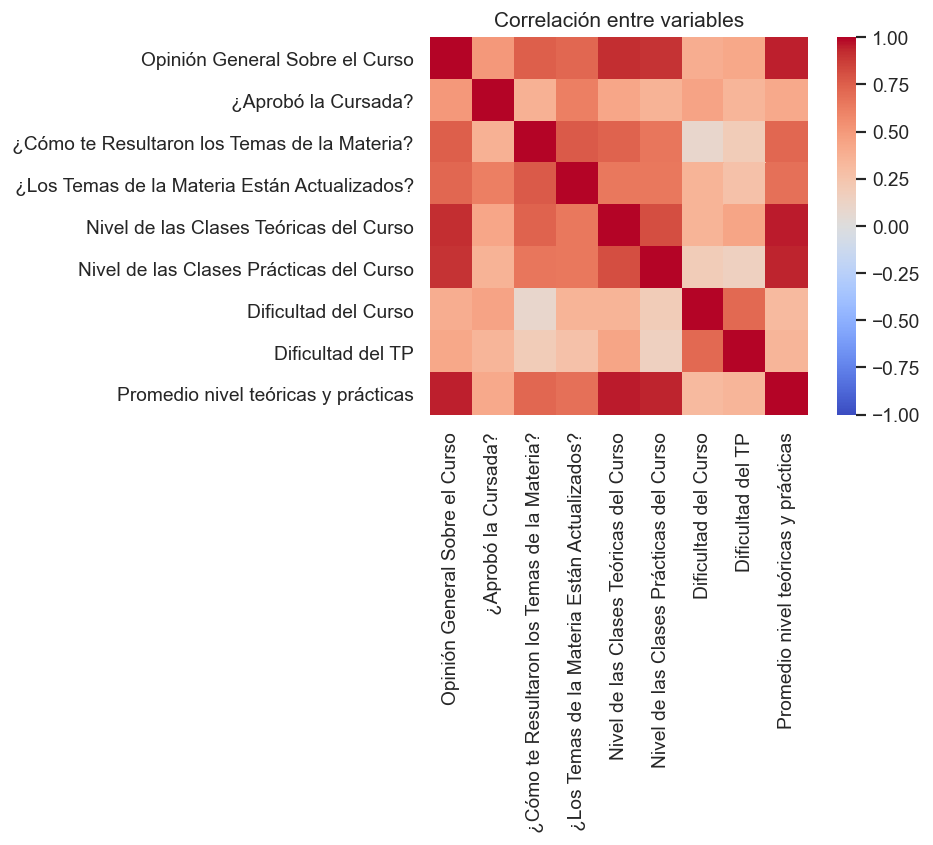

In [16]:
plt.figure(dpi=125)
sns.heatmap(comp_5p_mean[num_cols].corr(), square=True, vmin=-1, vmax=1, cmap='coolwarm')
plt.title("Correlación entre variables")
plt.show()

## Diferencia Entre Nivel de Clases Teóricas y Prácticas
- Hacia la derecha: Las clases teóricas son mejores que las prácticas.  
- En el centro: Poca o Ninguna diferencia.  
- Hacia la izquierda: Las clases prácticas son mejores que las teóricas.  

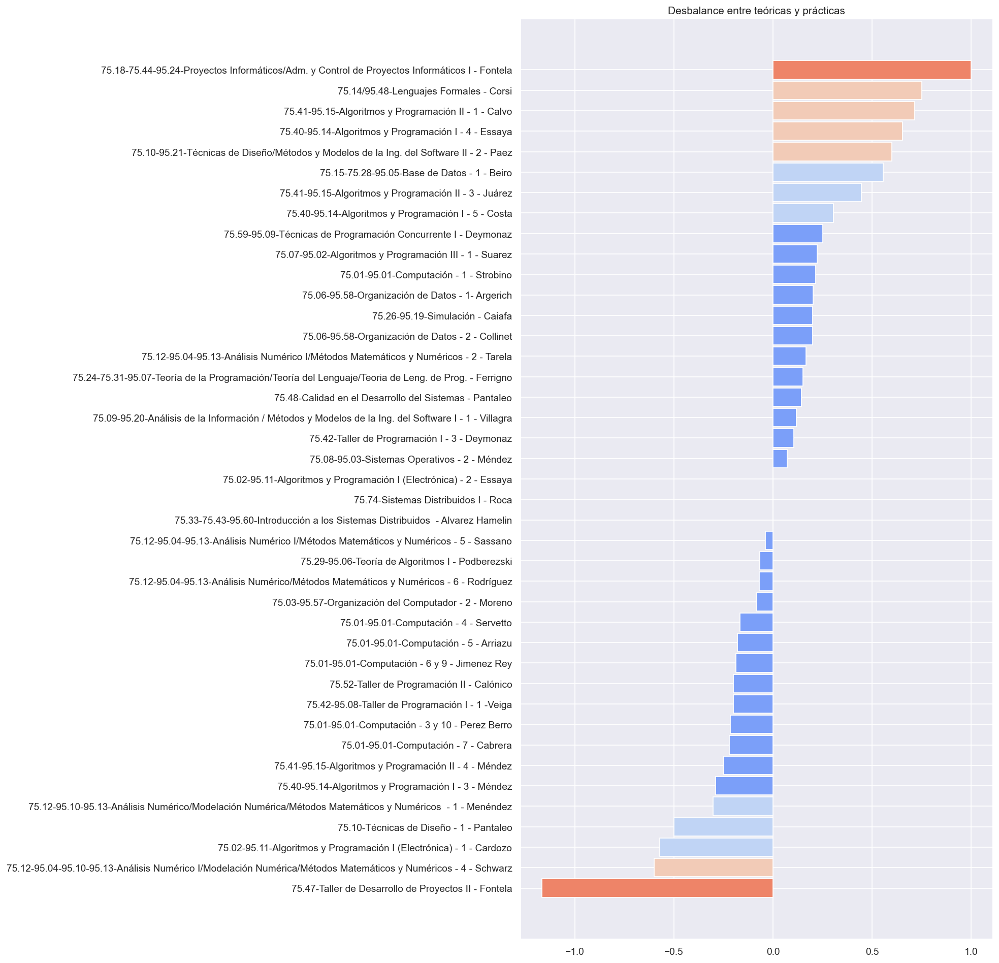

In [17]:
diff_teo_prac = (comp_5p_mean['Nivel de las Clases Teóricas del Curso'] - comp_5p_mean['Nivel de las Clases Prácticas del Curso']).sort_values()

plt.figure(dpi=125, figsize=(6.4*1.5, 4.8*4))

c = pd.cut(
    diff_teo_prac.abs(),
    bins=4,
    labels=sns.color_palette('coolwarm', n_colors=4),
)

plt.barh(diff_teo_prac.index, diff_teo_prac.values, color=c, height=0.9)

plt.title("Desbalance entre teóricas y prácticas")
plt.ylabel("")
plt.xlabel("")

plt.show()

## Emails

¿Cuánta gente completa el mail?

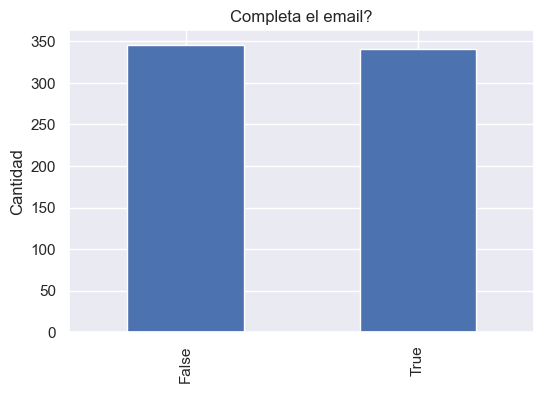

In [18]:
plt.figure(dpi=100)
(~comp['Email (opcional)'].isna()).value_counts().plot(kind='bar')
plt.title("Completa el email?")
plt.ylabel("Cantidad")
plt.show()

¿Hay emails duplicados?

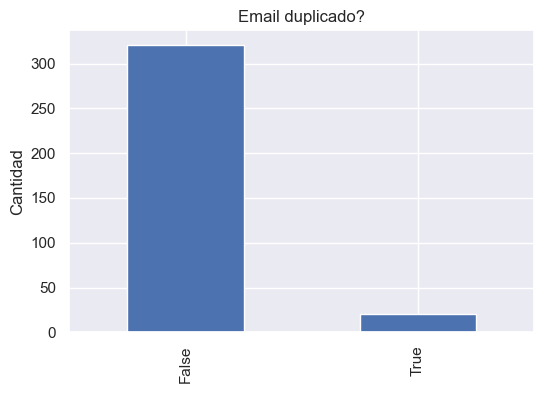

In [19]:
plt.figure(dpi=100)
comp['Email (opcional)'].dropna().duplicated().value_counts().plot(kind='bar')
plt.title("Email duplicado?")
plt.ylabel("Cantidad")
plt.show()

Quienes completaron el mail, ¿Permiten que se comparta al docente?

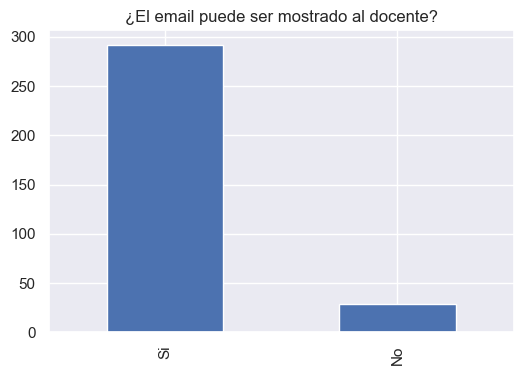

In [20]:
plt.figure(dpi=100)
comp[~comp['Email (opcional)'].isna()].drop_duplicates(subset=['Email (opcional)'])['¿El email puede ser mostrado al docente?'].value_counts().plot(kind='bar')
plt.title("¿El email puede ser mostrado al docente?")
plt.show()

# Comentarios por Curso

In [21]:
def procesar_comentario(c):
    lineas = c.split("\n")
    return "\n".join([f"{l}" for l in lineas])

for curso in comp['Elige el curso'].unique():
    display(Markdown(f"## Curso {curso}"))
    com = comp[comp['Elige el curso'] == curso]['¿Tenés algún otro comentario o sugerencia sobre el curso y la cursada virtual de este cuatrimestre?'].dropna()
    if com.empty:
        display(Markdown("_No hay comentarios_"))
    else:
        todos_los_comentarios = com.values.tolist()
        for comentario in todos_los_comentarios:
            if comentario == "":
                continue
            display(Markdown(f"- {procesar_comentario(comentario)}\n\n"))

## Curso 75.40-95.14-Algoritmos y Programación I - 4 - Essaya

- Si



- Es la única materia en la que me gusto la virtualidad. No me puedo imaginar haberla cursado presencialmente. Uno mismo se va acostumbrando a usar mejor la computadora y hace todo mucho mas fácil.



- Me gustaría que al retomar la presencialidad se mantegan ciertas herramientas que se han utilizado para la Cursada Virtual como Discord.



- Mejorar las prácticas y bajarle la dificultad a algunas cuestiones, especialmente porque hay gente que no sabe programar



- No, todo estupendo



- No, estuvo todo bastante bien



- Estaría bueno que los TPs grupales no sean ambos con el mismo grupo, para variar. 



- Dentro de todo, fue una buena cursada con respecto a la cátedra. Quizás lo que estaría bueno es que pongan los TPs antes de los parcialitos. Porque me pasó que me fue mal en el P1 y P2, y haciendo el TP1 pude entender mejor los contenidos del P1 (lo mismo me pasó con el TP2 con respecto al P2)



## Curso 75.02-95.11-Algoritmos y Programación I (Electrónica) - 2 - Essaya

- Muy buen curso en general



- la intensidad de la materia puede perjudicar la performance del alumno con otras materias, ya q, ilusamente, muchos(yo incluido) nos inscribimos pensando que seria la mas sencilla dentro de  3/4 materias intensas, y no fue asi



## Curso 75.08-95.03-Sistemas Operativos - 2 - Méndez

- Acelerar un poco el ritmo de las prácticas, a veces las clases se tornaban pesadas por el día/hora, y las preguntas nos agarraban un poco boyando en el aire.



- Son muy buenas y los docentes dedicados. A veces se pasan de vuelta los chicos de la práctica y dan 4 horas seguidas hasta el viernes a las 11 PM y se hace muy difícil mantener la concentración. Pero son muy buena gente y tratan de ayudarte, no son garcas. Mariano tampoco, pone todo porque te lleves algo de la materia. Se valora. Se aprende bastante.



- Muy buen curso, se sale aprendiendo bastante. Lo que se puede mejorar es el horario, +5hs de cursada seguida algunas clases, por lo que se dificultaba seguirlas hacia el final.

Estuvo bueno que den también algunas charlas sobre contenido extra (la implementación de git, y como funciona docker desde un sistema operativo)



- No



- En las clases teóricas hay que utilizar algun tipo de metodología para que el alumno no pierda el interes en las clases, alguna clases se alargaban a 5 horas y despues siempre habia que volver a ver el video de la clase porque no podemos estar 2 horas leyendo un texto plano de un apunte y despues 3 horas sin descansos en el medio de más teroría en la práctica. Recomiendo diapositivas o desglosar todavíua más el apunte o pedir par alguna clase ver un video introductorio y simple de la teoria que se va a ver en la clase para que no sea tan denso. Despues de eso muy buen curso. Recomiendo.



- Excelente curso, se destaca la dedicación de los docentes para enseñar y corregir. Los TPs son muy interesantes.



- La materia tiene demasiados temas y se dan todos muy por arriba. Los trabajos prácticos individuales resultan muy interesantes pero el tp de jos…es imposible. Sería mejor que den un trabajo práctico por ahí mas simple pero donde aprendas todo a ese trabajo que no se entiende nada y terminas copiando todo de internet. Una lastima porque los temas al verlos en materias posteriores me resultaron interesantes. No se si el problema son las correlativas o la forma en la que se dan los temas en el curso



- Personalmente me encanto el TP tenia mucho que ver con lo que veiamos en la teorica lo único malo fue el orden pero por la naturaleza del TP spungo que es imposible reordenarlo.



## Curso 75.09-95.20-Análisis de la Información / Métodos y Modelos de la Ing. del Software I - 1 - Villagra

- Los temas son muy interesantes y actualizados. El régimen de promoción esta muy bueno, te hace trabajar durante toda la cursada, y llevar la materia al día. Sin embargo, la frustración por desaprobar actividades, sin entender el por qué, y la falta de empatía de los profesores por explicarte esto, hacen que la cursada sea mucho más pesada. La nota de tus actividades se encuentra totalmente ligada a quién te corrige. Considero que es absurdo que no te permitan ver los videos en una velocidad más rápida, más aun teniendo en cuenta que los videos tiene cuestionarios, o sea que si como alumno no entendimos algo por verlo más rápido, nos vamos a dar cuenta y vamos a tener que volver a verlo, o caso contrario desaprobar las actividades. Dicha sugerencia fue realizada a principio de curso, y descartada sin si quiera analizarla. 



- La materia es excelente, es una de esas materias donde los docentes saben lo que dan y dan lo que les gusta. Hay un montón de temas que son muy interesantes y otros que me gustaría haber visto en mayor profundidad (por ejemplo, que se mas de UX/UI en vez de tanto UML que ya hace anios nadie usa, ojo no digo que MDD no tenga sentido, te ayuda a pensar. Pero es demasiada bola para una herramienta en desuso PARA MI).

Por otra parte los docentes siempre tuvieron una gran predisposición a consultas y a dar una mano en lo que haga falta. Se adaptaron a los alumnos sin sacrificar calidad de curso. A pesar de ser una materia de "gestión" y que mas de un ayudante de algoritmos te diría que "la materia no sirve para nada, todo de gestión es humo", ves un montón de temas que, irónicamente no son soft skills sino herramientas técnicas (prototipado, disenio de UX, modelar una BDD, algo de manejo de API's). Sin mencionar que la materia no es ni difícil ni extremadamente demandante. En lo que a mi concierne los que van a cursar con Gonzales (que recuerdo, es 2/3 del alumnado que hace la materia) no les interesa/dejaron de querer aprender y van a robar la materia (una vergüenza). Esto significa que Aninfo es una de las mejores materias de la carrera? No, ni ahí, le falta para eso o al menos reestructurar algunos temas (de nuevo, denme mas UX/UI y quizás menos UML, un diagrama de estados nadie lo usa... perdón Sergio). Pero a mi si me consta que es una materia muy linda y con un montón de temas que no esperas mucho a priori, pero que te aportan mucho.

Conclusión: Aninfo con Villagra es alta materia y agradezco haberla hecha, los que roban la materia no les da la cara de chantas...






- Que contesten bien las preguntas en vez de generar mas dudas. Tareas semanales que implicaban 2 o 3 dias de tiempo todas las semanas no es algo tan sencillo de realizar.



- Daban material teórico posterior a entregas para las cuales habría resultado útil tener dicho conocimiento, lo cual causaba que tengamos reentregas o notas bajas.
Había múltiples actividades dependientes de otras, lo cual causaba que si reentregabas una materia automáticamente termines reentregando la segunda. Por lo tanto, terminaban castigando 2, 3 o incluso 4 veces por el mismo error, incluso meses después de cometido el error y teniendo aprobada la actividad donde había un error.
Todo el tiempo dicen que esperan que hagamos un poco de trabajo más allá, que hagamos supuestos, que expliquemos y pensemos extra. Sin embargo cuando suponías o querías hacer algo extra te terminaban bajando puntos por lo que supusiste o hiciste extra.
Te enseñaban cómo hacer User Stories y Modelos de Dominios bien mucho después de las actividades que correspondían a esos temas. Para ese momento más de la mitad del curso había tenido que reentregar la actividad y había gastado más tiempo del que habría sido necesario para intentar hacer las actividades bien, sumesele a esto el tiempo de la reentrega. 
La comunicación de parte del equipo docente es pésima por el lado de los titulares Guido de Benedetti y Sergio Villagra. Sus correcciones a actividades eran siempre confusas y nunca quedaba claro qué errores había. En parte esto se debe a la pésima capacidad para transmitir una idea que tienen y a lo pésimo que nos preparaban para varias de las actividades. Me parece un desastre que casi siempre había que pedirles detalles extras sobre las correcciones porque sino no se podía hacer lo que esperaban. Muchas veces las correcciones que hacen son completamente sin sentido y desde el parte del alumno se siente que solamente quieren molestar pidiendo cambios (lo cual jamás me pasó en materias anterior a esta). 
No solo la comunicación de ellos es mala, sino también su comprensión de lectura. En varias ocasiones sentí que eran incapaces de comprender lo escrito en las entregas o que carecían de sentido común al momento de corregir.  
Por otro lado, hubo una semana en la cual había que hacer una entrega y nadie del curso estaba enterado porque jamás se nos avisó. El calendario decía "Taller de Prototipos" y nadie entendió que eso significaba entrega de prototipos. 
Como anteúltimo comentario, resalto la gran subjetividad que tienen los profesores al momento de corregir y puntuar. El ejemplo más claro de esto es un alumno que claramente dejaron a propósito sin reentregas a pesar de que sus actividades no estaban necesariamente por encima del promedio del curso. Otro ejemplo es la nota de conducta de dicho alumno, quien jamás dijo una palabra en clase pero tuvo una nota de conducta de 9, mientras que alumnos que participaban activamente en muchas clases tenían nota de conducta de 7 o menor. ¿La moraleja es que cuanto menos participas mejor alumno sos según ellos?
Por último, y lo que me parece más grave, tras pedir detalles sobre correcciones que recibí en una de las actividades, recibí una respuesta con un tono notablemente agresivo y atacante innecesariamente. Tras consultar con otros alumnos sobre si mi mensaje pidiendo detalles estaba mal expresado o tenía un mal tono, me confirmaron todos que fui completamente neutro y solo pedía explicaciones mayores. Sin embargo el profesor Villagra respondió agresivamente lo cual me parece una actitud deplorable de parte del titular. 



- Quizá algo más de feedback sobre el TP durante la cursada, en vez de todo al final



- Me encanto! 



- Al ser cursada virtual, se pudo aprovechar mucho el tiempo por ejemplo de viajes para hacer sus actividades. 



- La verdad contento con la cursada y con cómo se encaró virtualmente. Al ser virtual podía asistir a tiempo trabajando también desde casa, el tener grabadas las clases y poder revisarlas fue siempre útil al repasar temas. 



- En general la materia es mucho mas copada que el resto de las materias del departamento. La dinamica es inovadora, los ejercicios practicos en clase son atrapantes, y los temas son interesantes, utiles, y te dan un vistazo mas real de la aplicacion del desarrollo de software en la industria, que en el resto de las materias del departamento. 
El problema que encontre es el que mencione previamente respecto la densidad e intensidad de las tareas. Si bien hay cierta sensacion de que se hacer mucho foco en temas que no parecieran ser tan importantes, el problema no es tanto la calidad las tareas, si no la distribucion durante el cuatrimestre, y las dudosas correcciones de los docentes.
Es dificil organizarse como alumno cuando las primeras semanas se le dedica cierta cantidad de tiempo a la materia, y llegado cierto punto tenes que dedicarle el doble, y encima probablemente tengas que dedicarle mas a causa de las tareas reentregadas 2 veces por la laxitud en las correcciones de los docentes.
Sin embargo, es evidente la voluntad de los profesores de hacer una materia bien didactica con buena calidad.
Es muy util que el alumno tenga una aplicacion real de programacion por primera vez en la carrera con tecnologias actuales, dado que te abre los ojos a que te vas a encontrar al salir al mercado laboral. No tengo dudas de que iterativa e incrementalmente los docentes ajusturan los puntos debiles, y mantendran los fuertes para seguir perfeccionando la materia.
Muchas gracias.



- Que no den muchas vueltas a los alumnos ciertos temas en los trabajos y las clases practicas



## Curso 75.33-75.43-95.60-Introducción a los Sistemas Distribuidos  - Alvarez Hamelin

- No



- Las unicas críticas que tengo son a nivel tiempo y comunicación de las correcciones de los trabajos prácticos. La materia está bastante cargada de TPs (4 en total), donde el primero y el segundo en este cuatrimestre estaban prácticamente relacionados, y hubo bastante demora en obtener las notas/feedback para saber que corregir. Además, ya con la cursada terminada (en mi caso promocione) nunca supe la nota de 2 de los 4 TPs ni la nota de concepto. Además a fin de cuatrimestre hubo descordinación entre teorica y práctica para dar las exposiciones de los últimos 2 TPs, pero creo que para el cuatrimestre que viene es muy probable que de la experiencia de este cuatrimestre no vuelva a ocurrir.



- Cachete Horn es lo mas, que buena practicaa. Los mejores profes



## Curso 75.01-95.01-Computación - 3 y 10 - Perez Berro

- Excelente. Me encantó como lo hicieron. Muchas gracias. 



- La verdad que no. Todo muy bien!



- Muy buena actitud de las 2 profes del curso 10 



- Muy buenas profesoras, siempre predispuestas a que entendamos. Muy conforme con la cátedra .



- Muy buen curso. El tener todo el material a disposición con ejemplos detallados de cada tema que se explica lo hace muy llevadero.



- No, la verdad que estoy muy conforme y me hubiese gustado que otras cátedras fueran iguales en cuanto a la modalidad de trabajo



- Quizas seria mejor que las clases sean de todo el curso junto, hay dudas que se resolveran en un meet que pueden ayudar a mejorar los conceptos y a su vez tambien sirve para organizarse ya que se pondria un horario fijo



- Nada, solamente agradecer por el tiempo y las aclaraciones brindadas! 



- No, quede muy satisfecho



- No



- el curso es excelente! ordenado , organizado tal vez la única modificación seria los videos teóricos con audio pero de todos modos se logra entender el contenido  a la perfección



- No



- No.



- Considero que realizar los trabajos es una gran ayuda para el aprendizaje, resultandome muy util para aprender al mismo tiempo de mis compañeros.



## Curso 75.12-95.04-95.10-95.13-Análisis Numérico I/Modelación Numérica/Métodos Matemáticos y Numéricos - 4 - Schwarz

- Muchas gracias!



- Me gustaron mucho las clases prácticas, me gustó la manera de enseñar los temas y siempre dejar alguna pregunta para que los alumnos busquen e investiguen por su cuenta. Siento que aprendí mucho de esa forma. 



- rodolfo le pone muy buena onda y ganas a las clases, pero a mi y a varios compañeros/as nos costó mucho seguirlo en las clases, ya que organiza la información en las diapositivas de una forma extraña (pone el contenido antes que los titulos), creo que las clases mejorarian mucho si organizara los contenidos mas estructuradamente.



- Personalmente, me gustan más las clases teoricas en donde se explican los contenidos en profundidad. Ya que a medida que leia los contenidos teoricos previo a las clases me surgian dudas.



- cuando dan ejemplos de aplicaciones en la vida real la clase se vuelve mas interesante



- Los profesores, no solo en esta materia, ya no respetan los horarios de los alumnos en cuanto a los terminos de cursada. El tp se extendio 3 semanas luego de la esta, haciendonos perder 3 fechas de final + otros finales de otras materias. Voy a tener que patear dos finales, mas el que ya tenia, mas los del cuatri que sigue y voy a llorar todos los dias de enero



- Muy bueno todo, lo disfruté



- Me pareció muy bueno lo que se hizo en la práctica de que cada clase tuviéramos un ejercicio de cada tema para hacer y que a alguno de nosotros nos toque exponerlo y a otros estar de "correctores" para aportar sus ideas o dudas. Creo que es muy útil para llevar la materia al día. 



- Lo único que no me pareció de lo mejor es que fue demasiado contenido para ver, (en cuanto a videos y contenidos teóricos) por lo que se dificultaba seguir al día la materia. 



- La practica esta muy buena, creo que la teorica debera tomar las cosas buenas de la practica y aplicarlas. Como por ejemplo videos teoricos cortos como para introducir los metodos.



- no



- Creo que ya opine todo, solo quiero agregar que me gusto bastante la cursada y la clase de los viernes con ejercicios me resultaron utiles para llevar la materia. La mayoria de las dudas podias resolverlas ahi mismo



- Las teóricas son un poco tediosas, pero no es culpa del profesor (que mostró muchos ejemplos y las hizo lo más interesantes posibles), creo que es por la dificultad de los temas a nivel teórico.
Me gustó mucho el formato de la práctica. Tener que resolver ejercicios para todas las clases hace que tengas que estar al día con los temas, o aunque sea tener una idea para poder participar de la clase como "corrector". Supongo que la modalidad de presentar los alumnos funcionó porque todos los que presentaron lo hicieron a consciencia, y que no funcionaría tan bien si quien presenta no tiene idea del tema. Por eso me parece justo que, si se mantiene este formato, se avise con tiempo (una semana aprox) a quien le toque presentar, para que pueda organizarse y preparar bien el tema, y que la clase sea lo mejor posible para que le sirva a todos.
Por otro lado, el TP integrador resulta un poco demandante (sobre todo teniendo una carga similar en todas las materias que se cursan), pero termina cumpliendo con su objetivo de integrar los temas. Al preparar la defensa final todos los temas empiezan a cerrar y te das cuenta que sirvió haberlo estudiado y haber realizado entregas a lo largo del cuatrimestre. Me parece una actividad difícil pero muy útil si se hace prestándole la atención que necesita. Fue muy importante la ayuda de nuestro corrector, Germán, para no trabarnos cuando no sabíamos como avanzar. Y las presentaciones previas a la final también fueron muy útiles, para poder ir ajustando todos los errores y llegar con la mejor versión posible a la última entrega.
Por último, quiero agradecerle a Rodolfo, Germán, Micaela y los/las demás que conforman la catedra por la buena onda durante la cursada y la predisposición para atender dudas (durante la clase o por fuera). Y por el buen trato a la hora de dar la presentación final. A pesar de ser el 3er cuatri virtual se nota que le pusieron mucha onda y eso como alumna se agradece mucho. 



- No, estuvieron excelentes. Son un buen equipo.



- Particularmente no me gusta programar (incluso no me considero bueno) y quizás el hecho de que sea obligatorio es un poco molesto, pero como estudiante de ingeniería considero que me tengo que adaptar a la situación



- Creo que habría que hacer todo lo posible para que los temas de la teórica y la práctica vayan lo más juntos posible. Yo terminé de entender los temas en las clases prácticas, me costó imaginarlos en abstracto solamente con las teóricas. Si las clases de los mismos temas están juntos se puede entender el tema sin que haya pasado mucho tiempo desde la clase teórica.



- Si bien me costó aprender a programar en Python (y aun considero que tengo dificultades para aplicarlo en algunos casos), considero que es necesario saber lenguajes de programación en ingeniería, por lo que tener que presentar ejercicios en las clases prácticas y exponer el Trabajo Práctico me fue de gran ayuda. 



- Me parece que es una materia donde se podria aumentar la exigencia en la programacion, y disminuirla en terminos teoricos de parciales o finales



## Curso 75.18-75.44-95.24-Proyectos Informáticos/Adm. y Control de Proyectos Informáticos I - Fontela

- El curso se manejó perfectamente de manera virtual 



- No



- distribución pareja de lecturas y videos para cada semana, según corresponda.



- No aplica



## Curso 75.12-95.10-95.13-Análisis Numérico/Modelación Numérica/Métodos Matemáticos y Numéricos  - 1 - Menéndez

- No



- Yo me pregunto porque nunca evaluaron la posibilidad de dar clases en vivo como hacen casi la totalidad de fiuba, y digo casi porque solo conozco las materias de mi carrera por las que voy transitando. Por  qué suben videos, que encima son un plomazo, si tienen un horario de clases destinado a eso; por otro lado la practica te obligan a vos ir con dudas para resolverlas, eso es algo que tampoco entiendo, te obligan a ver todos los temas antes estando en 0 y de ahi resolver dudas; nuevamente me pregunto porque no dan clases en el espacio que se les fue concedido. Si bien aprobe la cursada es mas por esfuerzo personal de romperme la cabeza y mirar una y otra vez los videos y leer algun libro que lo que le corresponderia hacer a los docentes. No soy partidario de que un alumno mire videos antes y despues resolver dudas, es limpiarse las manos por parte de los docentes de dar clases. Para que se den una idea aprobe la cursada dejando de ir tanto practica como teorica a partir de la 2da semana de comienzo de cursada (con clase me refiero a las clases de consultas, porque clase como tal donde se explica un tema desde 0 no existió), solo mirando los videos, por lo tanto es evidente que algo falla por parte del curso.




- No



- no



- no



- Tratar de tener mas ejercicios tipo parcial y de la guia resueltos para practicar



- Mi principal comentario es que los videos de la teoría deberían repensarse o complementarse con algún texto. 



- 
Puedo ir a jugar al futbol con mis compañeros , salir a cenar , hacer actividades fisicas  y muchisimas otras cosas pero sin embargo no puedo ir a estudiar a mi querida facultad.
La virtualidad tiene muchisimas desventajas que no se ven y que nadie menciona , te mantiene completamente inactivo ya que uno se encuentra sentado todo el tiempo ya sea por el estudio o por ver las clases , y te genera serios problemas de vision al estar todo el tiempo en frente de la pantalla.Yo nunca tuve problemas de vision y estos dos años tuve que utilizar anteojos con alto grado de aumento , y eso por estar todo el tiempo en constante interaccion con la pantalla.Hay materias de 6 horas corridas !!!! una completa locura !! (sistemas operativos martes jueves 17 23 hs y es de las unicas catedras que hay).
Por favor , volvamos a las clases presenciales.



- Los trabajos prácticos me parecieron muy interesantes, pero el último me resultó un poco dificil de comprender la consigna.



- Mi principal crítica es el poco tiempo dado para la resolución del parcial. Sugeriría agregarle *al menos* veinte minutos más.



## Curso 75.39-Aplicaciones Informáticas - Ierache

_No hay comentarios_

## Curso 75.06-95.58-Organización de Datos - 2 - Collinet

- Excelente curso, buenas clases tanto teóricas como prácticas, siempre con buena onda, buena disposición y todo lo que se evaluó fue acorde a lo que se dio en clase, sin animo de querer perjudicar al alumno. Las correcciones fueron justas y justificadas, sumado a que siempre trataban de hacer todo lo posible para ayudarte a aprobar la materia. Mi único comentario "negativo" es que el Oral Promocional debería ser un poco distinto, a que me refiero, no lo veo tan diferente a lo que es el final, ya que solamente difiere en que no tenes que rendir un examen escrito, teniendo aun así que estudiar todos los temas. Pero fuera de esto, excelente cátedra y las charlas del final de la materia me resultaron sumamente interesantes, ojalá que sea esta la cátedra de vanguardia para esta materia porque este grupo docente se lo merece.



- Personalmente estoy muy agradecido de haber podido cursar en esta catedra, pude entrar solo por que otra persona se cambio de curso. Me encantaría que en un futuro todos los que quieran puedan cursarla y aprovechar lo buena que es. Sigan asi!



- Muy buena cursada, muy buen curso. Como comentario afuera del curso,estaría bueno que ya se empiece a platear formas de volver a la semipresencialidad para todos los cursos, en el caso de las practicas por sobre todo, seria muy util y mas ameba la cursada. 



- El curso esta 10 puntos en general. Hay alguna que otra teórica que considero podría mejorarse como Naive Bayes y ética. Pero es simplemente por buscar algo. La cursada virtual esta perfectamente manejada



- Que sigan así, excelente curso.



- Entró a mi podio de las mejores cursadas que hice durante mi carrera. Súper recomendable. Es un curso pesadito en cuanto contenido pero nos brindan todas las herramientas necesarias para estudiarla y llegar de la mejor forma a las instancias de evaluación. Lo que más destaco es que son profesores que escuchan al alumnado en las encuestas internas que ellos manejan. Ojala se mantenga virtual (a lo sumo parciales y finales presenciales).



- Por favor expliquen desde el principio cómo es el sistema de puntuación, porque me es completamente confuso



- Capaz teniendo una guía de ejercicios podría ayudar a que los ejercicios del parcial no sean tan sorpresivos.



- Muy bueno lo de las charlas. 
El sistema de evaluación es muy justo y lo mantendría. 



- Buen trato de parte de todos los docentes. Estaría bueno que remarquen que se puede hacer consultas por slack.



## Curso 75.29-95.06-Teoría de Algoritmos II - Buchwald

- La materia me encanto, son un montón de temas muy copados. Por materias avanzadas como esta es que vine a la facultad. También es muy bueno tener a Buchwald en una materia avanzada como corresponde. Porque seamos honestos, cualquiera puede dar los temas de algoritmos, pero Buchwald es capaz de aprender temas muy avanzados y/o complejos en muy poco tiempo. Es el tipo de personas que necesitas dando temas avanzados, no temas básicos. Es un golazo (en ese sentido y otros) el curso. 

Espero que la materia se vuelva a dar en otro momento, no me gustaría que queden los temas o la idea de la materia en un solo cuatri como una anomalía.



## Curso 75.06-95.58-Organización de Datos - 1- Argerich

- Que se haga virtual



- No, un excelente curso. Totalmente recomendado



- Prefiero una cursada virtual, porque esto presencial me lo imagino como la peor catedra que cursé hasta ahora.



- No sé si los contenidos son todos igual de relevantes, pero se le da la misma importancia y el mismo espacio a temas sencillos como pandas que a los últimos temas que necesitan mas tiempo para procesarse y entenderse. 



- Recomiendo el curso, todos los temas son muy interesantes. El apunte está buenísimo.  El único detalle, en clase me hubiese gustado más ejemplos de vida real para los algoritmos que nos dan. Se hizo y estuvo muy bueno con los de reducción de dimensiones. 



- Se deberían actualizar/mejorar videos de algunos temas como lsh. En el caso de lsh creo que son muy insuficientes para entender el tema y se necesitan varios ejercicios y explicacion, mientras que algunos videos grabados por natalia y damian el audio esta muy cortado y dificulta entender lo que se dice. Entiendo que grabar de nuevo un video es una tarea muy difícil pero creo que deberian considerarlo



- En algunos temas, hay muchos videos teóricos que enseñan por arriba pero luego en la práctica no sabes que hacer, ya que no hay referencia ni por parte de los videos ni las clases. Algunos exámenes además fueron excesivamente complejos.



- Curse la materia como oyente viniendo de ing química y fue una gran experiencia 



- Me dio la sensación que por el hecho de abarcar tantas personas en el curso, las correcciones fueron en muchos casos no satisfactorias. Al ser virtual quizás debería ser un curso con menos personas.



- Me pareció que algunos temas se dieron muy teóricos. Quizás me hubiera gustado aplicarlos un poco más a la práctica (Código) y no tanto en lápiz y papel, como fue por ejemplo con los temas de LSH o IR. Quizás hubiera estado bueno profundizarnos más en algunos temas, como dije anteriormente, en la práctica, y no ver tantos temas por separado en la parte teórica. 



- Me parece que la materia esta muy buena pero se hace cuesta arriba por la dificultad de la misma. Casi no hay ejercicios de finales resueltos para poder practicar, y los tiempos fueron muy justos. Son muchisimos temas en una cantidad de tiempo muy corta. Creo que deberian seleccionar mejor que temas dar en profundidad.



- Como sugerencia, personalmente me hubiera gustado que para algunos temas importantes de la materia (los relacionados con Machine Learning) hayan explicado más ejercicios prácticos similes a los que se evaluan (ya sea para el promocional o para coloquio).



- Los temas me parecen muy interesantes, mas alla de que deberian actualizar varios de ellos. Me parece una lastima que los den de una forma tan nefasta, porque de verdad, son lindos temas que dan para mucho mas. Los videos teoricos parecen buenos al comienzo, pero cuando llegan los parciales te das cuenta de que son un desastre. Dan muchas vueltas para explicar, y las partes claves de cada tema (que es lo que evaluan) lo pasan como si fuera algo trivial (esto se nota muchisimo mas desde LSH en adelante). Da mucha impotencia estudiar, repasar tanto los videos y practicar ejercicios para que luego el examen sea cualquier cosa. Honestamente, nunca tuve una experiencia tan mala como con este curso.  Creo que los docentes deben plantearse remodelar la forma en que dan la materia desde cero.



- Estoy muy conforme con la cursada, el material y la forma de evaluar al abrir el primer parcial en parcialitos que obliga a entender y profundizar todos los temas de la primera parte, haciendo foco de a uno.



- Se agradece el esfuerzo que hacen por mejorar. Los kahoots fueron muy divertidos.



- A veces había mucha repetición de contenidos entre los videos de Youtube y las clases sincrónicas. Las clases de Luis fueron excelentes! Muy didáctico!



- el curso acelera mucho en la segunda parte (los temas que entran directamente para el final), se explican muchas cosas en poco tiempo , no es que estén mal explicados pero son temas muy amplios y complejos, personalmente hubiera preferido que el ritmo sea igual que la primera parte, se explica un tema y se realiza una parte práctica. De los temas de la primera parte siento que salí con un conocimiento sólido pero de la segunda no tanto.



- Que siga siendo virtual, aunque vuelva la presenciabilidad los examenes pueden ser presenciales pero las cursada y el material deberia quedar.
Ya que se apoyan mucho en los videos de cuatri pasados y tienen organizado la parte teorica estaria bueno que organizen de la misma forma la practica de cuatris anteriores en el canal de youtube que no sea solo un titulo de una fecha que hagan listas por temas de los mismos. Y como cuentan con una gran cantidad de docentes estaria bueno que resulevan mas examenes viejos de ejemplos y los suban, explicados paso a paso, pero no en clase que lo hagan de la misma forma que los teoricos
LSH necesita uno o dos ejercicois resuletos paso a paso que no digan, bueno esto es igual pero con otra metrica porque a veces lo complicado esta en la metrica sobre todo la del coseno y el tema de shingle en Jaccard. En general estuvo bien si los recuperatorios los separan como mencione ante pasaría de bueno a muy bueno, en si la materia es complicada pero es interesante.




- Creo que la segunda parte de la materia se dá muy a las apuradas y no se termina aprendiendo mucho. Además que el tp2 lleva mucho tiempo y se hace dificil llevar la materia



- Estaría bueno que dejen rearmar los grupos de tps cuando hay muchas bajas.



- Creo que una charla después del tp2 hubiese estado bárbaro para terminar de entender mejor los temas del tp (siendo un tp tan abierto en cuanto a la metodología para realizarlo). En la parte de redes neuronales podrían haberse detenido y hacer algunos ejercicios como en árboles/PR/CF/KNN, me pareció que quedaba muy teórico y después en los ejercicios de la guía costaba bastante siquiera plantearlos. Buenisima la materia, la cátedra y la predisposicion de los ayudantes para responder las dudas, incluso subiendo videos y fotos de resoluciones



- Hubiera estado bueno más ejemplos y prácticas de machine learning. Haber visto algo  de Tensorflow tal vez, más allá de algo de pasada. Entiendo que igualmente los temas de la materia son un montón y el tiempo no es tanto, pero en lo personal hubiera preferido un poco más de hincapié en machine learning/ redes neuronales, que al haberse dado al final de la materia se terminó dando muy rápido y por encima, más que los primeros parcialitos que se le dedicó mucho tiempo y no me parecen tan escenciales. 



- En los todos los temas que después se evalúan con ejercicios prácticos, me parece que resultaría útil usar aunque sea una parte de las videollamadas para resolver ejercicios de ese estilo



- Creo que pediría más rigurosidad en los temas que lo requieren, aunque sean engorrosos. Evitar abusos de notación y ese tipo de cosas, más que nada en el tema de information retrieval. Además en algunas diapositivas clases creo que los temas quedan muy abstractos, (no es que no se traten en profundidad) tal vez introduciendo ejercicios de ejemplo hechos "completos" serviría para entender mejor los temas. Lo digo porque en algunos temas como hashing me terminó de caer la ficha en la última clase del tema cuando hicieron una clase con ejemplos (yendo a los bifes digamos) y hubiera preferido que eso fuera al principio para tener un mejor entendimiento. En general el curso es muy bueno, los temas se dan bien y por lo tanto se entienden bien y se aprende mucho.



- No



## Curso 75.15-75.28-95.05-Base de Datos - 1 - Beiro

- No



- 3 horas (que en la teorica no suelen terminar a punto, por lo que termina siendo ~3hs15) con menos de 10 min de descanso me parece contraproducente. Me parecio buena la idea de dejar videos extra de no alcanzar el tiempo de clase, pero habria que empujar un poco mas este aspecto de ser necesario, como para dar un descanso razonable, para que uno pueda volver efectivamente despejado en lugar de andar a las corridas.



- Excelente curso. En especial Mariano Beiro



- Otros cursos podrían sacar mucho provecho de decisiones tomadas por este, como el hecho de ofrecer las clases grabadas, la calidad del material provisto y la celeridad para responder las consultas planteadas por los alumnos.



- No pude seguir las últimas clases de la materia debido a la presion de otras materias como son Taller de programación 2 y Tecnicas de diseño



- No



- No



- Por ahí las prácticas deberían de ser un poco más divertidas, no tirar ejercicios e ir poniendo los resultados si no que entender mejor el cómo llegar hasta los mismos.



- Cuesta encontrar puntos flojos, sinceramente me agradó mucho la forma en que está estructurada.
Como indiqué más arriba, a mí me ayudó mucho que la cursada sea virtual (los detalles se encuentran en secciones anteriores), así que por favor consideren tener la posibilidad de cursada virtual o un esquema mixto.
Al menos en mi caso, teniendo en cuenta las contras, el balance resulta a favor de la cursada virtual cuando se la compara con la presencial.



- La materia abarca muchas cosas, en mi opinion muchos mas temas de lo que te puede llegar a servir saber sobre Base de datos. Dicho esto no quita que la materia esta excelentemente dada y los temas sean interesantes. Beiro es un gran docente y sus ayudantes también.



- Me gustaría remarcar el esfuerzo y las ganas que le ponen los docentes a la materia, en particular Mariano, excelente persona y docente.
Un gusto haber cursado con esta cátedra.



- Agradecer por su trabajo a todos los docentes del curso



## Curso 75.42-Taller de Programación I - 3 - Deymonaz

- Me gustaron mucho los temas pero no la forma en que se evaluó ni el trato durante todo el cuatrimestre. Ojalá el cuatrimestre que viene mejore.



- Sigan así. Le pusieron muchisimas ganas y se notó. Estoy muy conforme :)



- Cumplió mis expectativas. Fue un curso hermoso, digno para que se dicte siempre de manera virtual. Docentes muy buenos y cordiales. Entró a mi podio de los mejores cursos que hice durante mi carrera. Se trabajó con un lenguaje de programación nuevo, totalmente hermoso. Es el tipo de materia que yo esperaba (por ser llamada "taller de programación").



- Me gustó mucho el curso. 



- Excelente el formato de las primeras 5 semanas de clases y después tener reuniones semanales con un docente. Te llevas mucho aprendizaje



- ¡Muy buen curso, sigan así!



- La cursada fue muy buena, tal vez falto algún entregable al inicio para que no se pierda el ritmo con Rust. Estuvo muy bien organizado, con guías semanales al inicio y el TP troncal a partir de la semana 6. La idea de trabajar en grupos pequeños con sprints semanales es muy buena ya que fuerza al alumno a mantener un ritmo constante, resolver y asimilar las cosas rápidamente, e iterar sobre la solución todas las semanas. Con todo esto se logra una cursada muy completa e integral libre de el estrés de los finales y parciales. Los contenidos son completos y realmente modernos.

Personalmente creo que este debería ser un curso modelo a replicar, no solo en la dinámica de la cursada, pero también en la forma de interactuar con los alumnos.



- Me gustaria poder aplicar mas temas desarrollados en las practicas para el tp



- Por favor sumen más cupos, más gente debería conocer a estos docentes, a este curso con estos contenidos que están súper actualizados y al modo de trabajo que se plantea.



- Centralizaría un poco más, el material de cursada. Por ejemplo, que los links de las clases grabadas estén en la página de la materia. Que en el Discord, haya como un canal general de consultas por cuatrimestre, donde queden consultas de otros cuatrimestres guardadas, cosa de consultar por ahí para los casos que se consulten cosas repetidas.
Igualmente, en general me pareció que se encaró muy bien la cursada en general. Exitos!



- Muy buen curso, sigan así.



## Curso 75.12-95.04-95.13-Análisis Numérico I/Métodos Matemáticos y Numéricos - 5 - Sassano

- La cursada muy buena. Solo tengo para comentar que hay mucho desnivel de conocimientos entre los industriales y los informáticos, que solo con un taller de phyton no alcanza.



- Por dios que siga siendo virtual la materia. Había querido cursar esta materia en el 2019 y no pude por los horarios y ahora al tener material grabado y sin necesidad de dar el presente la pude hacer sin dificultad y sin tener que dejar de lado mi trabajo.
Manteniendo las clases virtuales y tomando exámenes de manera presencial me parece la mejor forma de seguir cuando se de por terminada la pandemia.
Por último, en un comentario al margen, agrego que el curso de Rodríguez es un desastre.



- Mejorar el armado de grupos, hay ingenierías que no tienen la base de programación que tienen otras, poner a esos todos juntos termina siendo muy tedioso. Es aprender a programar completamente solo y a la par de la materia. 



- no



- Es una materia muy interesante que si las clases son dinámicas se hace muy llevadera. Sirve para repasar, practicar y comprender mas algunos aspectos matemáticos e informáticos. Desconozco la rutina de la materia en contexto de presencialidad pero la cursada virtual cumple perfectamente su objetivo y no presenta muchos inconvenientes.



- Grabar y subir los videos es muy valioso, creo que deberían mantenerlos porque ayudan mucho a la mejor comprensión de los temas. Nos da la oportunidad de repasar los temas sin preguntarle a los profesores mil veces las mismas consultas.



- de 10 los videos de la práctica, muy entendibles



- Muy bien dado . 
Unico comentario, los últimos ppt tienen el sonido medio mal y se hace difícil escucharlos.



- Si se me  permite (pues la verdad creo que hay suficiente para encontrale la vuelta con algo más de trabajo y sentido común) me gustaría que hubiera algunos ejemplos resueltos de coloquios anteriores como para darse una idea mas precisa de lo que hay que prepararse (en mi caso particular aprendo muchisimo por ejemplos y cada vez que un docente se toma un tiiempo para desarrollar una resolución resulta invaluable). 

Gracias a todos por su dedicación (nota: no comparto mi correo pues aún debo dar el coloquo y siento que no es sería correcto despues de haber expresado tanta conformidad con el curso :) )



- Bajar la dificultad de los trabajos practicos, especialmente para los estudiantes que no seguimos carreras orientadas a la informatica.



- Un horror. Tienen que urgente sentarse a ver qué hacen con esta materia, porque así como estamos, no hace más que dificultar la vida de los estudiantes y sin dejarles ninguna enseñanza a cambio.



- No



## Curso 75.09-Análisis de la Información - 2 - González

- El curso esta bueno, respecto a la practica son 3 TPs que consisten de realizar lo mismo en base a distintos relevamientos, algunas de las clases practicas hubiera estado bueno que sean presenciales (la presentación del ultimo tp al final)

Respecto a los contenidos de la materia, varios de los temas que se dan ya se fueron viendo antes en otras materias, por lo que esas clases no se aprovechan demasiado.



- Que el final no sea repetir como un loro.



## Curso 75.04-95.12-Algoritmos y Programación II (Electrónica) - Calvo

_No hay comentarios_

## Curso 75.07-95.02-Algoritmos y Programación III - 1 - Suarez

- Si, que encuentren la forma de enseñar y transmitir por lo menos el 50% de los temas de forma clara en la cual tengamos manera de saber si estamos aprendiendo o no. 



- No.



- Que hagan mas cursos como los e Essaya y Buchwald. Preparados desde el principio para la virtualidad, no inentar de dar las clases como antes pero en un meet. Fue desastroso.



- Por favor mejorar, aunque sea, la organización y el cumplimiento de plazos



- Pablo Suarez no da clases. No se entiende por qué es el titular de la cátedra si solamente aparece cada tanto para figurar. Lo único que hay de él son unos videos grabados que dan vergüenza ajena.



- creo lo unico negativo fue que no se siguió el calendario pautado para la devolucion de entregas (aunque es entendible considerando la cantidad de gente en el curso y la cantidad de correctores). Sacando eso me parece que los temas que se dan son muy interesantes y sobre todo el tp2 es muy entretenido y dan ganas de ponerse a hacerlo. 



- Preparar los enunciados del parcial de una manera menos ambigua, o bien preparar a los alumnos con un simulacro que los prepare para idetificar qué partes de la entrega tienen que estar presentes y qué otra partes uno debería abstraerse. También, no usar más smalltalk y hacer toda la cursada en java. Entiendo que smalltalk es puramente orientado a objetos, pero me parece que eso no justifica la incomodidad que resultó durante la cursada para muchos alumnos el trabajar con este lenguaje. Creo que además empezar directamente con java prepara más a los alumnos para un TP2 más pulido. Por otro lado, algunos días no hubo clase y los alumnos no nos enteramos hasta el horario de la clase misma, lo cual obviamente no está bueno.  



- Las prácticas son lo mejor del curso. Pese a lo que se pueda decir de Diego el tipo explica muy bien (aunque muy lento a veces) y si fuera por los demás muchas cosas claves uno las terminaría pasando por alto o no las entendería directamente. Eso sí, si te corrije no zafás ni siendo ingeniero de la nasa. Lo demás nada que destacar. 



- Noté desgano para dar clases, principalmente en la parte práctica. No siento que me haya aportado nada.



- Casi la totalidad de las clases prácticas no aportaron nada. Se notaba que las clases estaban muy improvisadas y debido a esto era difícil seguir el hilo de la clase debido a las confusiones y contradicciones del profesor, y falta de información brindada al alumno. 

En muchas resoluciones dadas por profesores del curso se contradicen conceptos vistos en clase o explicados en las lecturas obligatorias provocando que sea complejo saber que camino tomar en las propias resoluciones. 

Los videos teóricos son realmente malos. Parecerá un detalle, pero suma mucho a la explicación la calidad de la presentación base para explicar los conceptos. Todas las presentaciones estaban realizadas de una manera sumamente lánguida y confusa. No se comprende lo que se pretende expresar por simple falta de color/viñetas etc. Es complejo leer la presentación de manera dinámica, ya que no es fácil distinguir títulos/temas/etc. 

Se actualizó repetidas veces el cronograma del curso, se empujaron fechas e igualmente nunca se respetaron. Todas las correcciones fueron entregas con retraso (días o a veces semanas). 

Al momento de corregir parciales,  recuperatorios y trabajos prácticos, me pareció que se hizo énfasis en aspectos que no muestran un no entendimiento de los temas de la materia. 

Varias clases se cancelaron sobre la hora o varios minutos después de la hora de comienzo, sin previo aviso. 



- POR FAVOR NOS PUEDEN DAR LAS NOTAS DEL FINAL A TIEMPO. NO PUEDE SER QUE MAÑANA SE RINDE UN FINAL Y NADIE NOS DIO LAS NOTAS TODAVIA DEL FINAL DEL 12 DE AGOSTO. YA ME QUEJE POR TODOS LADOS SIEMPRE HACEN LO MISMO CON ESTA MATERIA NUNCA SE ENTREGA NADA A TIEMPO



- No me parece una mala catedra, lo que se ve es muy interesante y creo que el TP2 sea en Java esta mucho mejor que en smalltalk. Pero son muy descuidados avisando de cosas, falto muchísima comunicación con el alumno, hay veces que nos enterábamos a ultimo minuto que no había clases y los tiempos de corrección por lo general dejaban mucho que desear 



## Curso 75.12-95.04-95.13-Análisis Numérico I/Métodos Matemáticos y Numéricos - 3 - Griggio

_No hay comentarios_

## Curso 75.67-Sistemas Automáticos de Diagnóstico y Detección de Fallas I - Merlino

_No hay comentarios_

## Curso 75.42-Taller de Programación I - 2 - Azcurra

- No grabaron las clases y tampoco dejaron que las grabemos. 



## Curso 75.14/95.48-Lenguajes Formales - Corsi

- No



- No



- Teniendo en cuenta que se pierde un poco la interacción con el docente, se llevo muy bien a cabo la cursada.



- No



- Grabaría las clases practicas



## Curso 75.41-95.15-Algoritmos y Programación II - 4 - Méndez

- Quiero agregar que no imagino como las clases presenciales prodrían mejorar la experiencia de la cursada



- Por favor que se mantenga esta modalidad virtual sirve muchisimo y es bastante comoda para avanzar en el curso



- SI



- Ojala no saquen la posibilidad de cursar virtualmente



- No puedo decir nada para cambiar, tienen sus propia pagina donde esta todo ordenado, tienen su slack para consultas, tienen canal de youtube donde suben las clases grabadas. Los otros cursos podrian tomarlo de ejemplo. 



## Curso 75.29-95.06-Teoría de Algoritmos I - Podberezski

- Excelente curso, uno de los que mejor se adaptaron a la virtualidad.



- Materia 100% recomendada, Victor se preocupa y demuestra continuo interes por los alumnos



- Muy bien implementada la modalidad de evaluación opcional. Alienta a uno a llevar la materia al día, estudiar los temas principales e incorporar correctamente casi todos los conocimientos que pretende el programa de la materia. 



- Primero que se efectivice en el puesto al jefe de cátedra, es inviable no saber qué pueda suceder a futuro con la materia.
Sería útil algunos videos mostrando ejemplos prácticos de los algoritmos en funcionamiento, hay mucho contenido audiovisual y si la cátedra los otorga(ya que hay muchos enfoques y capaz no es lo que se espera) será de gran ayuda para cerrar algunos conceptos.



- Se debería implementar una cursada virtual para varias materias. Tener el material online sirve mucho y se ahorra el viaje a la facultad, que para algunas personas puede ser 3 horas de ida y vuelta.



- No



- Excelente materia optativa. Recomendaría.



- La cursada virtual es genial. Se adaptaron muy bien adoptando una verdadera aula invertida. Ver los vídeos antes de las clases resultaba muy útil y cuando no se llegaba se podia seguir, aunque con más dificultad igual. La parte práctica o para los tps hubiera estado bueno tal vez una combinación con presencialidad. 



- Me parece que es una materia que tranquilamente podría continuar con esta dinámica. Por ahí directamente remplazar las teóricas (que se pueden ver por video) por sesiones de consulta y discusión de los temas, ya sea para ver aplicaciones de los temas o ir por sobre la ejercitación.  



## Curso 75.01-95.01-Computación - 5 - Arriazu

- no me gusto la forma de enseñar ciclos con dibujos,muy confuso e inutil.Mientras hacias una piramide en otro curso enseñaban a hacer calculadoras con eso u otra cosa,no me gusto y la guia si no veias el resuelto era imposible.En lo demas me pareció una gran catedra. Estaria bueno hacer la teorica de otra forma porque era muy densa



- Si, me hubiese gustado practicar más en clase. Aunque entiendo que muchas veces estábamos muy justos de tiempo



- No



- Nada, el curso es excelente.



- creo que el curso desarrollo muy bien las clases y se adaptan muy bien a la virtualidad, no tengo ninguna sugerencia porque creo que todas las expectativas fueron cumplidas, como por ejemplo: la predisposición de la profesora para responder consultas así como también  la de explicar todo el contenido necesario las veces que sean necesarias para que los estudiantes adquieran en conocimiento necesario. 



- Excelente las clases teóricas, nada que acotar sinceramente.



- Ninguno. 



- No



- No



## Curso 75.02-95.11-Algoritmos y Programación I (Electrónica) - 1 - Cardozo

- Si, que el profesor baje su ego y que sea mas considerado con sus alumnos, no es el excelente docente que pregona ser y si le llueven criticas por algo es, no por culpa d las malas lenguas. yo lo experimente y es la verdad, si bien las criticas son excesivas tienen su realidad y el profesor en cuestión debería re pensar ciertas cosas de las cuales se siente tan equivocadamente orgulloso para el futuro. Dar miedo a los alumnos el primer día no es la mejor forma de ponerles los pies sobre la tierra para encarar una cursada...    



- Considero que las clases deberían poder ser grabadas (por el mismo docente o por el alumno) ya que en este contexto de virtualidad, todo es peor y las clases grabadas podrían ser un buen aspecto dentro de todo lo negativo para el alumno.



- Me gusta la posibilidad de que en las clases prácticas sean virtuales, ya que tengo computadora de escritorio y se me hace más fácil ir haciendo los ejercicios en mi casa, cosa que en la cursada presencial no podría hacer. Destaco la predisposición de los docentes y auxiliares que le pusieron la mejor y se nota que es una catedra exigente y es lo que esperaba.



- Cardozo dicta sus clases con cosas muy profundas y uno se pierde, para alguien que cursa por primera ves programación con Cardozo es denso y solo dan ganas de cambiarte de catedra el siguiente cuatri, eramos como  66 al inicio (mas o menos) y terminamos la ultima clase con 5 alumnos. No permite grabar sus clases, a veces se molestaba si alguien entraba al zoom los sabados un poco tarde, y habia que decirle a un compañero que le avisara a Cardozo. No permite cursas a oyentes.   Muchos temas para asimilar en un cuatrimestre.



## Curso 75.41-95.15-Algoritmos y Programación II - 3 - Juárez

- Ninguno, me gustó mucho la cursada y la modalidad de las clases.



- no



- La posibilidad de reveer la clase ante dudas y/o cortes de conexión



- Sugerencias: Estaria bueno que no se tarde en responder las dudas en slack (mas que nada de los tps mas complejos). Como no hay las famosas reentregas estaria bueno avisarles al comienzo de la cursada como es la modalidad de los tps a los alumnos y de la posible extensión que se podria dar en cada uno de los tps. Sin que haya problemas con el cronograma de clases y tiempos. Tal vez organizandose de x manera se podria evitar entregas de tps incompletas, abandono por "no llegar con el tp", etc



- No



- Hay ciertas cosas que no me gustaron, mas que nada en la puntuación y criterio de aprobar la materia.
Los tps tienen cierto puntaje máximo, cierta fecha de entrega...pero suele extenderse en base a los alumnos. Y la verdad que lo que hicieron con el tp1 me pareció original y copado, pero que haya sido obligatorio y además que te termine quitando puntos de cara a la puntuación final de la cursada no me gusto.
En el 2º TP hubo conflictos de interés en base a los tiempos, incluso entre alumnos. Todo por el hecho de que muchos no llegaban. En mi caso aun con chances decidí abandonar en el 2º tp porque sabia que al ritmo al que iba no iba a llegar con los puntos a los 60% requeridos entre todos los tp, incluso habiendo aprobado el primero con un 70% aprox de la puntuación.

Para mi es mejor que apliquen algo similar a lo que usan en la catedra de mendez, que dan una primera fecha de entrega....en su caso accediendo al 100% de los puntos. Y una segunda fecha de entrega, con acceso al 80-70% máximo de los puntos. Si hacen algo como lo que se hizo de la corrección grupal del tp1, que figure en la consigna del TP para que se entienda que va a ser obligatorio y forma parte del pùntaje total final de ese tp.

Deberían haber mas ejercicios prácticos de la introducción a objetos, hay muchos que ese tema lo ven de 0 y que vienen de cátedras como la de Mendez que no ven eso en C. Eso va ayudar a que puedan entender bien el tema ya que el salto de dificultad entre el tp1 y el 2 fue enorme.




- No



- Valoro mucho la metodología usada en este curso a través de la evaluación constante y el sistema de puntajes, y no a través de un único examen (que por lo general no refleja el esfuerzo de uno durante la cursada)



## Curso 75.41-95.15-Algoritmos y Programación II - 2 - Buchwald

- los auxiliares son determinantes para que la catedra pueda funcionar, el titular no estuvo a la altura



- Yo curse algo i en Méndez y elegí esta cátedra y el salto en complejidad entre una y la otra es abismal. Note q los alumnos q venían de essaya estaban muchísimo mejor preparados q los de Méndez. Aparte cambia mucho la forma de ver y de enseñanza entre una cátedra y la otra. Tal vez uno se acostumbro mucho a manu y sus ejercicios en algo i y saltas a buchwald y casi nunca se hacen ejercicios o tocan un código. Eso sí me faltó a mi... Que mostrarán códigos o te ayudarán a pensarlo juntos. Otra cosa q me faltó a mi es si tengo un ayudante asignado q me responda por privado mis preguntas. Entiendo q la catedral prefiere q sea todo por Slack y bien público pero a veces uno es un poco tímido ante preguntas q pueden ser muy obvias o básicas.  
Los tps no sé si me parecieron muy difíciles pero si me parecieron largos y la intensidad de entregas es un poco abrumante. Creo q algunos tda pueden ser suprimidos como los primeros y empezar a entregar a partir de listas y se puede espaciar un poco las entregas y q no todo sea tan agobiante. Otra cosa es manejar un poco esa ansiedad de si uno se está copiando o no. Q se yo, no me parece q nos empiecen con eso cuando estamos rindiendo q hacen sumarios y todo eso. Nos agregan más presión al divino botón... Digo si creen q nos estamos copiando, pidan cámaras en los exámenes y listo o compartir pantalla . 



## Curso 75.10-Técnicas de Diseño - 1 - Pantaleo

- Es una materia que se puede hacer completamente virtual. Por suerte, en la práctica usan tecnologías completamente actualizadas (Node.js, React.js, Express, PostgreSQL, etc.), y además existe mucha libertad sobre las tecnologías que se pueden utilizar, y la forma de encarar una solución. La gran oportunidad de mejora de la materia es la organización: es extremadamente desorganizada. Existe buena voluntad para tratar todos los temas que surjan, y etc., pero cuando el tiempo corre, esa falta de definiciones claras juega muy en contra. Fuera de eso, se puede decir que la parte teórica de la materia es escencialmente nula, y que en la práctica los temas son muy útiles pero se ven muy por arriba. Dedicar el doble de tiempo al tp final podría permitir aprender mucho más de desarrollo full stack, y no estar tan apurados sobre el final del cuatrimestre.



- A mi me hubiese gustado hacer mas hincapie en la parte de patrones y menos en otros temas. La materia tiene varios temas y creo que por meterlos todos se termina viendo de todo un poco. Es cierto que es dificil balancearlo todo, pero personalmente el tema patrones, arquitectura y metricas es lo que mas me gusto y es lo que mas me hubiese gustado ver.



- El trabajo era bastante largo y mas complejo a comparación de cuatrimestres anteriores, el enunciado muy poco claro y todo el tiempo variaba. Estaría bueno tal vez haberlo dado mucho antes y ademas que tenga que ver un poco mas con los temas dados en la materia, si bien toda aplicación necesita tener algún patrón de diseño, siento que no se podía expresar tanto en esta aplicación sobre lo visto en clase. 



- Lo único que sugiero es que el tp se dé con un poco más de anticipación



## Curso 75.26-95.19-Simulación - Caiafa

- Es una materia que se puede dar de forma completamente virtual. Es muy curiosa la estructura de la materia. Por un lado, son todos temas de matemática aplicada con desarrollos teóricos complejos, pero sin embargo, los ejercicios, trabajos prácticos y la forma en que se evalúa son todos bien simples y concisos. Es una materia muy interesante, porque se pueden ver varios temas complejos pero con un tratamiento no demasiado profundo de forma obligatoria (se puede recurrir a la bibliografía para saber más). 



- No



- No



- no



- Muy buen curso, que se mantenga como esta.



- Una de las mejores materias que cursé hasta ahora en la FIUBA; docentes muy comprometidos y prácticos. Los profes de la teórica muy predispuestos a sacarnos las dudas. Es una de las pocas materias que te arriman al ámbito científico y la presencia de César, inspiradora. Muy grata experiencia, 100% recomendada.



- Creo que las clases teóricas podrían grabarse previamente en videos, donde incluso pueda ejecutar simulaciones sin depender de imágenes para mostrar en las diapositivas. Luego las clases teóricas estarían destinadas a las consultas.
También, ahora que la virtualidad está más presente y la materia en sí es tranquila, podría considerarse dar un curso de verano de la misma.



## Curso 75.42-95.08-Taller de Programación I - 1 -Veiga

- El final se toma con cámara prendida, micrófono abierto, pero también te hace girar la cámara para ver que no hay nada para copiarse, te da las preguntas a contestar de una a la vez y NO podés volver atrás para revisarlas.
Le interesa más que no te copies a que apruebes.



- Me parece que podría considerarse bajar un poco la carga horaria que demanda la materia, o al menos entregar mas créditos por la aprobación de la misma, 4 es demasiado poco por el esfuerzo que conlleva cursarla en su totalidad.




- Los profes y los temas, geniales. No le veo mucho sentido que una materia tan práctica tenga final, más aún después de todo lo que sufrimos (y un poco disfrutamos). Cuando hagan el nuevo plan, cambien la cantidad de créditos de esta materia. Está más cerca de ser una materia de 15hs semanales que de 4hs. Sino estaría bueno que se intente respetar un poco los horarios pautados. No creo que haya muchas personas que hayan podido meter proba, am3, taller, datos y compus en el mismo cuatri...



- La peor cátedra de cualquier materia que jamás cursé en FIUBA. No solo terminé perdiendo una materia debido a la altísima exigencia horaria de esta cátedra (que no se ve para nada reflejada en sus créditos), sino que además el final es completamente imposible de rendir. La modalidad de evaluación es completamente prehistórica y no hay motivo alguno para evaluar lo que se evalúa. Lo evaluado no tiene correlación alguna con lo enseñado en las clases, la dificultad es exorbitante, lo evaluado se basa completamente en memoria en vez de la capacidad intelectual del alumno y se lleva al extremo la limitación del tiempo. El profesor titular debería cambiar la modalidad o caso contrario abandonar la materia pues claramente no está a la altura de diseñar un final normal y que refleje aprendizaje real por parte de alumnos. Si alguien está considerando cursar en esta cátedra, le suplico y le advierto que por su bien mental y por el bien de su carrera, no se inscriba pues la va a pasar increíblemente mal y se va a arrepentir.



- Una sugerencia sería que el TP final se realice de forma progresiva en vez de tener tres tenes individuales previamente. Esto haría que la carga de horas esté más distribuida a lo largo del cuatrimestre y no se junte tanto al final.



- Quiza, bajar la cantidad de tps. O si se puede de alguna forma, que para el tp final se de un poco mas de tiempo. 



- Tal vez sacar el TP2 o el TP3 para darle más tiempo al TP final.



## Curso 75.52-Taller de Programación II - Calónico

- Me gustaría que diesen más material para el TP de durante las clases



## Curso 75.47-Taller de Desarrollo de Proyectos II - Fontela

- El curso es muy bueno. Demanda mucha carga horaria y tal vez sería bueno que esto pudiera revisarse, sobre todo porque a ésta instancia todos tenemos trabajos de muchas horas y nos resulta costoso dedicarle 10 horas semanales + el tiempo de cursada.
Celebro el nivel de compromiso de los docentes, la calidad humana y también la perspectiva desde la cual trata de darse la materia.



- Las 10 horas semanales de dedicación es mucho. Que tal si al resto de materias se les ocurre la misma modalidad? A esta altura de la carrera uno esta trabajando y cómo hace si se anota en 2 materias? Deberia ser 20 horas de dedicación semanal + cursada? No tiene ningún sentido. Está bien que sea un taller, nuestra carrera es práctica, pero no debería ser 10 hora. Quizá 6 como mucho.



## Curso 75.59-95.09-Técnicas de Programación Concurrente I - Deymonaz

- Tps individuales para nivelar a todos la primera parte de la materia y no tener a nadie que no hizo nada la primer parte de la materia. Las teoricas eran lo mismo que leer un libro. En los tps mencionan tests pero no es obligatorio y estaria bueno dar algunos ejemplos en estos casos. El primer tp senti que no sumo nada. El último tp me parecio demasiado rebuscado lo que da a entender el enunciado para lo poco que terminan evaluando dejando de lado un montón de trabajo que de hizo.



- La clase esta bien dada, pero se vuelve monótona y aburrida, le faltan mas pausas (pausas de 5-10min cada 40min seria ideal). 
Antes del 2 tp es una materia que no te exige llevarla al dia, y empezar el 2TP (que coincide con las fechas de parcial de otras materias) y el tiempo de entrega es de 2 semanas (bastante corto) es bastante complicado.
Las teóricas se manejaron bien, pero las practicas hubiera estado mejor una modalidad mas taller, algún kahoot, algún parcialito, algún multiple choice de una semana a la otra, cosa de tener los temas de la primera parte más frescos. Y aunque los profesores invitan a participar en las clases y hacen preguntas, es difícil seguirlos.
Casi que seria mejor tener las teóricas grabadas y hacer taller la practica. 
Los tps seria mejor presentarlos antes, el tp1 estuvo bueno porque en ninguna materia nos habían hecho leer un paper antes y analizarlo con los temas de la materia, lastima que había poco para elegir.
El segundo tp se hubiera podido presentar la segunda semana de cursada y ser un toque mas largo, entonces si lo presentas sin haber visto los temas lo mas probable es que los alumnos vayan con consultas del tp a la clase y haya mayor interacción. Idem con tp3.
El tp3 fue el mas largo y difícil, se complico porque se superpuso con el cierre de todas las cursadas.
Hay que hacer presentaciones orales de los tp donde TODOS saben todo (la peor, porque encima que hay 2 semanas para hacerlo tenes que saber los detalles de todo el codigo)
Ademas podrian agregar a la consigna que hay tener en cuenta los casos borde, porque eso es lo que terminaron preguntando en la presentación y al no haberlos pensado antes terminas diciendo cualquier cosa



- Muy buena en general. Como punto a considerar, algunas clases me pareció que se podrían dar en menos de 3 horas



## Curso 75.07-95.02-Algoritmos y Programación III - 2 - Méndez

- Muy buen curso, recomendable 100%



## Curso 75.12-95.04-95.13-Análisis Numérico/Métodos Matemáticos y Numéricos - 6 - Rodríguez

- Algo que se comento en el curso, tener la teórica primera y después la practica (sin el intervalo para la tarea de presentismo). Creo que se va a aprovechar más la parte práctica.



- No realmente



- Pienso que es un proceso que se sigue refinando, y que en lo personal prefiero la virtualidad a la presencialidad. Lo único que cambiaría sería la posibilidad de realizar las tareas de presentismo al menos hasta la siguiente clase, de todas formas me parece una manera justa de asegurarse que el estudiante siga la materia al día, al menos en los temas de la teórica.



- Formular los horarios en teorico primero, tareas presenciales y al final la practica



- no



- Mejoren los tiempos: pueden ser clase teorica de una hora y después todo práctica.




## Curso 75.40-95.14-Algoritmos y Programación I - 1 -Guarna

- La verdad me sentí cómodo y feliz cursando online. No sentí que se haya perdido comunicación con los docentes, como el caradura que soy pregunté todo lo que necesité; (en otras épocas, en otros años en otras facultades cursé tmb, pero muchas veces no me animaba a preguntar, y que sea online hizo que ese miedo se esfumara). Por el contrario creo que cursando remoto me sentía constantemente "en la primera fila" casi como si el curso se estuviera siendo dado para mi. Disfruté mucho de los contenidos



- Muy buenos todos los profes.



- el tp estuvo bueno, si bien tuvo seguimiento desde el campus, me hubiera gustado un poco más de inteacción con el docente



## Curso 75.03-95.57-Organización del Computador - 2 - Moreno

- Hacer un poco mas de énfasis con la herramienta github



- Me hubiese gustado que den mas clases practicas porque eran las que mas servian, y por ejemplo hacer mas ejercicios de las guias en clase (algo que se hizo en las primeras semanas y despues se dejo de hacer)



- -



## Curso 75.40-95.14-Algoritmos y Programación I - 3 - Méndez

- Pienso que debería extenderse la virtualidad postpandemia. Fue muy buena y no puedo imaginarme este tipo de materias de manera presencial



- Tomar en cuenta que cursamos otras materias y poner trabajos practicos que el desaprobarlos te puede sacar de la materia impone demasiada presion y pesado junto a la cantidad de cosas que también dan en otras materias



- Estuvo muy bien en general, quizas al final se colgaron un poco los ultimos temas a la hora de brindar herramientas de practica, pero excelente opinion en general



- -



- Siendo el primer cuatrimestre en FIUBA para muchos de nosotros, la manera en la que se llevo esta cursada con este equipo me hace estar muy emocionado por la carrera. Aprendimos mucho y se nota cómo les gusta enseñar. Hasta te dan ganar de unirte como colaborador jaja.
Creo que el trato entre los que enseñan y los que aprenden en esta catedra es algo que a muchos nos hizo apreciarla tanto. No se sentía pesada y fue una excelente introducción a las materias de programación.



- No.



- No



- Los PDF de la teoría tenia errores en algunos ejemplos de código pero más allá de eso estuve muy satisfecho en cuanto a la cursada en general.



- La pasaba tan bien en las clases que me daban ganas de ir a cada una, perfecta adaptacion a la virtualidad, incluso con muchos mas alumnos que en un cuatrimestre normal.




- Me habría gustado que hubiesen aportado medios para ejercitar los temas relacionados a archivos, porque eran de los más incómodos de practicar por cuenta propia y por eso era difícil presentarse al final con la misma seguridad que en el parcial. Aunque es entendible que no pudiesen preparar el material, ya que por la naturaleza de los archivos sería más difícil implementar medios de práctica para estos.



- diría que avisen que despues del primer final actualizan la pagina a 0 , xq yo no descargue todos los apuntes jaja,los tuve que pedir despues



- Muy buen curso, supieron adecuarse a la situación y en lo personal fue muy grato poder cursar una cátedra como esta



- No tengo más comentarios



- -



- No, fue impecable



- Para el resto de aulas de cualquier materia es muy complicado llegar a una buena calidad de enseñanza de forma virtual, esta aula de forma virtual es mucho mejor que algunas clases presenciales a las que he asistido.



- Para materias como esta, puede estar muy bien tener una cursada semipresencial teniendo un balance entre el contacto con los docente y compañeros y poder programar en casa o ver clases grabadas, en lo posible



- Excelente curso.



- -



- Esta buena la forma de cursada virtual/remota pero estaria bueno que al retomar la presencialidad no se evalue una forma de cursada totalmente virtual ya que, aunque se ganaron en muchos aspectos con la virtualidad (como las clases grabadas, y mas) se pierden otras que son muy valiosas al tener presencialidad, como la facilidad de interaccion con docentes y pares, lo que si puede influir mucho durante la cursada de una materia.



- No. Viva Mendez.



-  En lo que respecta al manejo de la cursada por parte de esta catedra, no. La cursada fue casi excelente.



- Para ayudar a preparar el parcial/final de la materia, se podrian resolver en clase mas ejercicios como los que toman en las evaluaciones. Si bien lo visto en clase te daba todas las herramientas necesarias para resolverlos, los ejercicios que resolvian eran mucho mas simples que los de las evaluaciones



- La mejor cátedra que podría haber tenido sin lugar a dudas.



- No tengo ninguna sugerencia, la verdad me pareció una cátedra genial en todos los aspectos.



## Curso 75.24-75.31-95.07-Teoría de la Programación/Teoría del Lenguaje/Teoria de Leng. de Prog. - Ferrigno

- Que Lean debería ser un poco mas dinámico a la hora de dar la clases



- Para el TP el proyecto que elegimos resultó dar bastante trabajo. Le dedicamos muchas horas y al final no pareció ser relevante para la materia. Únicamente fue funcional al video. Quizás habría que haber acortado el scope del proyecto para poder concentrarnos en el video si era más importante.



- Muy bueno el equipo docente, en especial Mulán.



- Todo genial. Leandro es un excelente profesor, se nota que sabe del tema y lo explica bien. Es exigente corrigiendo pero tambien es comprensivo, asi mantiene un buen equilibrio.



- Buenos docentes, se preocupan, dan buen feedback constructivo :thumbsup



- Me pareció una materia interesante y aprendí bastante. 
En general me resulto mejor ver las clases grabadas que verlas en vivo.



- Sugiero controlar mas que todos los integrantes de cada grupo trabajen, y que si no lo hacen no se evalue a todos de la misma manera dado que es injusto para quienes hicieron mas.



## Curso 75.48-Calidad en el Desarrollo del Sistemas - Pantaleo

- Si, realmente me voy muy muy disconforme con la teórica. Durante todo el cuatrimestre está completamente desincronizada de la práctica (que es lo que lleva toda la materia adelante salvo unicamente por el final). En las clases nunca se ve nada concreto y parecieran estar de mas. En la segunda mitad del cuatrimestre hay que leer unos libros y, si bien en mi caso no estuvo tan mal, otros estaban absolutamente desactualizados. Me parece que, viendo las estadísticas, la materia tiene una tasa de recursantes que me parece realmente alarmante para la altura de la carrera donde se da y los contenidos de la misma. 

El punto que más me molestó en lo personal, porque puedo tolerar clases que no tengan mucho que ver con la materia o que no sean interesantes a mi punto de vista, es que se nos falte el respeto a los alumnos. Durante la primera clase Guillermo indica que hace años que en estas encuestas le va muy mal, pero nunca hace una sola autocrítica sobre esto. En las diapositivas de la primera clase indica textualmente sobre los alumnos (diapositiva 7): "Alumnos: infantiles, inmaduros, cómodos, volátiles (sin planes),
desinteresados, no comprometidos con su formación profesional."

Luego paso a despacharse contra el departamento y contra el centro de estudiantes, indicando que solamente favorecen al alumno, e insinuando otros puntos sobre los cuales es mejor no ahondar siquiera.

Todo esto para a la siguiente diapositiva indicar que esperan una cursada construida por ambas partes sin ser una disputa, pero realmente que en la primera clase se pase media hora hablando asi de nosotros, del departamento y la facultad hace que ya de entrada la relación sea cualquier cosa menos cordial, y más pensando que para muchos esta es una de las última materia de la facultad, le recomendaría al profesor que haga autocritica y no trate así a los alumnos, mas si año tras año siente que los resultados de las encuestas no lo acompañan.

Ojalá que el departamento pueda estar al tanto de esta materia y que pueda ayudar al menos para la gente que la curse en el futuro.



- Materia inviable. Los temas son buenisimos. Y pobre Guillermo no la da mal, pero las minas de la practica estan perdidisimas y no entienden nada. No saben dar clase. No se les conoce la cara, nunca jamas durante el cuatri prendieron la camara. La materia no tiene un apunte de donde estudiar. Las minas toman "lo que dicen en clase" y los powerpoints subidos no dicen nada q aporte. No puede ser que una materia OPTATIVA tenga clases de asistencia "obligatoria", porq aunq no toman lista no tienen ningun apunte valido/util para estudiar si no vas a clase. La idea de las "minutas" es irrelevante pues no deberia ser necesario tener q tomar nota, deberia estar todo en el apunte/ppt.
No se pueden rebuscar tanto para las correcciones del tp tampoco. Corrigen el relevamiento que haces de tu empresa en lugar del tp, no pueden ser tan complicadas.
No buscan que los alumnos aprueben, solo se la rebuscan para escribir todo de la forma mas complicada posible y confundir a todos.
Para ser una materia de calidad, la verdad deberian empezar por dar el ejemplo. Por ejemplo, falta de consistencia en los ppt, idiomas, fuentes, colores. Deberian cursar una materia de calidad de verdad. Asi como en un trabajo se busca la trazabilidad de temas a tratar en una reunion, con el apunte guia y la minuta, aca deberia mantener esa misma calidad con el apunte de la materia. Pueden usar el libro de Guillermo q es barbaro, y lamentablemente no toman nada de lo que dice ahi. Hacen su propia materia, haciendo 100% irrelevantes las clases teoricas.
Ultimo punto, para Guillermo que la primer clase critico nuestras ganas de aprender con el comentario "no tienen q pedir no hacer la review del libro porq ya hicieron el cuatri anterior, tienen q pedir hacer otro". Profe, a esta altura de la carrera, de nuestra vida, ya solo buscamos aprobar con el menor esfuerzo posible mientras cursamos mas materias para recibirnos. (Por eso no ir a clase es indispensable). Aprender lo hacemos en nuestros trabajos, por nuestras cuentas, a nuestro ritmo, sin la presion de un cuatrimestre con parciales, trabajos practicos, y finales obligatorios, que tenemos que aprobar. Esa ansiedad te quita las ganas. El libro me gusto, y estaria bueno encontrarle la vuelta, pero simplemente los alumnos no tenemos tiempo para dedicarnos a tanto.
Tuve que dejar la materia porque fue imposible entender que es lo que quieren o que es lo que toman, y me generan ganas de dejar la facultad. Siento que se mucho mas que ellas sin recibirme. Ya la cursan pocos, cuando deje de ser obligatoria para *una* orientacion no va a cursar nadie. De vuelta, los temas estan excelentes, si solo la materia la diera un equipo capacitado como lo saben hacer las catedras Beiro, Mendez, Fontela, Calonico, Carisimo.



- Que decir que no se haya dicho ya de esta cátedra. Una lastima que la última materia de la carrera de Licenciatura este llevada adelante por un grupo de docentes que parece perdieron las ganas de ejercer la docencia hace mucho tiempo.
Un comentario negativo más para agregar a la larga lista de errores de esta cátedra es la falta de un criterio unificado de corrección. La corrección de los exámenes y TPs da la misma sensación que ir a jugar a la ruleta en un casino, no depende de lo que escribiste sino de que la persona que corrigió haya tenido un buen dia o no.
Por último, destacó la pésima actitud del titular de la cátedra. Quien en vez de asumir los resultados de las encuestas culpa a los estudiantes, dando a entender que ellos son responsables por no querer ajustarse a sus métodos de enseñanza.
En conclusión, una lastima que una materia con tanto potencial sea desperdiciada de esta manera, espero que la facultad tome cartas en el asunto porque esto viene pasando hace varios años ya.



- Podría estar todo el día dando detalles de diferentes situaciones (sumadas a las que mencione arriba) Voy a tratar de resumir y mencionar lo más importante:
- No había clases prácticas. Las profesoras utilizaban el concepto de "aula invertida" como sinónimo de no dar clase y hacer solo consultas. Esto sumado a la falta de coordinación entre los temas que se evalúan en el parcial y tps durante el cuatrimestre con los que se toman en el final, no ayudaba en absoluto.
- La única fuente de contenido necesario para aprender el contenido que iba a ser evaluado durante el cuatrimestre eran diapositivas con pocas palabras, pensadas para dar clase y no para ser un apunte(de hecho eran casi las mismas que las del cuatrimestre anterior cuando había habido clase)  y al final de cada una había una lista interminable de libros enteros (sin especificar capítulos ni nada) y de los cuales la mayoría llevaban a un link de compra en Amazon sin envío a la Argentina (en un contexto donde todas las bibliotecas públicas están cerradas y los libros no se consiguen en el país, no eran de mucha ayuda) - cuando se les menciono el tema dijeron que la bibliografía en realidad era "todo internet" cuando ellas después a la hora de corregir  solo aceptan "definiciones de la Cátedra" 
- Según ellas el tp servía para practicar para el parcial, pero las correcciones de los temas fueron entregadas luego de cada oportunidad de parcial. Esto es porque en el primer parcial entraban los primeros x temas. Luego se entregaba las correcciones del tp de ese tema. Otra vez en el recu entraban x + y temas. Las correcciones de estos se entregaban luego de que ya había pasado el recu y así. Los temas de los recuperatorio siempre fueron acumulativos. 
- Para coronar la última clase pidieron feedback mediante una plataforma anónima y ellas mismas metieron comentarios positivos sobre ellas mismas. Cuando se trataba un tema decían pero acá dice lo contrario, vamos a quedarnos con esto otro. En un momento a una de las dos se le escapó preguntarle a la compañera si ella había escrito uno de esos comentarios y la otra asintió. Que sentido hay en darse feedback a si mismas en vez de escuchar a los estudiantes? Para mi es solo una prueba de que no les interesa cambiar ni mejorar nada. 

Lo preocupante acá es que si bien por suerte deja de ser obligatorio para informática, la gente de licenciatura sigue dependiendo de estas personas para poder recibirse, por ende lo más sensato sería remplazarlos y a lo sumo mandarlos a una materia optativa o con opciones de cursos disponibles. 



- Con respecto a la cursada no puedo decir nada porque no asistí a las clases, aunque no siento que me haya perdido demasiado.
No están buenos los temas.
Me gustaron la propuesta de lectura de un libro por parte de la teórica y la clase especial con un invitado por parte de la práctica



- Voy a retranscribir lo que nos dijo Pantaleo en el primer día de clase a los alumnos con respecto a las encuestas del departamento de computación en donde esta materia sale sistemáticamente la peor rankeada de todas cuatrimestre a cuatrimestre, con sobrada justificación dado que el curso está dado para el culo.

Dijo Pantaleo, y con filminas resplandando sus declaraciones:
"El estado actual [de la materia], no los incluyo a ustedes en esto [a los alumnos], sino a los que ya pasaron por la materia, y es una observación bien personal esta que estoy haciendo, en mi opinión los alumnos son muy infantiles, inmaduros, no quiere decir que todos sean así verdad, es un rasgo que me llama la atención en buena parte de ellos, cómodos, volátiles, desinteresados, no comprometidos con su formación profesional. Yo creo que este es un fenomeno como anoté ahí [en la filmina] social, que excede a la facultad, porque los alumnos son personas que viven en la sociedad de hoy día, y vienen a la facultad y no se van a reconvertir en otra cosa porque ingresen al aula de calidad. Y los docentes, siempre con nuestras limitaciones, a lo largo de este tiempo hemos revisado lo realizado, hemos tratado de buscar una solución, hemos cambiado el formato de la cursada y aprobación, han cambiado docentes que han colaborado con nosotros, y eso es lo que hemos tratado de aportar. Y la facultad, bueno, la facultad no se ocupa de estos problemas que son formativos y que tienen que ver con la dinámica de las clases, y con la relación de los alumnos con los docentes etc. [...] Hace 40 años que estoy en la facultad, y hace muchisimos años sí la facultad se ocupaba de eso. En realidad el objetivo de la facultad es otro, el objetivo de la facultad se ha corrido, no digo de la facultad pero del departamento seguramente, no lo estoy personalizando en las personas, porque en realidad el departamento son las personas que hoy están y que ya pasaron... el foco y el objetivo del departamento YA NO ES LA INVESTIGACIÓN Y LA DOCENCIA, ES LA POLÍTICA. Desde hace muchos años, y entonces la formación de las personas no tiene que ver con la política, entonces por eso no se ocupa de eso. Es más, EN ALGUNOS CASOS HASTA SE ES COMPLACIENTE CON LOS ALUMNOS, POR EJEMPLO CON EL CENTRO DE ESTUDIANTES, CON LA CASA INFORMÁTICA, AGRUPACIONES ESTUDIANTILES, ENTONCES SE HACEN ENCUESTAS EN LAS CUALES NOSOTROS POR EJEMPLO APARECEMOS EN EL ÚLTIMO LUGAR, ENCUESTAS QUE YO YA NO LAS MIRO PORQUE NO SOY SOCIÓLOGO Y ESTO ES PARA UN ANALISIS SOCIOLÓGICO EL RESULTADO DE ESAS ENCUESTAS, MAL IMPLEMENTADAS, Y DONDE SOLO PUEDEN OPINAR LOS ALUMNOS, Y LO HACEN IRRESPONSABLEMENTE AVECES, Y ENTONCES NO CONTRIBUYEN A CONSTITUIR UN AMBIENTE COLABORATIVO COMO DEBE SER."

Y tiró un montón de mierda mas a las encuestas. Si quieren ver la grabación de la clase, acá tienen el link: https://drive.google.com/file/d/1e68mAeaNYmpY3YcdYKAoR_zUy6uKJYHk/view?usp=sharing 
Lo que he transcrito es a partir del minuto 45 un poco más.

Todo esto, porque antes de cursar (yo soy recursante) le mandé las encuestas del departamento a Pantaleo para manifestarle los problemas que hay en la materia y que yo no me estaba inventando nada, y esa fue su respuesta frente a todos los alumnos en el primer día de clase. Yo le contesté diciéndole que echarle la culpa a los alumnos era una forma evidente de desentenderse de los problemas flagrantes de esta materia, a lo que se hizo el boludo. Me da gracia como dice "no soy sociologo" pero dice que los alumnos de nuestra generación somos unos infantiles, inmaduros, .... Nefasto.

La materia la terminé dejando ya que gracias a las agrupaciones estudiantiles que pushearon la actualización del plan, esta materia dejó de ser obligatoria. Dado que no tenía nada que aprender ahí y que me cansé de que me boludearan, me fui. 



- Una de las pocas cosas buenas es leer el libro que Pantaleo te manda a resumir y luego charlar sobre el mismo en la clase correspondiente. Aporta bastante a nuestra formación, y más materias deberian tener una sección parecida. 



## Curso 75.01-95.01-Computación - 7 - Cabrera

- El nivel general de la catedra es excelente.



- no



## Curso 75.01-95.01-Computación - 4 - Servetto

- Tener a disposición TPs no obligatorios extra para practicar. Además de los TPs para la aprobación de la cursada. 



- Los profesores fueron muy buenos y atentos, siempre predispuestos para responder dudas; Con todo respeto, Servetto tiene voz muy monótona y me daban ganas de  dormir. Pero mas allá de eso no tengo quejas



## Curso 75.15-75.28-95.05-Base de Datos - 2 -Servetto

- Arturo es lo mas y lo banco, pero
1. no irse tanto por las ramas al dar clase, podrian durar la mitad siendo concisos y al punto.
2. ser mas claros con lo q se pide para el tp, subir las consignas con detalles especificos de lo q se pide, y no corregir que "en la vida real eso lo hace un banco terciarizado" q nada tiene q ver con la materia.
3. que no haya parcial es EXCELENTE, pero no me molestaria reemplazar el tp tan grande por 3 mas chicos y rapidos que abarquen los 3 modulos. Basicamente, estoy en bolas para el final con los otros modulos q no son del tp :/
Capaz incluso una instancia de promocion con los tps mas flexible q el examen sea mucho mas util y haga mas q mas alumnos cursen en esta catedra. Se aprende mas trabajando que estudiando para un examen!
4. el final por modulos es horrible. poder recuperar por tema si te va mal sirve y es fantastico, pero no puede obligarnos a rendir 3 veces para hacer un tema cada vez. Tiene q ser un solo examen, pensado para rendirse en el maximo de 3 horas q dura.
No se hace lio con esto en el CEI ni la CC, porq cursa poca gente. Entiendo que esto Arturo lo cambio ahora, asi que veremos cuando toque rendir.



- No.



## Curso 75.71-75.72-Seminario de Ing. Informática I y II - 1 - Cosso

- Todavia hay q encontrarle la vuelta para no colgar con el TP como nos paso a mi equipo. Capaz si nos esforzamos a empezar con las historias y correcciones mas temprano en el cuatri? Otra instancia de correcion? Groovy te deja todo bastante servido, pero igual nos costo encontrar tiempo para dedicarle cuando empezamos con los parciales. Capaz hay que darle prioridad a eso antes q otras clases, y luego se van intercalando las casees de DDD, etc



## Curso 75.55 Taller de Desarrollo de Proyectos III - Gabardini

_No hay comentarios_

## Curso 75.12-95.04-95.13-Análisis Numérico I/Métodos Matemáticos y Numéricos - 2 - Tarela

- Suban los videos antes



- Sobre la parte teórica me parece que estaría bueno que Tarela mantenga el empeño y dedicación que le pone a las clases, pero que busque otro enfoque quisas mas práctico. No práctico que te enseñe a resolver los ejercicios como debería hacerse en las clases prácticas, sino que su clase ayude al alumno a ganar cierta intuición práctica que le dificulte menos la tarea de entender el contenido.



- Estaría bien agregar una bibliografía para complementar el material teórico. Por lo demás, todo bien



## Curso 75.50-Introducción a los Sistemas Inteligentes - Ochoa

- Las clases están muy buenas, si prestas atención y las seguís son muy interesantes. Se nota que manos profesores tienen muchos conocimientos y su experiencia enriquece mucho las clases.



## Curso 75.03-95.57-Organización del Computador - 1 - Benitez

_No hay comentarios_

## Curso 75.46-Administración y Control de Proyectos Informáticos II - Álvaro

_No hay comentarios_

## Curso 75.73-Arquitectura de Software - Calónico

_No hay comentarios_

## Curso 75.71-75.72-Seminario de Ing. Informática I y II - 2- Caram

- Propondría que la información de los PPTs se pase a un texto de lectura, y que se sintetice la información mostrada en clase, utilizando un formato común. 



- Creo que sería muy interesante bajar los contenidos a algo mas practico, tratar de incorporar algun lenguaje como QCL o Q#. Mas alla de eso, el grupo docente es excelente, y muy razonable en correcciones y modalidad de cursada. Las ventajas de cursar en grupos reducidos se notan mucho aqui.



## Curso 75.01-95.01-Computación - 1 - Strobino

- Deben tener un material de estudio del que podamos estudiar todas las herramientas que se van a usar de python.



- Dado que el tp realmente llevo mucho tiempo (batalla naval) y de alguna manera incluía todos los temas, por ahí evaluaría la idea de que el final sea un oral individual sobre el tp. 

Por otro lado desconozco como era computación presencial. Si había compus para todos o si era un poco más manuscrito pero yo dejaría cursos 100% virtuales y otros presenciales para los que no dispongan de los elementos. 



- Creo que la principal manera de aprender los contenidos que se dieron en este curso es programar y ser autodidacta en algunos aspectos secundarios, (por ejemplo si quiero aprender a usar una librería nueva no requiero que el profesor me lo explique, puedo buscarla en google y aprenderla a usar yo mismo), motivo por el cual opino que sería satisfactorio un modelo de cursada presencial en el cual no requiera la presencia física del alumno y en donde se puedan realizar consultas especificas de manera virtual.



- Mejorar el método y calificación y que haya un espacio para consultas.



- Aguante Carlos



- Quizás las consignas no eran tan claras



- Me gustaria que existiera la posibilidad de promocion.



- no



## Curso 75.40-95.14-Algoritmos y Programación I - 5 - Costa

- Gracias por el empeño puesto pese a las circunstancias que si bien no es lo mismo que en 2020 sigue siendo complicado para todos



- Me hubiera gustado que hayan mas clases practicas. Tuve que buscar mucho en internet para ver como se aplicaban conceptos y aprender nuevas cosas que servian para resolver ejercicios. Especialmente en los tps. De todas maneras, me encanto la materia y la disposicion de los profesores



- Tienen que poner más ejemplos durante la explicación a la hora de dar los temas si no hay clase práctica. Las mejores clases de lejos fueron las que dio Tomas Villegas no solo porque explica bien, sino pq era el único que hacía varios ejemplos.

Esto último realmente no lo recuerdo bien a este punto, pero en los temas del principio sentía que muchas veces ciertas cosas, no tan obvias para alguien nuevo, se obviaban, seguramente por la facilidad de los temas, pero las primeras clases tuve que remirarlas al menos 1 vez completas y ayudarme de resoluciones que pasaron chicos que ya sabían programar de antes para entender bien los temas.

El canal para postear ejercicios en slack está muy bueno, lástima que por el final casi que solo yo y dos chicos más eramos los únicos que revoleaban cosas, pero sobretodo al principio de la cursada me salvó la vida ver resoluciones de otros chicos.

Slack está muy bueno para postear consultas, sobretodo porque se suelen responder rápido

Los ejercicios que revoleaban post clase para hacer de "tarea" estaban muy buenos, aunque fueren fáciles la mayoría de veces, para reafirmar lo visto y para hacerlos antes de la clase siguiente estaban piola, ojalá lo hubiesen hecho más seguido.

La predisposición y ganas que le ponen todos los ayudantes hacen que te den ganas de estudiar, casi nunca hubo una clase aburrida, de lejos me quedo con esto de esta catedra.



- Las pocas sugerencias que tengo serían acelerar las primeras clases los conceptos básicos  para poder ver con más profundidad temas más complejos o llegar mejor para ver C  y agregaría un poquito más de POO 



- Me hubiese gustado mas tiempo para entender bien c y verlo mas en profundidad , capaz hacer un tp de c e interiorizar mejor los temas , al estar con mucho trabajo con el segundo tp no pudimos profundizar el lenguaje y siento que fue bastante superficial. Todo lo demas se disfruto mucho.



- siento que se podría mejorar en cuanto a la parte practica, pues me sentí un tanto perdido en varias ocasiones



- En los tps donde se haya un equipo. Que haya un seguimiento en este si hay actividad. Ya que por mi lado la comunicacion fue escasa y me perjudico en la nota final del tp




- No



- Se podría plantear la utilización de Discord ya que al principio Slack no me resulto del todo cómodo además de que los mensajes se borran con el tiempo si no hay una suscripción premium, pero no fue un problema. Y que algunas presentaciones no estuvieran actualizadas. Quitando esas cosas Excelente el curso me gusto mucho!



- Mejoren las explicaciones de ciertos temas, como por ejemplo, los métodos de ordenamiento de listas en Python o el manejo de strings en C.



- siento que las clases eran a las apuradas y siempre tenia que ver la grabacion, hubo de clases que no nos sirvieron de mucho porque eran temas que no ibamos a utilizar en la materia y se podrian haber utilizado para explicar cosas mas importantes 



## Curso 75.41-95.15-Algoritmos y Programación II - 1 - Calvo

- No



- En general, muy bueno. En mi caso no siempre podía estar presente en las clases y me ayudó mucho el material audiovisual. Sin embargo, no me siento tan como cursando virtual (todas las materias), así que, en lo posible, me gustaría que se retomara la presencialidad



- Tanto los temas de la materia, como los docentes Patricia Calvo y Lucio Santi fueron excelentes. Los ayudantes de la cátedra también fueron todos muy buenos y dedicados.
Lo único que hace que la cátedra empeore y mucho son las clases de Leandro Santi. 



- no



## Curso 75.10-95.21-Técnicas de Diseño/Métodos y Modelos de la Ing. del Software II - 2 - Paez

- Sin duda una de las materias que mejor se adecuo a la virtualidad. Quizás se debería buscar una alternativa a la lista de mails ya que a veces no andaba tan bien (muchos mails quedaban en spam y podías llegar a perderse información importante)



- Estaria bueno poder practicar más antes de realizar los los trabajos practicos: entender mejor como es que quieren que programemos a traves de ejemplos practicos.



- No



- En general estuvo bien, hasta el tp final. Entiendo que fué algo particular de este cuatrimestre y espero que en los proximos no vuelva a pasar, pero fue extremadamente demandante en cuanto a tiempo y en lo particular la pasé pésimo las ultimas 2/3 semanas de cursada porque demandó rondando (o pasando) las 20 hs semanales por fuera de clase, y entiendo que varios alumnos (creo que la mayoría) reportaron que les demando la misma cantidad de horas.
Mas allá de eso, durante la cursada aprendí bastantes cosas que pienso que seguro me sean utiles en el futuro, y me gustó la modalidad de cursada en comparación con otras materias



- Organizar mejor el TP2.



## Curso 75.01-95.01-Computación - 6 y 9 - Jimenez Rey

- Recalcar que los profesores escuchaban si tenias algun problema relacionado a la cursada o a la entrega de algun trabajo y fueron accesibles con las entregas. Eso ayudó a que varios de nosotros pudiésemos hacer la entrega de manera correcta, y no a las apuradas.



- Creo que la modalidad podría ser tranquilamente virtual, pero teniendo en cuenta que no todos tenemos los mismos recursos una modalidad híbrida no estaría mal. También(y como estudio ing industrial) me hubiese gustado ver automatización de procesos con scripts.



- Cursar virtualmente esta materia resulto muy conveniente, por ejemplo en las clases cuando la profesora desarrollaba un programa en conjunto con la clase. Considero que de forma presencial puede resultar mas difícil.



- No



- 4 horas me parece demasiado, prefiero que se vaya más rápido pero se termine en 3 porque sino termino desconcentrándome. Es una sugerencia pero a nivel más general para todas las materias, solo que en esta lo sentí bastante.



- Creo que el curso es muy bueno en cuanto a la parte de programación. Salis de el teniendo nociones básicas de python muy interesantes y aplicables. En cuanto a la teoría me parece mas aburrida y dada a destiempo, muy sobre el final de la cursada, momento en el que la mayoría de los alumnos esta muy ocupado de por si.



- no



- No.



- No, no tengo



- En esta materia la organización del docente fue excelente.



- no



## Curso 75.01-95.01-Computación - 12 - Guarna

- En lo personal a lo largo del cuatrimestre me molestó mucho el poco interés que mostraron los profesores hacia el curso, arrancando las clases hasta una hora tarde, mezclando los temas que se fueron dando, explicando de mala gana, etc. Realmente espero que en futuros cuatrimestres le den mucha más atención a la organización de las clases y a mejorar las formas de explicar.



- todo la cursada era muy bueno y muy entendible las clase.



## Curso 75.01-95.01-Computación - 11 - Calvo

- Estaría bueno si son menos horas de clases por meet, ya que al tener 4hs seguidas mirando a una pantalla se vuelve cansador. Por ejemplo que las teóricas las suban en videos para ver en la semana y que por meet podamos hacer ejercicios entre todos. 



- Todo muy bien.



- En mi caso se me hacia muy pesado tener las cuatro horas de clases seguidas. A las 2 horas me costaba seguir prestando atención. Quizá separando las horas de cursada en dos días distintos podrían aprovecharse mejor.  



- no



## Curso 75.08-Sistemas Operativos - 1 - Clua

- Tal vez se podrían grabar las clases.



## Curso 75.45-Taller de Desarrollo de Proyectos I - Piñeiro

_No hay comentarios_

## Curso 75.74-Sistemas Distribuidos I - Roca

- Creo que hubiera estado bueno tener alguna clase para pensar protocolos/algoritmos para HA. Es algo que hay que hacerlo mucho para el TP4 y no senti que estabamos preparados para algo asi. Tambien, estaria bueno ver algun template sobre el 4+1, o un ejemplo de uno bien hecho sobre algun TP viejo, porque es algo que no me termino de cerrar del todo (las correcciones no lo dejaban muy claro tampoco).



- No



## Curso 75.65-Manufactura Integrada por Computadora I - Ierache

_No hay comentarios_

## Curso 75.61-Taller de Programación III - Roca

- Me parece excelente que se interactue con otros laboratorios de la facultad, la virtualidad le va muy bien a esta materia aunque espero que pronto se habilite la posibilidad de ir a la facultad para realizar ciertas pruebas en los laboratorios.



# Análisis sobre comentarios

In [22]:
comp['Palabras en comentarios virtualidad'] = comp['¿Tenés algún otro comentario o sugerencia sobre el curso y la cursada virtual de este cuatrimestre?'].str.split().str.len()

In [23]:
data = comp[['Opinión General Sobre el Curso', 'Palabras en comentarios virtualidad']].dropna()
target = 'Opinión General Sobre el Curso'
features =  ['Palabras en comentarios virtualidad']

## Relación entre largo del comentario sobre la virtualidad y la opinión general

In [24]:
feature = 'Palabras en comentarios virtualidad'

dummy = DummyClassifier(strategy='most_frequent')
dummy.fit(data[[feature]], data[target])
dummy_score = dummy.score(data[[feature]], data[target])

m = LogisticRegression(max_iter=1000)
m.fit(data[[feature]], data[target])
logreg_score = m.score(data[[feature]], data[target])

display(Markdown(f"Dummy: {dummy_score} | Regresor: {logreg_score}"))

Dummy: 0.37900874635568516 | Regresor: 0.41690962099125367

# Analisis de la cursada virtual

In [25]:
orden_virtual = ["No aplica", "Peor", "Similar", "Mejor"]
reemplazos_virtual = {
    'Si' : 'Sí'
}

columas_virtual = [
    '¿Cursaste antes la materia de manera presencial?',
    '¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Clases teóricas]',
       '¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Clases prácticas]',
       '¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Trabajos prácticos]',
       '¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Instancias de consulta]',
       '¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Tiempos de respuesta ante consultas]',
]

## ¿Cursaste antes la materia de manera presencial?

### Histograma por respuesta

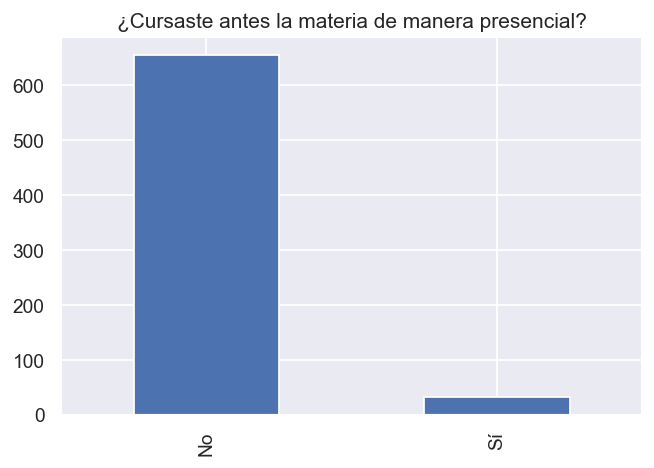

### Respuestas por curso

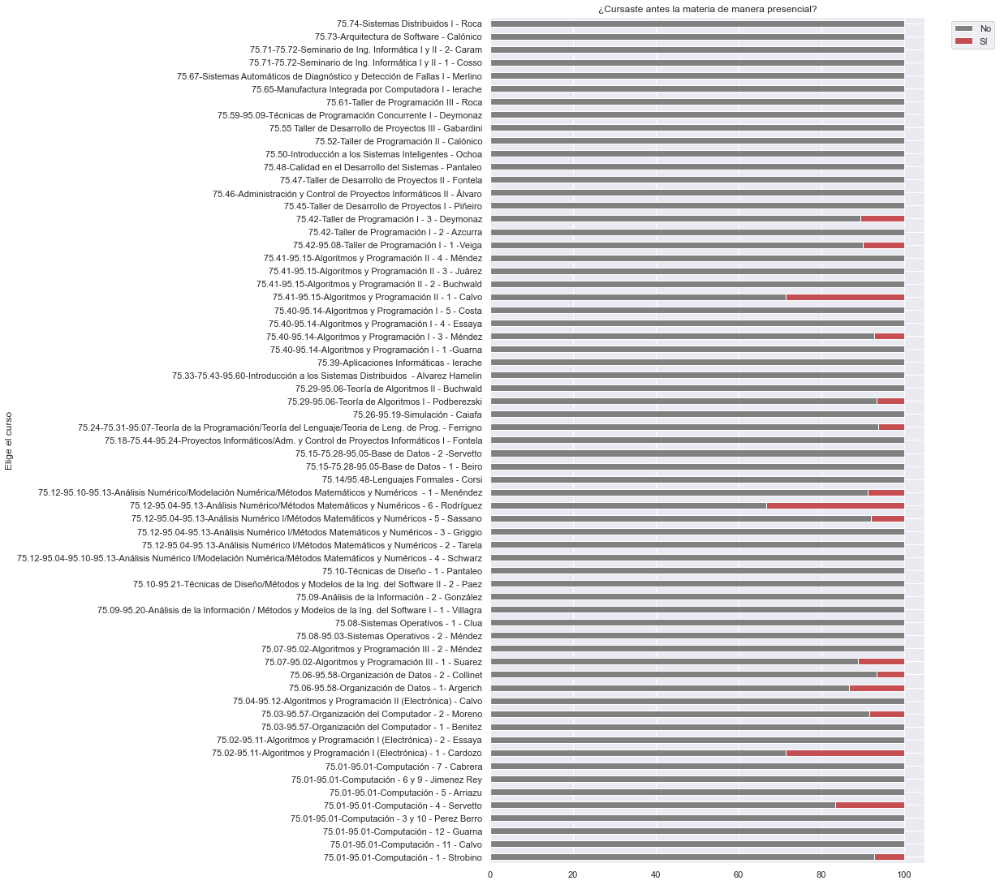

## ¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Clases teóricas]

### Histograma por respuesta

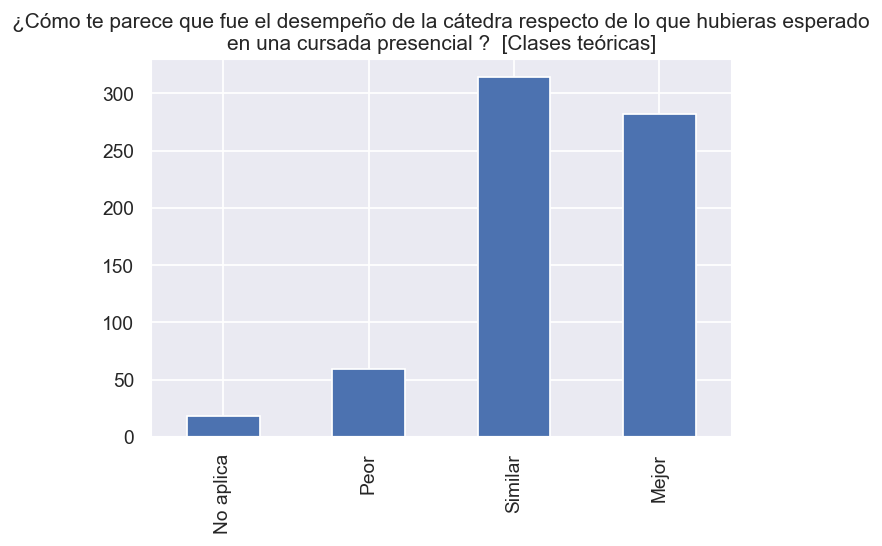

### Respuestas por curso

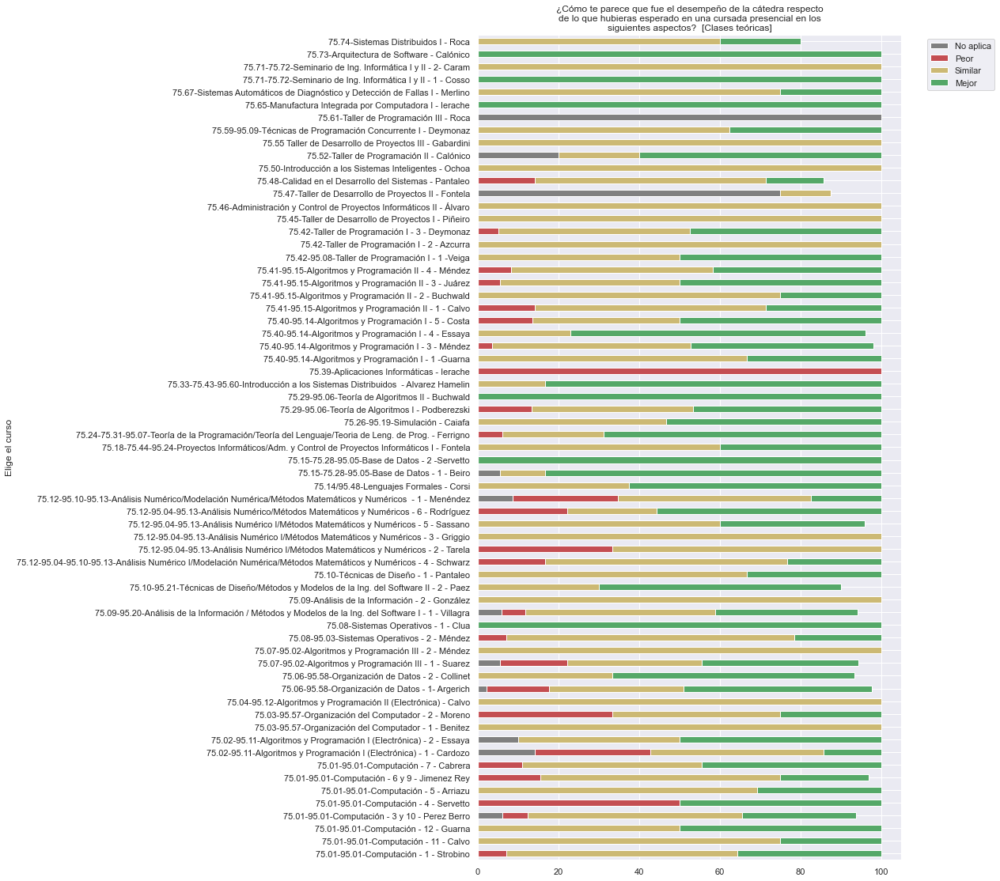

## ¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Clases prácticas]

### Histograma por respuesta

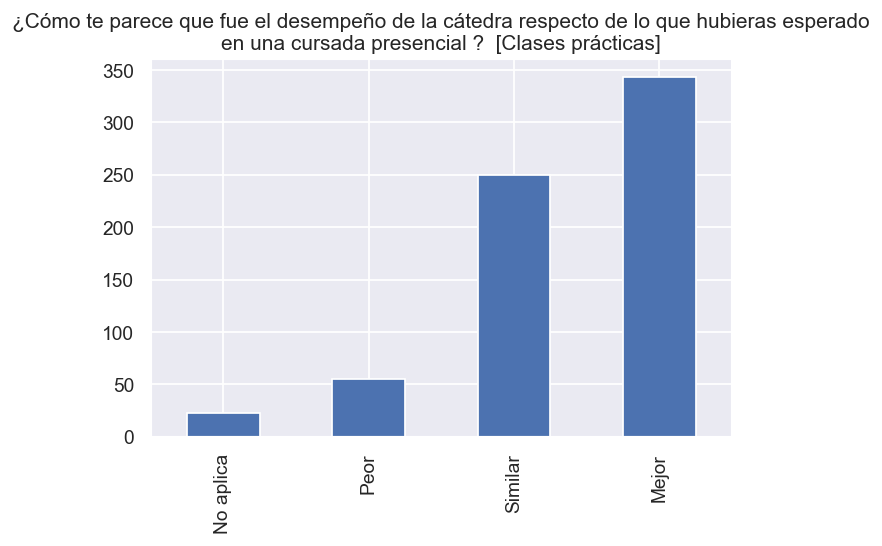

### Respuestas por curso

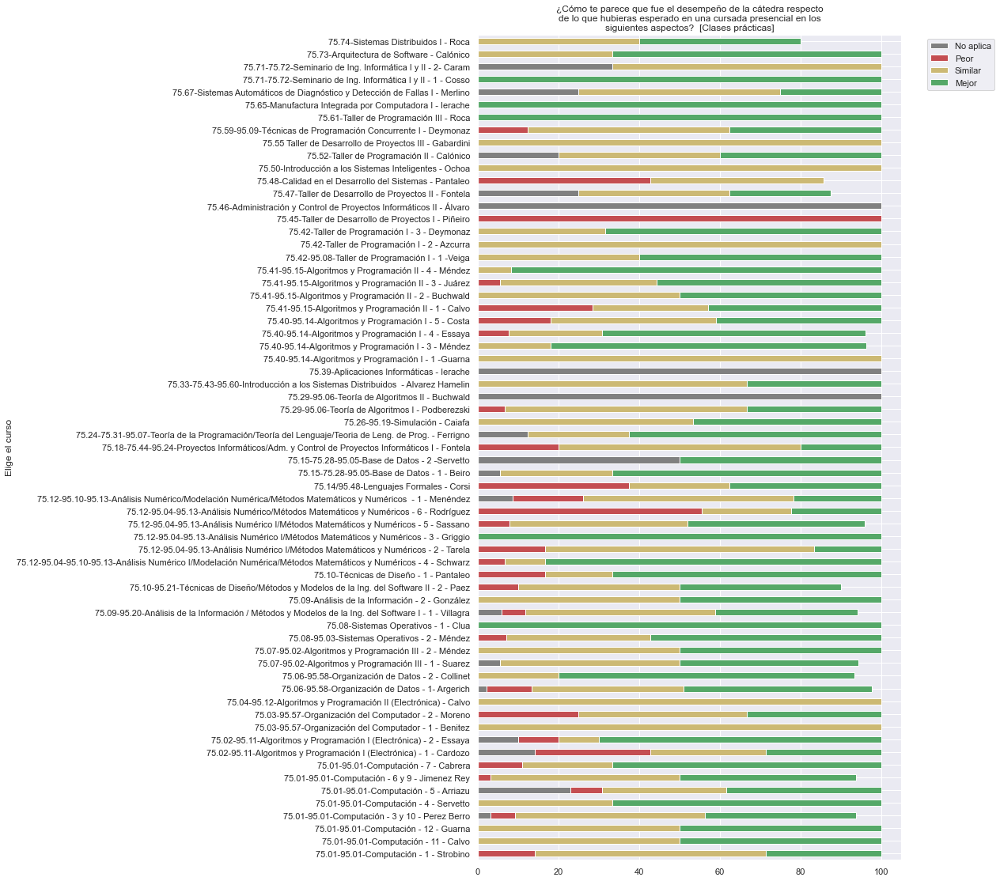

## ¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Trabajos prácticos]

### Histograma por respuesta

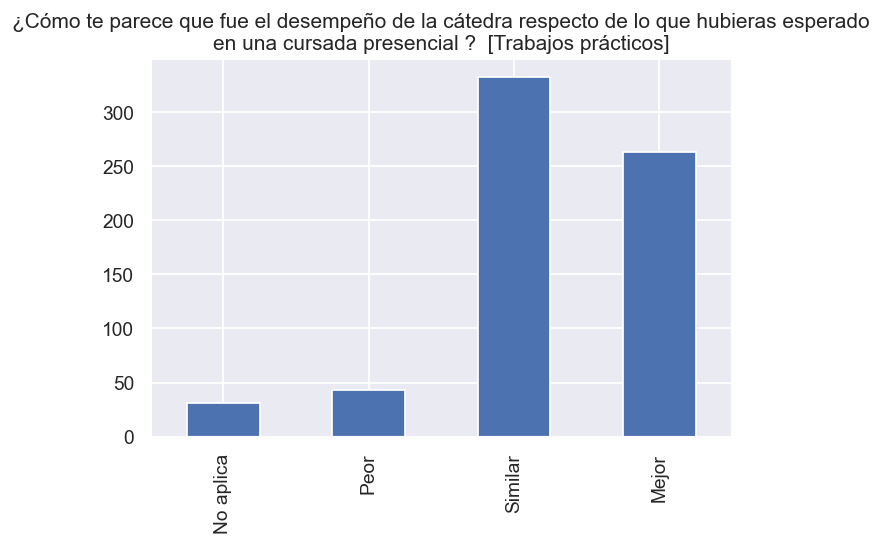

### Respuestas por curso

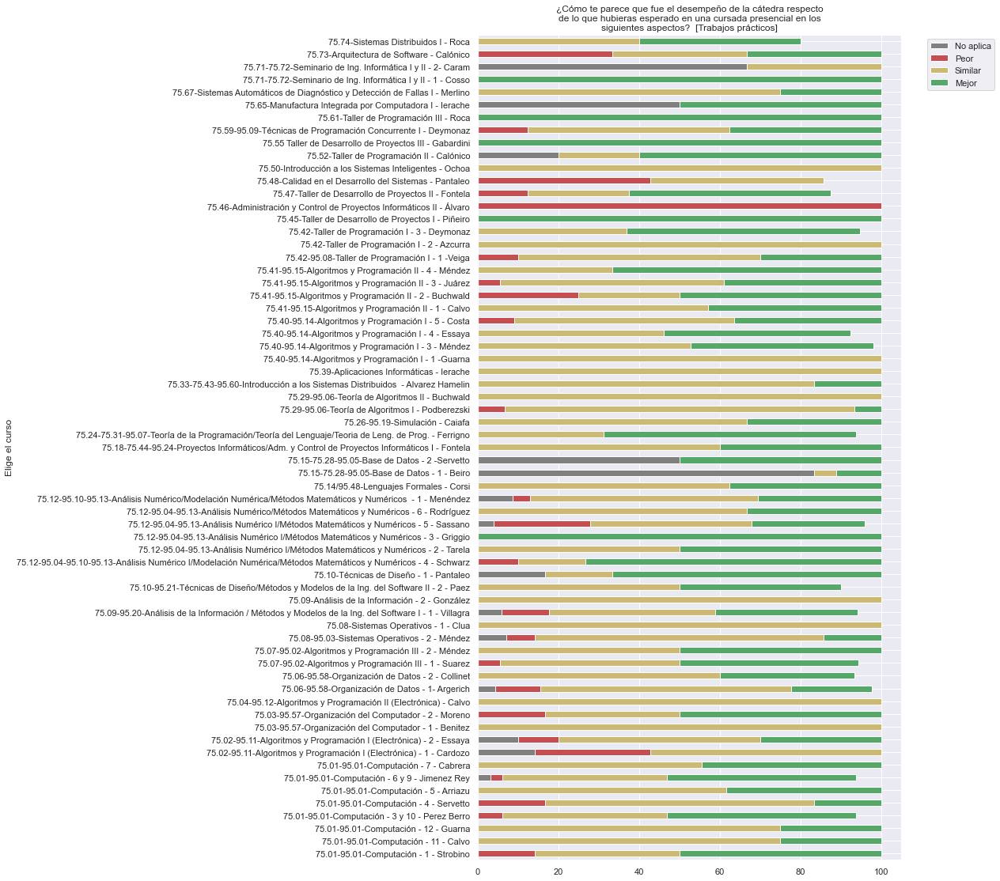

## ¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Instancias de consulta]

### Histograma por respuesta

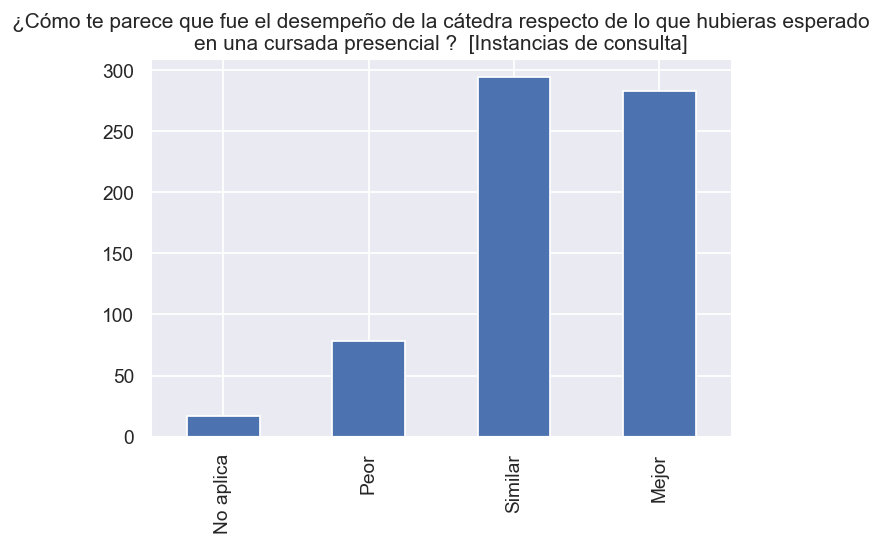

### Respuestas por curso

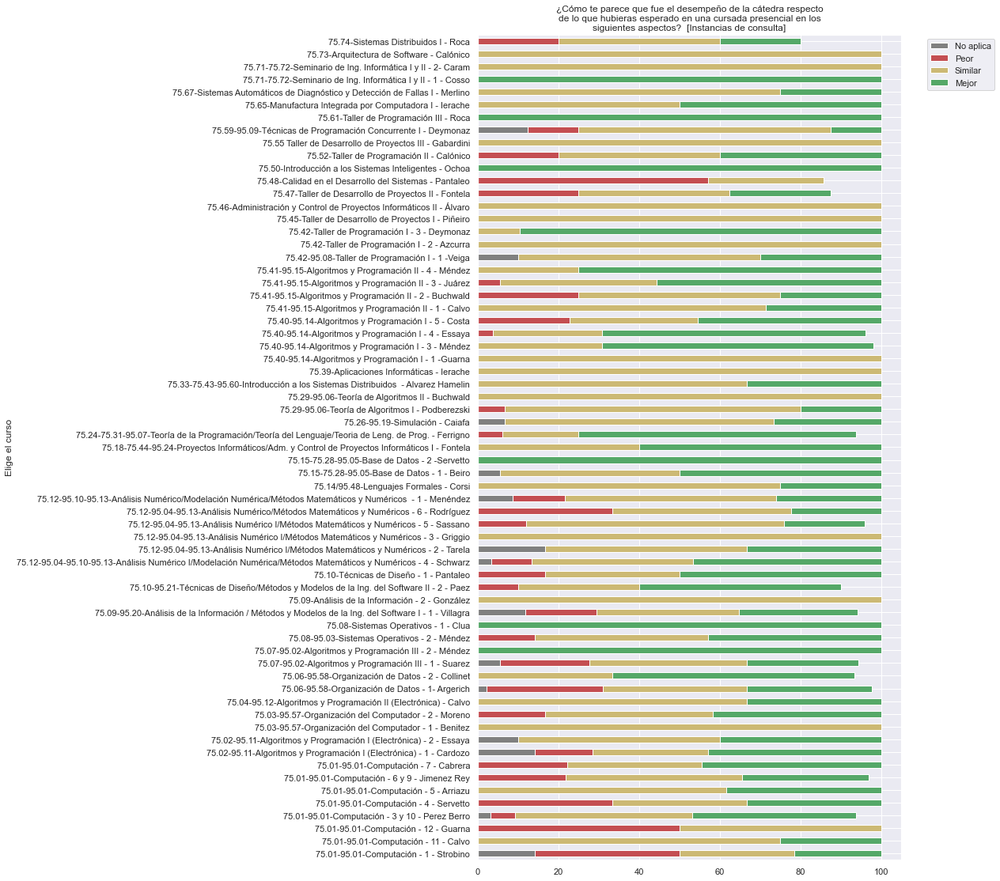

## ¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Tiempos de respuesta ante consultas]

### Histograma por respuesta

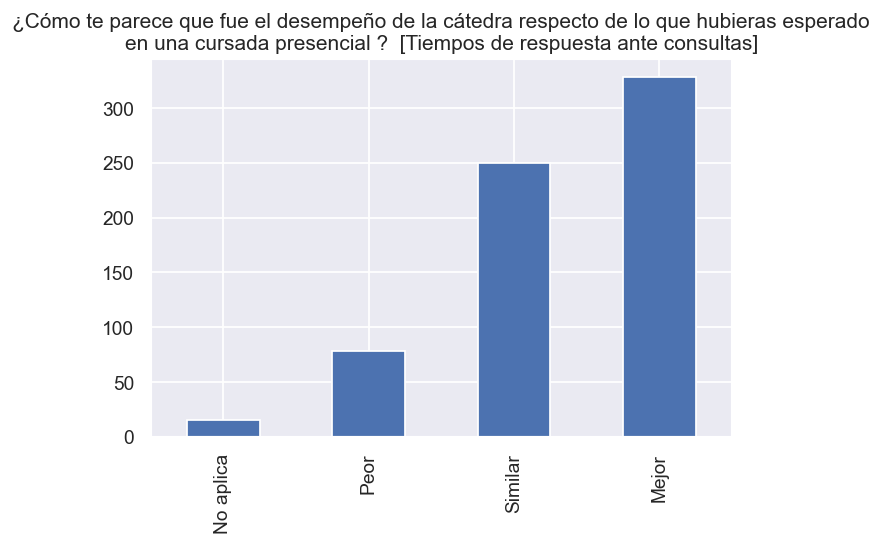

### Respuestas por curso

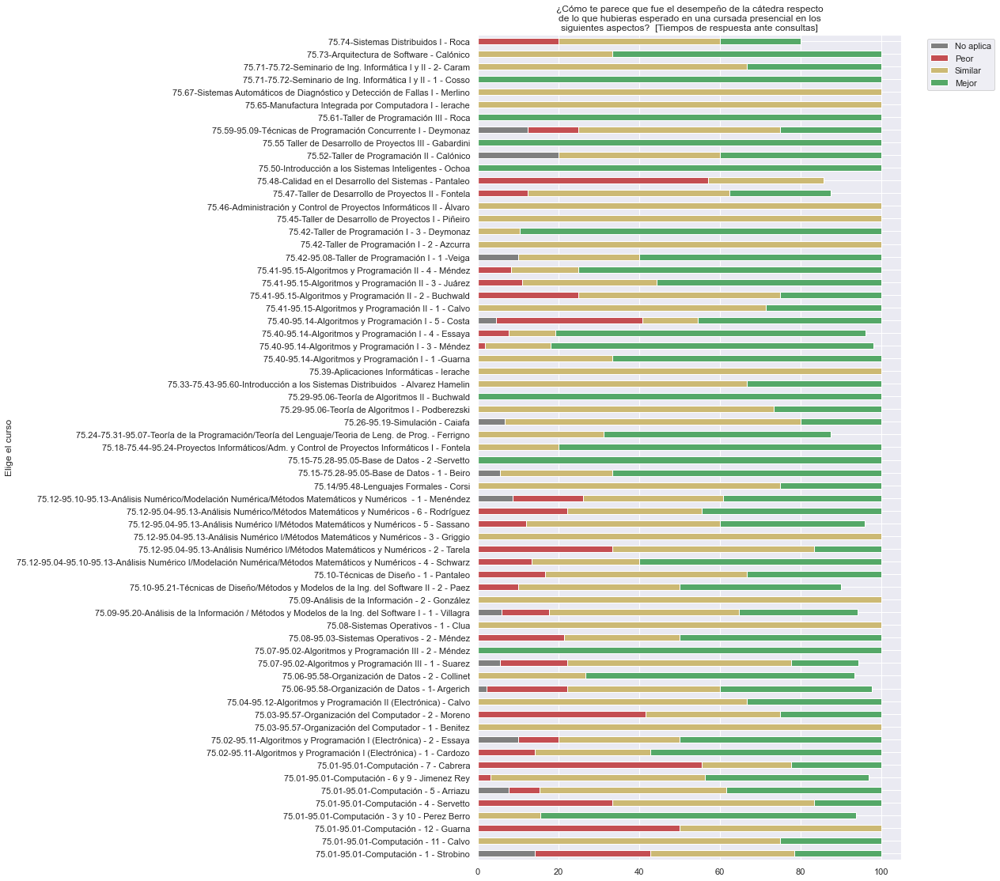

In [26]:
for col in columas_virtual:
    display(Markdown(f"## {col}"))
    display(Markdown(f"### Histograma por respuesta"))
    plt.figure(dpi=125)
    comp[col].replace(reemplazos_virtual, inplace=True)
    comp[col].fillna("NC", inplace=True)
    try:
        comp[col].value_counts()[orden_virtual].plot(kind="bar")
    except KeyError:
        comp[col].value_counts().plot(kind="bar")
    plt.title("\n".join(wrap(col.replace("en los siguientes aspectos",""), 88)), wrap=False)
    plt.show()
    
    display(Markdown(f"### Respuestas por curso"))
    newcol = col.replace("¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?", "").strip(" []")  
    agg_col = comp.rename(columns={col:newcol}).groupby(['Elige el curso', newcol]).size().unstack(fill_value=0)
    try:
        agg_col_pcts = agg_col.div(agg_col.sum(axis=1).values, axis=0).mul(100)[orden_virtual]
        agg_col_pcts.plot.barh(stacked=True, figsize=(6.4*1.5, 4.8*4), color=["gray", "r", "y", "g"], title="\n".join(wrap(col, 60)), ylabel="%", legend=False)
    except KeyError:
        agg_col_pcts = agg_col.div(agg_col.sum(axis=1).values, axis=0).mul(100)[["No", "Sí"]]
        agg_col_pcts.plot.barh(stacked=True, figsize=(6.4*1.5, 4.8*4), color=["gray", "r", "g"], title="\n".join(wrap(col, 60)), ylabel="%", legend=False)

    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

## ¿Qué aspectos valorás positivamente de la cursada remota?

Entendemos que estos aspectos no se corresponden con cada cátedra, si no en general.

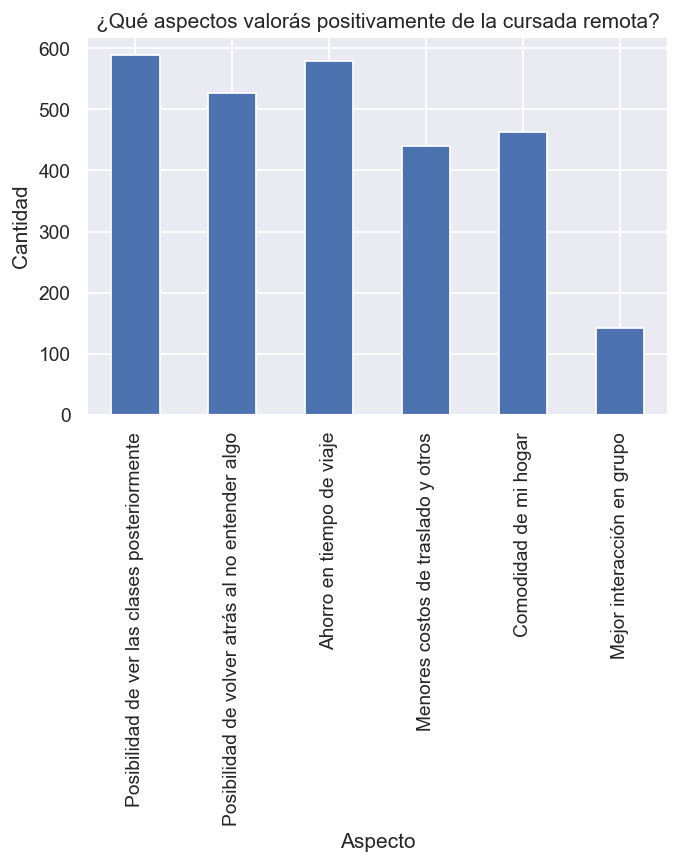

In [27]:
plt.figure(dpi=125)

aspectos = ["Posibilidad de ver las clases posteriormente",
            "Posibilidad de volver atrás al no entender algo",
            "Ahorro en tiempo de viaje",
            "Menores costos de traslado y otros",
            "Comodidad de mi hogar",
            "Mejor interacción en grupo",
            "Ahorro en tiempo de viaje"
]

df_aspectos_pos = pd.DataFrame()

column_text = comp['¿Qué aspectos valorás positivamente de la cursada remota? (elegí todas las que apliquen)'].dropna()

for aspecto in aspectos:
    df_aspectos_pos[aspecto] = column_text.str.contains(aspecto)

df_aspectos_pos.sum().plot(kind="bar")
plt.ylabel('Cantidad')
plt.xlabel('Aspecto')
plt.title('¿Qué aspectos valorás positivamente de la cursada remota?')
plt.show()

## ¿Qué aspectos valorás negativamente de la cursada remota?

Entendemos que estos aspectos no se corresponden con cada cátedra, si no en general.

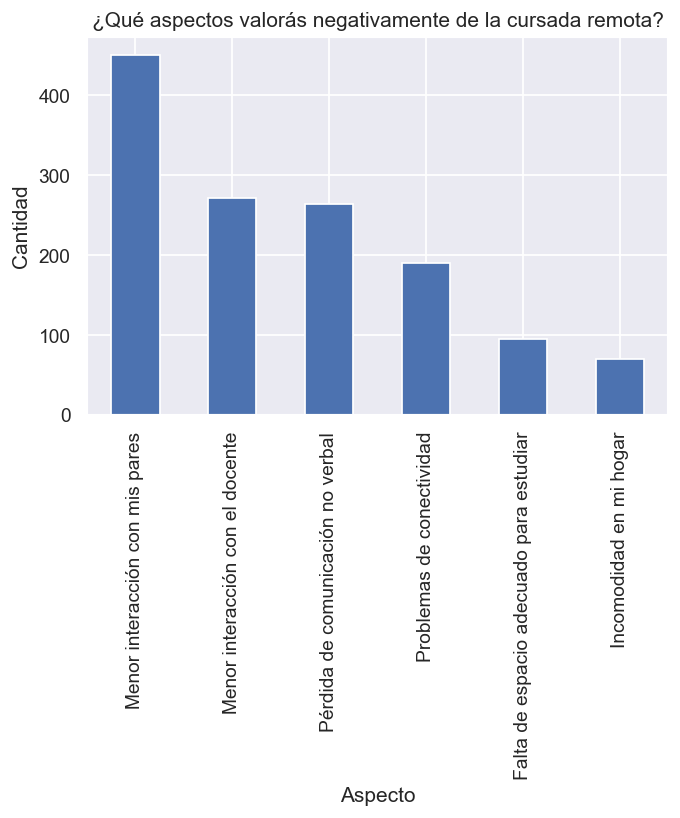

In [28]:
plt.figure(dpi=125)

aspectos = ["Menor interacción con mis pares",
            "Menor interacción con el docente",
            "Pérdida de comunicación no verbal",
            "Problemas de conectividad",
            "Falta de espacio adecuado para estudiar",
            "Incomodidad en mi hogar"
]

df_aspectos_neg = pd.DataFrame()

column_text = comp['¿Qué aspectos valorás negativamente de la cursada remota? (elegí todas las que apliquen)'].dropna()

for aspecto in aspectos:
    df_aspectos_neg[aspecto] = column_text.str.contains(aspecto)

df_aspectos_neg.sum().plot(kind="bar")
plt.ylabel('Cantidad')
plt.xlabel('Aspecto')
plt.title('¿Qué aspectos valorás negativamente de la cursada remota?')
plt.show()

## Correlación entre aspectos positivos y negativos

In [29]:
df_aspectos = df_aspectos_pos.join(df_aspectos_neg, how="outer").fillna(False).astype(int)
cooc = df_aspectos.T.dot(df_aspectos)
mask = np.zeros_like(cooc)
mask[np.triu_indices_from(mask)] = True

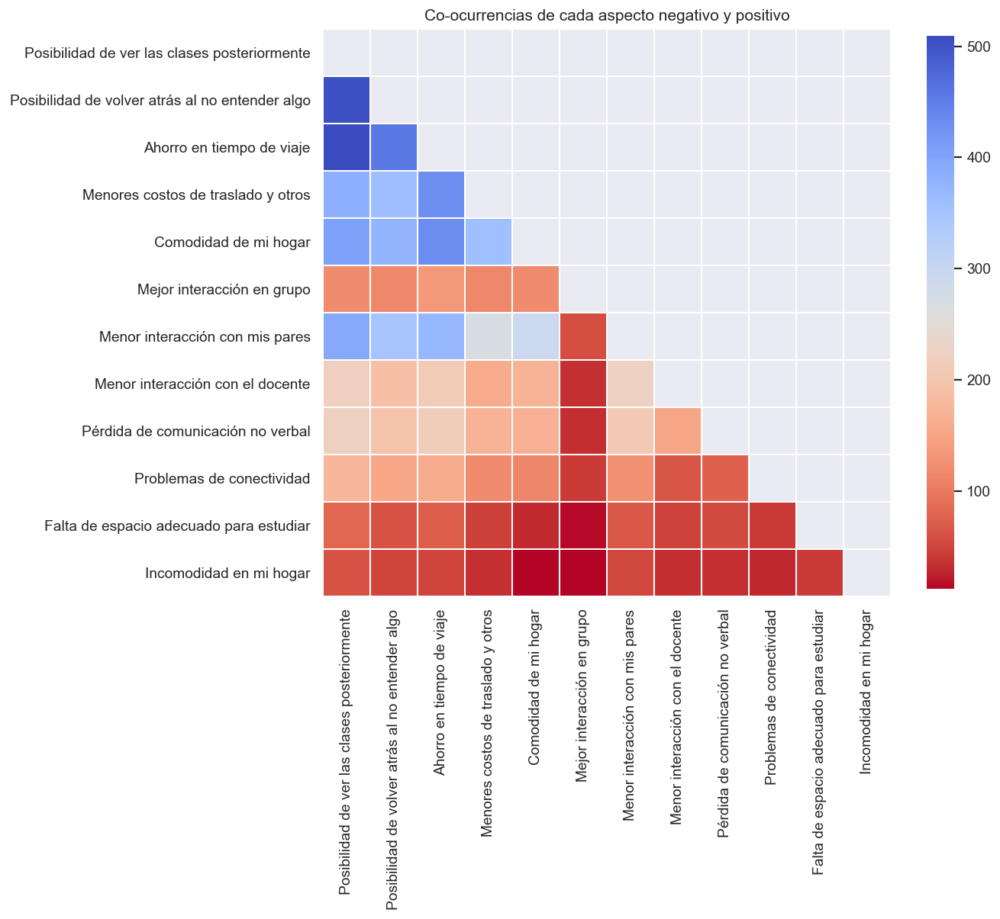

In [30]:
plt.figure(dpi=125, figsize=(6.4*1.5, 4.8*4))

sns.heatmap(data=cooc, cmap='coolwarm_r',linewidths=.2, square=True, cbar_kws={"shrink": .4}, mask=mask)
plt.ylabel("")
plt.title("Co-ocurrencias de cada aspecto negativo y positivo")
plt.show()

# ¿Creés que la cátedra estuvo a la altura de una cursada virtual? En cuanto a herramientas, comunicación, material, etc

In [31]:
def procesar_comentario(c):
    try:
        lineas = c.split("\n")
    except:
        print(c)
        raise
    return "\n".join([f"{l}" for l in lineas])

for curso in comp['Elige el curso'].unique():
    display(Markdown(f"## Curso {curso}"))
    com = comp[comp['Elige el curso'] == curso]['¿Creés que la cátedra estuvo a la altura de una cursada virtual? En cuanto a herramientas, comunicación, material, etc'].dropna()
    if com.empty:
        display(Markdown("_No hay comentarios_"))
    else:
        todos_los_comentarios = com.values.tolist()
        for comentario in todos_los_comentarios:
            try:
                if comentario == "":
                    continue
                display(Markdown(f"- {procesar_comentario(comentario)}\n\n"))
            except:
                print(todos_los_comentarios, curso)
                raise

## Curso 75.40-95.14-Algoritmos y Programación I - 4 - Essaya

- de todas las materias que curse esta fue la que mejor se adapto a la virtualidad



- Si, la verdad yo creo que si, estaria bueno en un futuro (cuando todo sea presencial de vuelta) que haya un modelo semi-presencial para esta materia, fue la que mas disfrute virtualmente pero me hubiera gustado tener algo de clases presenciales aunque sea para conocer a los profes/ayudantes. Pienso que los examenes virtuales son mucho mejor que los hechos presencialmente en una hoja sin poder probar nada del codigo



- Si



- si



- Si. Nos podíamos comunicar con cualquiera(docente/ayudantes) y nos contestaban muy rápido. Creo que se adaptaron perfectamente a la virtualidad.



- Sobrepasó mis expectativas, realmente excelente. Ante cualquier inquietud los profesores contestaron casi al instante. Por otro lado RPL me pareció la mejor herramienta que puede existir para motivarnos a realizar los ejercicios de forma divertida. Esta cursada fue un lujo. 



- Completamente, me gustó mucho como fue dada la materia.



- Si, el manejo del curso Essaya me pareció super profesional. Todos muy buena onda y super predispuestos. El RPL es una muy buena herramienta.



- Si, se organizaron muy bien, tuvmos un monton de material de estudio y podiamos consultar dudas en cualquier momento



- Si 



- Si, y mucho mejor  creería



- Si definitivamente 



- Si, realmente pusieron a disposición un montón de herramientas, y los comunicados por discord eran muy eficientes y estaban bien organizados.



- sí exelentes herramientas, tanto el discord como la página, muy utiles y bien hechos.



- Si, se adaptaron super bien a la virtualidad. Las clases fueron muy buenas y la comunicación fue fluida en todo momento.



- Sí, que haya un discord vino muy bien



- Si



- Si, estuvo a la altura



- Sí. Supieron aprovechar la virtualidad y se adaptaron, utilizando los nuevos recursos de los que disponen. Excelentes clases y excelente metodología. 



- Si



- Si



## Curso 75.02-95.11-Algoritmos y Programación I (Electrónica) - 2 - Essaya

- Si. En general los problemas que tuve fueron personales, por usar una maquina virtual con poco ram para programar en una computadora. Pero la comunicacion y rapidez fueron excelentes, y la posibilidad de re-ver partes de clase, ver clases a las que no pude asistir, o incluso ver grabaciones de años anteriores ayudaron. 



- Si, de todas las materias que cursé virtuales considero que esta fue la que mejor organizada estaba



- Totalmente



- Si la verdad que si. Es de las pocas materias que se pueden adaptar a la virtualidad de igual o mejor forma que de manera presencial, cosa que en las otras materias no sucede.



- Si. Se notó el compromiso docente. Utilizaron todas las herramientas a su alcance



- Si, muy predispuestos  y con intenciones de que aprendamos la materia



- si, lo estuvo



- la catedra que mejor se adapto a la virtualidad



- Si



## Curso 75.08-95.03-Sistemas Operativos - 2 - Méndez

- Totalmente



- Si, las herramientas que utiliza Mariano siempre son muy bien adaptadas. La plataforma que utilizó para el final está impecable, y el apunte virtual ayuda mucho tanto para el TP como para la teoría. En cuanto a clases con Google Meet está a la altura.



- Si



- Si, hubo mucho esfuerzo de los docentes de la práctica y estuvieron muy atentos. Mariano bien también como siempre.



- Si, la cursada estuvo a la altura.  
Se tiene Discord y Google Groups para realizar consultas.



- Si



- Totalmente, estab muy bien adaptados



- Si



- Sí. Los docentes de la práctica siempre se mostraron muy predispuestos a ayudar a los alumnos por todos los medios (lista de mails, discord y clases de consulta). También dieron clases extra de temas como git y docker que fueron interesantes. Lo que se podría mejorar es el material de las clases teóricas, que está un poco desorganizado y tiene algunos errores.



- Si



- Sin duda sí. La materia se presta para ser virtual. Todos estuvimos más cómodos y nos adaptamos, seguro aprendimos tanto o más que presencialmente.



- Si, se organizaron bien en el sentido virtual



- Si



## Curso 75.09-95.20-Análisis de la Información / Métodos y Modelos de la Ing. del Software I - 1 - Villagra

- Si



- Si, no hay nada para criticar en ese sentido



- Si, pero demasiado intensa en tps



- Si, la catedra se manejo bien en ese aspecto



- Si, es una materia que se adaptó muy bien a la cursada virtual.



- Si



- Muy a la altura



- Muy buena. Está todo virtual, no necesitas absolutamente nada más de lo que te dan en la clase 



- Si, incluso mejor que si hubiera sido presencial



- Si



- Si, completamente. Muy bien armado el esquema trabajos individuales, pdfs, clases grabadas. La verdad muy contento en como se dió.



- Si



- Si



- si



## Curso 75.33-75.43-95.60-Introducción a los Sistemas Distribuidos  - Alvarez Hamelin

- Totalmente de acuerdo, muy buenas las herramientas empleadas.



- Sí



- Si



- Si



- Totalmente, todos los docentes estuvieron 100% predispuestos, las clases grabadas estaban a disposición de todos para consultarlas en cualquier momento al igual que las diapositivas, la comunicación a través de Slack era muy muy buena. La única crítica que tengo es que hubo alguna falta de coordinación entre la teórica y la práctica



- si



## Curso 75.01-95.01-Computación - 3 y 10 - Perez Berro

- Si, definitivamente. Quedé muy satisfecha, en todo momento enviaba consultas por mail y eran respondidas en corto tiempo y con mucho detalle. Un placer!



- Yo creo que estuvo a la altura. En cuanto a material teorico si bien eran solo pdfs, estos eran muy claros y estaban acompañados de ejemplos demostrativos muy buenos que ayudaban a entender. La comunicacion es buena, no solo hay consultas por mail que la profe responde rapidamente sino tambien consultas por meet casi todas las semanas. 



- Si



- Si



- Si, buena organización 



- Si, todo muy bueno!



- Si, a mi parecer la cátedra que más se adecuo a la virtualidad, con los pdfs con teoría para leer, ejercicios de práctica y tps para trabajar en la semana y clase de consulta por grupos para hacerla más interactivas



- Si



- La verdad que si, respondiendo rápido y claro las consultas, clases por meet cortas pero útiles, ejercicios y sus resoluciones para poder revisar errores



- Estuvo excelente miles de videos explicativos y clases de consulta



- si



- Sí, sinceramente fue la cursada virtual que más me gustó, porque tenía todo, cada duda que teníamos, las docentes contestaban nuestros mails casi al instante, además, teníamos ambos formatos, tanto en videos como en pdf para lecturas y si no entendías uno ibas al otro y sino, le preguntaba por mail a las profes, casi con respuesta inmediata (obviamente dependiendo del horario)



- Si, los videos de explicacion y pdf son muy buenos y claros



- Si



- Sí, el material práctico iba de la mano con lo que se pedía en los ejercicios, y ningún ejercicio de las evaluaciones resultó ajeno a lo que veníamos estudiando. Los conceptos básicos quedaron claros y el material era el justo y necesario.



- Si



- Si



- si



- si



- Si, en mi opinión estuvo excelente. Todo el material estuvo disponible a lo largo de la cursada.



- si, nos brindaron muy buen material



- Si. Hubo bastante material y el docente estuvo a disposición ante cualquier duda.



- Si, excelente catedra 



- Sí



- Muy a la altura, se desempeñaron muy bien



- Si



- Casi Perfectamente



- Si, todo el material estuvo en formato pdf y fue más que suficiente. Las profesoras hacían videollamada para consultas y/o explicación casi todas las semanas y nos daban la oportunidad de pedir encontrarnos por videollamada cuando lo necesitáramos. También contestaban dudas por mail muy velozmente y con claridad.



- Si muy actualizada y siempre a disposición 



## Curso 75.12-95.04-95.10-95.13-Análisis Numérico I/Modelación Numérica/Métodos Matemáticos y Numéricos - 4 - Schwarz

- Sí, completamente



- Sí, las clases están muy bien organizadas y el material que proporcionan los profesores es muy bueno y completo. 



- Si, estuvo a la altura.



- si



- Si. Los profesores responden rapido las consultas, crearon un bot para mejor organizacion y las clases practicas fueron mas dinamicas, ya que se podia "programar"en el momento.



- si, funcionó bien



- Definitivamente es una materia que mejora siendo virtual, no hay posibilidad de que se dicte de manera tan abarcativa y didáctica de manera presencial. Excelente cátedra.



- creo que estuvieron a la altura y siempre se nos brindaron todas las herramientas para poder entender bien los temas y desarrollar la cursada exitosamente



- Si, totalmente



- Si



- Si



- si, totalmente. Me pareció muy completo todo el material que aportaba la catedra.



- Excelente, muy interesante el enfoque en programacion



- Si muy a la altura.



- si



- Muy a la altura, excelente todo el material brindado



- La adaptación a la cursada virtual fue excelente



- Si



- Siento que se pudo adaptar a las circustancias y se pudo llevar la cursada de manera eficiente



- Me parece que si, aprovecharon la oportunidad para insistirnos en empezar a usar python (lo cual no se que tan factible es en una cursada presencial) y aprovecharon para mostrar ejemplos compartiendo pantalla, o haciendo que nosotros resolvamos y presentemos compartiendo pantalla. Me parece que aprovecharon al máximo las ventajas de la virtualidad, a pesar que se pierden cosas importantes como el trato docente - alumno/a y el momento de consultar en forma presencial.



- Si



- si, fueron llevando muy bien la materia tanto la parte teórica como la parte práctica



- Si



- Sí, me parece que las clases prácticas estuvieron muy bien manejadas e hicieron más sencillo seguir la cursada al día. Me pareció positiva la modalidad de ejercicios para presentar en clase.



- En mi opinión fue una de las materias con mejor organización desde que comence a cursar. No tengo mi experiencia en esta cátedra en la presencialidad, pero en cuanto a la virtualidad es recomendable. Contiene mucho material y bien explicado. Además se busca una interacción con el alumno que ayuda a llevar la materia al día. 
El único inconveniente es, quizas, los problemas de conexión en ciertas ocasiones.



- Si.



- Sí, de hecho el poder usar la computadora para programar algunos metodos que son tediosos hacer a mano personalmente me ayudo al entendimiento de los temas.



- Si, clases bien organizadas con todos los materiales a disposicion y profesores atentos al grupo de telegram para cualquier consulta que no se pudiera realizar durante la sesion de meet



- Si, la comunicación fue muy buena, contestan bastante rápido y de forma concreta. El material de estudio en el campus sirvió un montón. En las clases prácticas de este cuatri hubo más interacción entre alumno-docente que en otras materias. Estuvo buena la mecánica de presentar ejercicios, de corregirlos entre alumnos.



## Curso 75.18-75.44-95.24-Proyectos Informáticos/Adm. y Control de Proyectos Informáticos I - Fontela

- Si



- Si 



- Si, lo estuvo



- si



- Si, se adapto muy bien



## Curso 75.12-95.10-95.13-Análisis Numérico/Modelación Numérica/Métodos Matemáticos y Numéricos  - 1 - Menéndez

- Si, se utilizaron las herramientas que había disponibles de la mejor manera, intentando fomentar interacción alumno-docente



- Siento que no, que le falta muchisimo. La teoria me parecio un desastre de forma virtual, no lo conozco al docente de teorica en presencial, quisiera creer que es mejor, pero los temas no me parecen del todo interesantes, parece mas una traba en la carrera. Solo muy pocos temas senti que valieran la pena pero desde el lado de la practica, en la parte teorica me parece una volada de cabeza, mas para estudiante de ingenieria civil que uno se quiere abstener a tanta abstraccion en cierto punto, para eso cursamos AM2, algebra 2, probabilidad y estadistica. Uno quiere ir mas al centro de su carrera; ojo repito, no me parecieron todos los temas malos pero mas por el lado de la practica en la vida profesional. Como uno puede notar el docente es un doctor de facultad de exactas y los docentes practicos todos ingenieros, ahi se puede apreciar porque me senti mas atraido por lo practico, me parecio muy abstracto para la altura de la carrera en la que me encuentro. Igual cabe aclarar las teoricas de por si muy malas, el docente habla super bajo, tuve que subir el volumen de la pc al maximo y con auriculares para entenderle, no se le puede seguir el hilo de lo que explica, parece un caset que le das play y por 20 min habla sin parar, hubo videos que hasta 3 veces lo vi, y por cada unidad aproximadamente 8 videos.



- Sí, no hubo inconvenientes.



- Si, un lujo



- Sí



- Si



- si



- si



- Desde mi punto de vista, faltan algunos ejercicios resueltos de la segunda parte de la materia.



- si, re



- si



- Lo único malo fue que clases teóricas tenían algunos problemas de audio 



- si, esta buena la modalidad de las clases grabadas + las clases de consulta.



- Si



- Creo que los videos grabados de la teórica si bien fueron completos se me hicieron muy tediosos. Los videos grabados de la practica me fueron mucho mas útiles, pero en algunos casos me costó hallar la relación entre lo que se daba en la teórica con los contenidos practicas. 



- Si, desde ya las clases grabadas son completas y ademas el docente de la teorica da una revisión de los contenidos, lo cual ayuda bastante



- Si



- Sí



- si



- Estuvo bastante a la altura. 



## Curso 75.39-Aplicaciones Informáticas - Ierache

_No hay comentarios_

## Curso 75.06-95.58-Organización de Datos - 2 - Collinet

- si



- Totalmente



- Si



- Totalmente



- Si



- La cátedra se adecuo muy bien a la virtualidad teníamos clases de 3 horas con su respectiva pausa en el medio para descansar. La clases teóricas eran muy entretenidas, los power points eran claros. Con la practica me costo un poco mas seguir porque al venir de la parte teórica uno ya tenia un poco la cabeza quemada pero me sirvió mucho el que subieran las clases a youtube asi si en algun momento no entendia algo podia verlo de nuevo como el tener acceso a los notebooks. Algo bueno, es que siempre tenian el material subido, en otras materias pasa que tardan mucho en subir el material de la clase y uno no puede estudiar. 



- La cátedra esta sumamente a la altura. Todo el material (presentaciones) mostrado en las clases teóricas esta disponible al instante en un drive si uno lo necesita. En cuanto a los notebooks de la práctica se da el mismo caso, solo que los notebooks se encuentran en github



- Absolutamente. Se adaptaron sin problemas.



- Totalmente a la altura. Es una cursada ideal para la virtualidad.



- Sí.
* El manejo con Slack estuvo muy bien
* Las clases teóricas y prácticas eran subidas rápidamente al canal de YouTube
* Muy buena atención de los correctores con dudas del tp



- Si, super atentos y siempre buscando mejorar.



- Si, drive + slack, siempre a disposición. Además los kahoots al final de las clases estuvieron muy buenos, sirvieron como una forma de resumen de la clase del día.



- En general la materia estuvo a la altura. Siempre estuvieron dispuesto a ayuda y contestar consultas 



- La cátedra estuvo a la altura de la cursada virtual. 
Material de estudio disponible. 
Aprovecharon para realizar clases con charlas especiales con invitados que quizás hubiera sido complicado de incluir de otra forma.



- Se adaptaron muy bien a la virtualidad. Es muy útil tener las clases para volver a ver cuando se necesiten, los notebook de las clases prácticas y los canales de comunicación por slack con los docentes.



## Curso 75.29-95.06-Teoría de Algoritmos II - Buchwald

- Si, totalmente



## Curso 75.06-95.58-Organización de Datos - 1- Argerich

- Estuvo excelente



- Si, se manejaron muy bien en ese aspecto. Todas las clases se graban, y tenes además listas de reproducción en YouTube de cada tema.



- Totalmente, hay una predisposición total por parte del cuerpo docente



- No, la catedra es un desastre, se nota que los profesores no les interesa que aprendas



- Sí, estuvo a la altura.



- Si



- Sí.



- Sí, muy a la altura de una cursada virtual



- Si. Mucha predisposicion de los docentes



- Si



- No



- Si



- Buena comunicación por slacks/piazza. Buen material de estudio. Las clases sincrónicas estaban bien, pero bastante similares a los videos



- No



- Si



- Si.



- Si



- Si, sentí que la cursada se adaptó muy bien a la modalidad virtual, brindando todo tipo de herramientas para facilitar la cursada, los exámenes y los TPs



- Las herramientas bien, pero los docentes no les dieron un buen uso.



- Si, no solo en el material y las herramientas que utilizamos, sino también la predisposición de los docentes para tratar los temas referidos a la virtualidad.



- Sí.



- Si, valoro el trabajo de las clases (Ya sean grabadas o los meets) y como se preocuparon en encontrar los medios que faciliten la comunicación. Las clases de repaso fueron de mucha ayuda, Gracias.



- Si!



- No, la verdad que deberían mejorar la manera de enseñar los temas porque no estuvieron bien explicados. También, la forma de los enunciados en los parciales: son muy poco claros.



- si, 10 puntos



- En cuanto a la comunicación estaria bueno que centren todo en un solo lugar ya que tenemos piazza facebook slack, algunos profes te responden más rápido por un medio u otro según el tema



- Si, pero podrían mejorar las clases teóricas, y que las prácticas no sean releer las diapositivas de la teórica, si no que realmente se "practiquen" los temas vistos.



- si



- Si



- Si



- Si. En los parciales me parece que tendrían que habilitar un meet para consultas puntuales que aunque no sean de consigna, deberían poder ser respondidas ya que apuntaban a qué tanto desarrollar el ejercicio. En relación a eso, me parece que el unico punto flojo fue los enunciados en los parciales, dejaban muchos grises en cuanto a lo que pedian o lo que teniamos que asumir. Tendrían que haber sido mas explicitos ( por ejemplo, explicitar cuantas iteraciones se debían desarrollar de un algoritmo)



- Estuvo a la altura.



- si, al ser una materia con programación y muestra de diapositivas resulta útil hacerla de forma virtual



- Si, en general había bastante material para resolver todo y muy claro



- Si, particularmente los temas que son de programación beneficia mucho el tema virtual, ya que no es una dificultad "compartir pantalla" y mostrar el contenido, y por mí parte puedo seguirlo a la par desde mí computadora, cuando capaz hay dificultades siendo presencial, como cargadores o incluso el transportar la notebook siendo clases de noche.



- Si, totalmente a la altura. Material siempre disponible e incluso de cursadas anteriores con teoría, ejercicios y modelos de examen.



- Se adaptaron muy bien a la virtualidad. 



- Si



- Si creo que estuvo a la altura 



## Curso 75.15-75.28-95.05-Base de Datos - 1 - Beiro

- Si



- Uso muy bien la circunstancia virtual



- Perfecto



- Si. Muy a la altura



- Absolutamente



- Si completamente



- Si, la cátedra estuvo muy preparada para dictar la cursada virtual



- Sí, creo que se adaptaron muy bien



- Considero que al tratarse de una materia que incluye prácticas con computadoras hicieron buena utilización de esto para talleres/ejercicios prácticos.



- Si



- Si



- Sí



- Sí, mucho. Fue de las materias que mejor manejaron la virtualidad.
Principalmente debido a que tanto las clases teóricas y prácticas están muy bien dadas y las mismas son subidas al canal de youtube de la materia al terminar.
Adicionalmente el campus está muy bien organizado, es muy fácil repasar los temas debido a esto.
Los ejercicios de taller son muy acertados y se encuentran bien explicados, tanto en los enunciados como en las clases.
Los ejercicios de parcialito me parecieron muy buenos y acertados en su dificultad, incentivan a avanzar en los temas.
Me agradó la forma de evaluación del parcial, ya que confiaron en la bondad de los estudiantes y no nos pusieron mil palos en la rueda para rendir, como en otras materias... Adicionalmente, la dificultad es idéntica a los ejercicios que se pueden encontrar en parciales previos y durante el mismo se pueden consultar apuntes personales, por lo tanto es sencillo prepararse. Creo que es una estrategia acertada y espero que se mantenga.

Particularmente me ayudó muchísimo tener las clases grabadas ya que me tuve que ausentar en muchas clases, pero sin embargo conseguí finalizar la materia.



- Si, la cátedra estuvo muy bien preparada



- Si



- Hasta el momento la mejor cursada virtual que tuve, se nota que tienen muy bien organizada la materia, no tengo ningún comentario negativo.



- Si, han utilizado un monton de recursos utiles (meet, jamboards, google docs, ...)



- Si, la cátedra cumplió de muy buena manera con todos los puntos. No hubo ninguna dificultad por ser una cursada virtual.



## Curso 75.42-Taller de Programación I - 3 - Deymonaz

- Si.



- si



- Completamente. Los recursos se adaptaron perfectamente a la virtualidad.



- Estuvo super a la altura, fue una cursada excelente



- Si



- Sí



- Totalmente a la altura. Nos brindaron todas las herramientas necesarias para trabajar.



- Totalmente a la altura, se establecieron medios de comunicación los cuales fueron altamente efectivos.



- Si, comunicación constante, gran material, guías de trabajo, código de las clases más las clases grabadas. Excelente



- Muy buen curso. Muy conforme. Las herramientas muy buenas y actuales. La comunicación de los docentes siempre fue muy buena y nunca dejaba dudas respecto de la cursada. El material muy bueno. Varios temas superaron los requerimientos de la cursada.



- La materia se manejo muy bien en la modalidad virtual a pesar de ser su primer cuatrimestre. 



- Sobresalientemente



- Totalmente, el grupo docente se adaptó perfectamente y usó las herramientas que tenían de la mejor forma.



- Estuvo muy a la altura. Totalmente recomendable. 



- Si, estuvo a la altura.



- Si, cualquier duda tenida fue respondida rapidamente



- Totalmente.



- Si, estuvo a la altura.



## Curso 75.12-95.04-95.13-Análisis Numérico I/Métodos Matemáticos y Numéricos - 5 - Sassano

- Si, los docentes cumplieron con todo lo esperado



- Sí, totalmente



- Si, la cursada se adapto muy bien a la virtualidad.



- Perfecto



- Creo que se adaptaron muy bien a la virtualidad. No estar atado a un horario fijo pudiendo ver las clases grabadas facilita mucho la cursada. No hubo problemas en cuanto a la comunicación con los docentes ni con el acceso al material.



- Si, se adaptó muy bien a la modalidad virtual



- Si pero agregaría mas material, mas ejercicios prácticos resueltos y saber llevar mejor la teoría a la practica. Hacernos entender para que nos va a servir la materia el día de mañana



- Si. Creo que estuvieron a la altura



- SI



- Si



- Las clases teóricas fueron muy completas. Capaz me perdí un poco en las demostraciones. Las clases prácticas me sirvieron más las asincrónicas que las sincrónicas. Para el segundo TP, siento que nos dejaron bastante solos con el tema de programación. Me parece que con lo que se aprende en la materia correlativa Computación no basta para resolver el 2do TP.



- La cátedra hizo todo lo posible para que no notemos la diferencia con la cursada presencial y estuvo a la altura perfectamente



- Sí, creo que los videos, las clases grabadas y accesibles en todo momento, y el uso del campus ayudaron mucho.



- Si



- Si . Todo el material necesario esta en el campus . Los ppt están buenos, hasta tienen sonido, y lo que no se entienda se puede reforzar con la clase grabada y los ejercicios grabados.



- por lejos



- Si



- Si



- Definitivamente. En mi caso particular estoy intentando retomar mis estudios despues de muchos años y sinceramente esta siendo de mucha ayuda la preocupación por los docentes en dar respuestas rápidas y de forma MUY amena, pocas veces experimente ese grado de preocupación real por el un alumno antes en esta facultad y realmente resulto muy estimulante. Tambien me sorprendio gratamente la cantidad de material disponible excelentemente indexado, sinceramente nadie puede decir que uno no contaba con lo necesario para aprobar los parciales si se tomo el minimo tiempo para ver los videos y practicar un poco.



- Si



- La docente de la cátedra se puso paranoica tratando de contener lo que ella pensaba que iba a ser una copiada masiva. Se nos obligó a rendir de formas completamente incómodas teniendo que hacer uso de 2 dispositivos, que no todos tienen en la casa, uno para grabarse y otro para mirar el enunciado. La cámara tenía que estar posicionada de una forma completamente ridícula y las indicaciones de cómo entregar el examen eran larguísimas y complejas.

En cuanto a los trabajos prácticos, otra vez estuvieron paranoiqueando con que nos íbamos a copiar entre nosotros, y a muchos los llamaron a un meet para "que justifiquen" por qué tenían cosas iguales entre dos equipos. Yo les digo por qué: porque todos nos tuvimos que poner a googlear qué hacer con los TPs imposibles que nos daban. Esta es una materia donde no hay sólo informáticos, y muchos industriales y químicos nunca vieron Python. Al mismo tiempo, el material de la cátedra fue pésimo. Las diapos son una cagada y no hay bibliografía del curso a dónde ir a buscar lo que nos toman o piden.

La verdad, si este curso era tan malo en la presencialidad como me habían comentado, la cursada virtual no hizo más que arruinar lo que ya estaba arruinado.
Una desgracia cursar en este curso.



- Si, totalmente



## Curso 75.09-Análisis de la Información - 2 - González

- Si



- No, podrían usar slack/discord. Los mails ya quedaron para otro tipo de comunicación.



## Curso 75.04-95.12-Algoritmos y Programación II (Electrónica) - Calvo

- Si



- Sí



- Si, ampliamente



## Curso 75.07-95.02-Algoritmos y Programación III - 1 - Suarez

- La cátedra no está a la altura, al margen de la virtualidad. Horrible en un montón de aspectos. Corrección, dictado de clases, coherencia entre lo explicado y lo evaluado, atención de consultas, respeto. Si no fuese por los ayudantes, el curso era un 0. 



- Si



- Si



- Si



- Esta catedra? En absoluto, no.



- totalmente



- Si. La mayoría de las clases prácticas me parecieron mediocres cuánto mucho pero no veo como la calidad subiría solo con presencialidad.



- Claramente no dan abasto con tantos alumnos y terminan atrasados con las correcciones.



- si, siempre se nos brindaron las herramientas para cursar de la mejor manera



- Sí, 100%.



- El curso cumple con lo que requiere la virtualidad. No se puede decir que es una cursada fantasma como puede darse en otras materias.



- Definitivamente no, creo que no aprovecharon las herramientas (campus desorganizado, dificultad para ver las clases grabadas) 



- No, el campus estaba completamente desorganizado, además, rara vez se subían las clases/presentaciones/información útil e importante en un tiempo oportuno (y varias nunca se subieron al campus). 

Varias consultas fueron ignoradas, algunos profesores se enfocaron más en mandar memes que en resolver las dudas y preocupaciones del alumno. 

No se aprovecharon del todo las herramientas que brinda dar una clase de programación de manera virtual. Varias clases fueron sumamente desorganizadas, principalmente las prácticas, y realmente no aportaban al entendimiento de los temas de la materia, en ocasiones, todo lo contrario. 



- POR FAVOR NOS PUEDEN DAR LAS NOTAS DEL FINAL A TIEMPO. NO PUEDE SER QUE MAÑANA SE RINDE UN FINAL Y NADIE NOS DIO LAS NOTAS TODAVIA DEL FINAL DEL 12 DE AGOSTO. YA ME QUEJE POR TODOS LADOS SIEMPRE HACEN LO MISMO CON ESTA MATERIA NUNCA SE ENTREGA NADA A TIEMPO



- Maso, falto comunicación con los alumnos por lo general



## Curso 75.12-95.04-95.13-Análisis Numérico I/Métodos Matemáticos y Numéricos - 3 - Griggio

- Si estuvo bastante a la altura. El material es muy claro y didactico



## Curso 75.67-Sistemas Automáticos de Diagnóstico y Detección de Fallas I - Merlino

- Sí, estuvo a la altura



- Si



- Si.



## Curso 75.42-Taller de Programación I - 2 - Azcurra

- No



- Estuvo muy bien



## Curso 75.14/95.48-Lenguajes Formales - Corsi

- Si



- Si



- Si, el desarrollo fue el esperado en todo el cuatrimestre.



- Si



- Si, aprovechan bien la virtualidad



- SI



- Creo que en las prácticas hace falta alguna herramienta más, como algún pizarrón virtual o algo por el estilo, para compartir resultados entre alumnos y con el profesor.



## Curso 75.41-95.15-Algoritmos y Programación II - 4 - Méndez

- Si, brindaron todo el material necesario y siempre respondieron



- Completamente, aprovecharon perfectamente todas las herramientas que proporciona una cursada online.



- Si por supuesto



- Si



- SI



- Si. La catedra tiene todo el material necesario para poder cursarla de forma remota



- Si, estuvo excelente la cursada



- Si, estuvo muy a la altura. Muy bien organizada



- No sé si todo lo que tiene ahora ya lo tenian antes con la presencialidad, pero es un curso que se adaptó al 100% a la virtualidad.



- Efectivamente, la plataforma que se usa para tomar exámenes y recibir TPs es muy conveniente y eficaz. La comunicación que se da por la herramienta Slack es a su vez muy importante.



- Sí, todo lo que estuvo a disposición fue suficiente.



## Curso 75.29-95.06-Teoría de Algoritmos I - Podberezski

- Si



- Si



- Sí. La materia estuvo muy bien organizada. Destaco el esfuerzo y la dedicación de Víctor para hacer los videos, las clases prácticas y los trabajos prácticos. Con todo el material disponible se terminan entendiendo perfectamente todos los temas.



- 100%



- Supieron adaptarse bien a la virtualidad y la nueva modalidad de examen me parece muy acertada.



- Si, el "titular"(porque no está como tal en los papeles) corrigió todo, respondió todas las consultas y dió las clases.



- Sí, la cursada virtual facilitó que pudiera volver a ver el contenido y mejorar la comprensión. Además, la cátedra es bastante ordenada con el campus y provee bastante material.



- Si



- Excelente adaptación. Se nota el esfuerzo de Victor de querer enseñar.



- Si



- Cumplieron perfectamente



- Sí 



- Definitivamente Si!



## Curso 75.01-95.01-Computación - 5 - Arriazu

- si



- Si, la profesora nos brindó muchas herramientas para entender los temas



- Si, clases y materiales muy utiles y completos



- Si



- La cursada fue excelente, la profesora explica clarísimo, el material muy bueno y las guías super completas



- si, totalmente. La catedra se adopto muy bien a la cursada virtual



- Si



- si



- Considero que si, la profesora se supo adaptar correctamente. Me hubiese gustado un mejor manejo de las grabaciones de las clases ya que al grabarse por zoom siempre terminaban quedando varios videos para una misma clase por lo que resultaba complicado encontrar bien los links de la clase que uno quería.



- Sí



- Si, totalmente. Las guías prácticas me re sirvieron para organizarme con los temas y está bueno tener los resueltos a mano por si me trabo con algo.



- Si



- Si



## Curso 75.02-95.11-Algoritmos y Programación I (Electrónica) - 1 - Cardozo

- que no se pueda ver las clases posteriormente porque el profesor no quiera grabarlas, me parece una barbaridad, un error con todas las letras y no un no rotundo a darle provecho a las ventajas de la virtualidad en pos de que el alumno aprenda mejor los temas.



- Super



- Sí, bastante.



- Considero que la cursada estuvo bien, pero que no se permita grabar las clases hace que se pierda una de las ventajas de cursar de manera online, poder ver las clases nuevamente.



- La verdad que sí, el profesor siempre estuvo disponible tanto por mail como en la cursada. Los auxiliares de la práctica también.



- si



## Curso 75.41-95.15-Algoritmos y Programación II - 3 - Juárez

- Totalmente



- Si



- Sí.



- si



- SI, 



- si



- Si, y volvería a cursar de esta manera ésta cátedra



- La catedra se adapto bien a la virtualidad, usamos slack para comunicarnos y zoom para las clases teoricas/prácticas. El material como los apuntes, presentaciones, ejercicios prácticos y modelos de final estaban subidos en el campus. 



- Si, todo bien



- Si estuvo a la altura



- Si



- Si



- Si



- En mi opinion supieron aprovechar muy bien las herramientas que provee la cursada virtual



- Si, una clase virtual modelo!



- Si



## Curso 75.41-95.15-Algoritmos y Programación II - 2 - Buchwald

- Todo correcto



- Si, la cátedra de buchwald en ese sentido se puso la diez. Están sumamente bien organizados y todos saben responderte con mucha rapidez a las cuestiones de uno. Aparte, Martin muy buena persona y se preocupa para q uno aprenda aún a la distancia. Tiene una página completísima con un montón de herramientas. 



## Curso 75.10-Técnicas de Diseño - 1 - Pantaleo

- Sí, salvo quizás la herramienta que usaban para dibujar en la teórica.



- Si



- Si, aunque el campus estaba un poco desorganizado



- Si



- Creo que tendrían que buscar nuevas tecnologías o ser mas prolijos a la hora de la clase teórica, al momento de enseñar los patrones era todo muy desprolijo y uno se terminaba perdiendo. Podrían darse cosas sencillas sobre cada patrón para que se entienda bien antes que un problema que lo incluya todo



- Totalmente! No hubo ningun problema, siempre disponibles, no habia necesidad de ir a la facultad y rastrear al profesor para consultarle. Hablarle por Slack era lo unico q necesitaba para poder contactarme. Valoro la dedicacion de los profesores de responderme fuera de horario e incluso fines de semana



## Curso 75.26-95.19-Simulación - Caiafa

- Sí, totalmente. Tener las clases grabadas desde el principio del cuatrimestre fue glorioso para quienes trabajan.



- Si, la catedra se adapto perfectamente a la cursada virtual.



- Si



- si



- por lejos



- Sí



- Si, personalmente me resulta muy util que se graben las clases



- Si



- Si, clases grabadas, material disponible, etc



- Sí, los temas son difíciles para hacer clases dinámicas y entretenidas de modo virtual, pero se valora que los docentes le pusieron mucha onda



- Si



- Totalmente, los tres docentes se adaptaron perfectamente e hicieron muy amena la cursada.



- Sí, absolutamente. Ojalá que se mantenga la posibilidad de cursar virtual.



- Estuvo completamente a la alura



- Considero que la catedra estuvo a la altura, todas las clases se graban y se disponibiliza la grabación en el campus para que todos podamos accederla. Los trabajos prácticos fueron muy interesantes.



## Curso 75.42-95.08-Taller de Programación I - 1 -Veiga

- Sí



- Si, la catedra estuvo a la altura de la cursada virtual sin ningun problema.



- Sí, las clases fueron excelentes



- Excelente.



- Si, totalmente. El uso de Discord como vía de comunicación fue un gran acierto.



- Si, se manejaron bien en la virtualidad.



- Si



- Totalmente



## Curso 75.52-Taller de Programación II - Calónico

- Considero que al tratarse de una materia casi totalmente práctica de programación la mayor parte se debe llevar sin una clase, pero el espacio de la facultad para debate/contribución con compañeros/as de grupo y docentes no es reemplazable.



- Si



- Sí, absolutamente. Es una materia para cursarla virtual, punto.



- Si, estuvieron muy bien preparados 



## Curso 75.47-Taller de Desarrollo de Proyectos II - Fontela

- Definitivamente si



- Absolutamente



- Si



- Si, la verdad un lujo, siempre bien predispuestos.



- Lo estuvo, podria tranquilamente mantenerse puramente virtual la materia



- Si



- La cátedra pone a disposición al equipo docente para que la cursada virtual se pueda llevar de la mejor forma contestando inquietudes por múltiples vías de comunicación



## Curso 75.59-95.09-Técnicas de Programación Concurrente I - Deymonaz

- No



- Comunicacion muy buena por medio de distinto canales. Material y bibliografia muy buenas, entendibles, faciles de conseguir. Herramientas basicas pero cumplidoras con el objetivo de la materia.



- Si, supieron manejarse bien



- Si



- sí, se adaptaron muy bien



- Sí



- Sí, el curso puede cursarse de forma virtual sin problemas.



## Curso 75.07-95.02-Algoritmos y Programación III - 2 - Méndez

- Definitivamente sí



- Mucho, de las mejores adaptaciones a la virtualidad que vi.



## Curso 75.12-95.04-95.13-Análisis Numérico/Métodos Matemáticos y Numéricos - 6 - Rodríguez

- Sí, se han esforzado en generar y entregar material (incluso anticipadamente) teórico y práctico. Han comunicado todo con tiempo y organizaron el campus para tener todo el material a mano.



- Si



- Si, la verdad que habia material y se notaba que los profesores pusieron mucho empeño para poder dar clases, yo al menos pude entender bien los temas d la materia



- si



- Creo que si, hicieron un muy buen trabajo los docentes adaptándose a la virtualidad.



- Excelente considerando la curenterna XD



- Si



- No se como sería la cursada presencial en esta cátedra, pero considero que los docentes estuvieron siempre disponibles.



- El material de estudio es publicado, es abundante y explican el por qué de cada cosa. 
Comunicación: cada cosa que pasaba se comunicó detalladamente en una pestaña de avisos del campus.  
Mi opinión es que se hubieran podido esforzar, sobretodo en las clases prácticas.
Clases muy cortas en donde la mitad del tiempo se va leyendo el enunciado.
No había clase de consultas, y pretenden que se pregunte todo por el campus para que así otros alumnos puedan ver sí existen dudas resueltas. Esto es así para ahorrarle tiempo al profesor, pero siento que debería haber un balance, hay preguntas que se preguntan en 2 minutos y se responden en otros 3 minutos. Este diría que es el aspecto más negativo de la virtualidad.  



## Curso 75.40-95.14-Algoritmos y Programación I - 1 -Guarna

- Si, totalmente. Se organizó todo de una manera muy efectiva creo yo.



- Si, hay mucho material en el campus. A mi me sirvieron muchos los videos hechos por Bianchi y aprendí mucho resolviendo el TP grupal.



- si, tienen mucha info, videos, clases de otros cuatri. Las clases de Eze, estuvieron buenas, y las de Gustavo también, me gustó la de interfases graficas, que nos hizo trabajar en grupo y nos dio el proyecto y que consultar, y fuimos cumpliendo etapas.



## Curso 75.03-95.57-Organización del Computador - 2 - Moreno

- Si



- Mas o menos , podría mejorar implementando algunas herramientas que usan otros cursos como RPL o SLACK (dividendo los chats por temas)



- En cuanto a herramientas y material, si. Pero casi que no hubo clases prácticas la mitad de la cursada debido a la falta de JTP.



- Lamentablemente este cuatrimestre no pudo estar Dato, y dado que solo quedo Pato y Martina se les complico responder consultas a tiempo (algunas ni fueron respondidas)



- no se supieron adaptar



- La verdad que si, me parecio excelente el curso, siempre tratando de dar lo mejor ante todo. La bibliografía contiene todo lo necesario para llevar los temas que se dictan y es facilmente accesible. Las clases fueron casi siempre geniales y los profes siempre estuvieorn abiertos a resolver todo tipo de dudas todas las clases.



## Curso 75.40-95.14-Algoritmos y Programación I - 3 - Méndez

- Lo estuvo



- Si



- Sí



- Excelente. Totalmente se podria seguir cursando virtual esta materia. Dieron las clases de muy buena manera



- Si, estuvo a la altura y supo adaptarse perfectamente 



- Definitivamente si



- Absolutamente.



- Al 100%. Las clases estaban super bien organizadas y, al ser programación, nos compartían la pantalla y podíamos ver lo que estaban haciendo como haríamos en clase presencial.
Era muy fácil hacer consultas y estas eran respondidas rápidamente.
Además, los profesores le pusieron toda la energía posible, incluso dándonos varias maratones de consultas aparte de las clases. 
Se lucieron completamente.



- Senti que la catedra se comprometió en que la virtualidad no signifique dejar de aprender o dejar de disfrutar una materia. Estuvieron 100% involucrados, siempre atendiendo consultas y ayudando!



- Si, totalmente.



- Si totalmente a la altura



- Si



- Estuvo a la altura y mucho más, excelente cátedra



- Completamente.



- Excelente 



- Sí, totalmente.



- En términos generales, pienso que estuvo a la altura. A veces, en las clases prácticas, sentí que eran mejores que lo que podían ser presenciales. Slack me parece una herramienta genial por la libertad que ofrece al poder consultar en cualquier día y a cualquier hora, eso acompañado de que siempre hay un colab o profe con buena predisposición para responder prácticamente en cualquier momento.



- Si , y por mucho



- Si, realmente muy actualizado todo, con canal para estar conectado con los profes y ayudantes, así como rendir los parciales virtualmente de una forma óptima. La entrega de tps, todo de la mejor forma virtual. 



- hasta ahora mi mejor experiencia en FIUBA, docentes y ayudantes con muchisimas ganas, muchisima predisposicion, muchisima organizacion.



- Si



- La cátedra está muy bien preparada para una cursada virtual, brindando información, espacios de trabajo y comunicación de forma excepcional.



- La disponibilidad de material de estudio estaba acorde a lo esperado en la virtualidad (la plataforma RPL sirvió muy bien como reemplazo a la típica guía y aunque tenía defectos como depender mucho en la comunicación con docentes para encontrar errores al menos a mí me ayudó mucho a comprender los temas). De igual manera la plataforma Slack sirvió mucho para crear un ambiente amistoso a las consultas y a la comunicación directa con los docentes, además de facilitar cosas como anuncios directos etc. La plataforma de entregas Chanutron, aunque muchas veces dependía de la consulta con un corrector para hallar la fuente de errores, era perfectamente funcional y creo que podría ser parte del estándar de la materia.



- si,la verdad que muy completo todo,encima tambien tenian grabados los cuatri pasados,eso ayuda para ver otros ejercicios del mismo tema



- Sí, muy buen uso de plataformas separadas del campus de fiuba; punto a favor las clases de consultas y el equipo que tienen armado para manejar tantos alumnos como este cuatrimestre.



- Si, lo unico que criticaria son un poco los apuntes teoricos que no estuvieron muy buenos.



- Si



- Sí, absolutamente. Se le dio todo el apoyo posible a los alumnos, el material de estudio era correcto y entendible, y la comunicación fue siempre muy clara.



- Si



- Si, completamente satisfecho con la cursada



- Totalmente. Las plataformas de practica (RPL) y toma de evaluaciones (Chanutron) ayudaron mucho a esto. Manejarse por Slack también esta bueno porque le da otra dinámica sin perder la relacion docente-alumno



- Totalmente, supero mis expectativas en todos los aspectos de la cursada. 



- Absolutamente. 



- Si



- Sí



- Si, totalmente.



- Si, todo el material y las clases eran accesibles. Todas las clases fueron grabadas para consultarlas en todo momento y la manera en tomar finales/parciales fue muy similar a hacerlo presencial, es decir, se aprecia mucho que no fueran de manera secuencial



- Estuvieron altamente preparados.



- Sí, fue muy bueno en todos esos aspectos.



- Si



- Si. Tiene excelentes herramientas para toda la cursada



- Considero que la cátedra estuvo por encima de las complicaciones. Supieron utilizar sus recursos perfectamente y lograron que la cursada sea incluso más didactica de lo que me imagino que eran las clases presenciales.



- Si



- Creo que estuvo a la altura, y siento que esta materia es óptima para darla de forma virtual porque cada uno puede trabajar con su pc desde su hogar (pero se pierde la interacción con compañeros y maestros que hace todo más llevadero)



- SI



- Estuvo mucho más arriba de la altura



- SI



- Si



- La cátedra, para mí, superó todo tipo de expectativas en todos los aspectos.



- Si, me salio mejor ya que desde mi casa tengo acceso a mi computadora, que para una clase como programacion es importante.



## Curso 75.24-75.31-95.07-Teoría de la Programación/Teoría del Lenguaje/Teoria de Leng. de Prog. - Ferrigno

- Si-



- Si



- Se adaptaron muy bien y dieron clases muy buenas. Quizas falta un poco de dinamica, algo más rápido. 



- La cátedra estuvo a la altura de la cursada virtual. Todos los materiales de estudios fueron propuestos y para las consultas sobre el TP utilizaron un esquema de reserva de turnos para alocar un tiempo. 



- Totalmente. Las clases eran por diapositivas y el profesor compartiendo la pantalla mientras programaba. Eso es muy cómodo en este aspecto, ya que en la clase presencial me imagino que habría sido lo mismo pero con proyector, por lo que incluso con alguna posible falla podría hasta ser incluso peor de forma presencial.



- si



- Totalmente, muy bien adaptada



- Totalmente, se respondio siempre a todo desde Slack incluso en horarios fuera de horario.



- Si, me parece que esta súper adaptada a la virtualidad 



- Si



- La cátedra se adaptó bien a la cursada virtual. Estaría bueno que suban las clases a YouTube para mayor comodidad. 



- Creo que esta materia es una buena materia para tener virtual.



## Curso 75.48-Calidad en el Desarrollo del Sistemas - Pantaleo

- Si, si bien creo que el problema es en si la cursada, no veo que hayan tenido dificultad para adaptarse a la virtualidad



- La verdad que no. Las consultas vía mail tardaban días (a veces semanas) en ser respondidas, lo mismo sucedía para las correcciones y posterior comunicación de las notas.



- No



- Podría decirse que sí



- Si.



- Sí



## Curso 75.01-95.01-Computación - 7 - Cabrera

- Si



- Si muy a la altura



- Sí, mejor en relación a otras materias que curse en paralelo



- Si



- Si



- si



- mas o menos



- totalmente



- Sí, sobre todo la práctica donde se realizan problemas de manera sincrónica.



## Curso 75.01-95.01-Computación - 4 - Servetto

- Sí



- si



- Totalmente



- Si



- Si



- Si, mas allá de que la computación y programación no es lo mío, lo único que me resulto difícil para llevar la clase al día fue que la letra estaba muy pequeña o se veía borroso por la conectividad



## Curso 75.15-75.28-95.05-Base de Datos - 2 -Servetto

- Mas o menos. En cuanto videos de clases perfecto. Pero faltaron subir cosas al campus y avisar entras de TP que provoco que nos retrasemos al enterarnos mas tarde.



- Si.



## Curso 75.71-75.72-Seminario de Ing. Informática I y II - 1 - Cosso

- si



## Curso 75.55 Taller de Desarrollo de Proyectos III - Gabardini

- Si



## Curso 75.12-95.04-95.13-Análisis Numérico I/Métodos Matemáticos y Numéricos - 2 - Tarela

- Falto dar o menos temas o explicarlos mejor



- si



- La parte práctica me parece que no estuvo a la altura de nada.
La teórica valoro la dedicación que le puso el profesor al armado de las filminas y al tiempo que emplea en la explicación, pero de todos modos me pareció muy poco didáctico ya que utiliza utiliza un lenguaje y escritura demasiado formales perdiendo completamente la ventaja de que la clase tenga ese toque "humano" que ayuda a que la información llegue mas clara a los alumnos. Quiero decir que ver las clases es casi equivalente a leer un libro.



- Si, se brindó todo el material y espacio necesario para poder preparar bien los exámenes.



- Sí, estuvo a la altura.



## Curso 75.50-Introducción a los Sistemas Inteligentes - Ochoa

- Sí



## Curso 75.03-95.57-Organización del Computador - 1 - Benitez

_No hay comentarios_

## Curso 75.46-Administración y Control de Proyectos Informáticos II - Álvaro

- Buen manejo (buen uso de Mural, por ejemplo)



## Curso 75.73-Arquitectura de Software - Calónico

- Si



- Estuvieron muy bien, se valoraría especialmente que puedan grabar las clases para retomarlas después. Los docentes hacen aportes muy valiosos que no están en las diapositivas y las mismas quedan muy vacías al retomarse luego.



- Si, herramientas que se utilizan actualmente en el mercado y material muy util ya que es lo que se utiliza en las grandes empresas hoy en dia.



## Curso 75.71-75.72-Seminario de Ing. Informática I y II - 2- Caram

- Si.



- Si



- Totalmente



## Curso 75.01-95.01-Computación - 1 - Strobino

- Le falta un adecuado material de estudio y tal vez una guia de ejercicios practicos.(para datetime, lambda, archivos csv, lista de listas, tuplas y diccionarios



- Se presentaron varios recursos aprovechando la virtualidad, así que sí



- Si



- Los profes se nota que estuvieron a la altura de la cursada. Se nota la buena predisposición de parte de ambos en que sus alumnos verdaderamente aprendan. 



- SI



- Poca predisposición de los docentes para responder de formar rapida las consultas



- No



- si



- si



- Si



- no



- Si, estuvo a la altura



## Curso 75.40-95.14-Algoritmos y Programación I - 5 - Costa

- Si



- Si



- Si



- Si



- Si.



- Si, el desarrollo de la cursada fue muy bueno y hubo gran acompañamiento por parte de los docentes y ayudantes en toda la cursada quienes hicieron que fuera más fácil 



- Si



- Si, las clases estan todas subidas a drive, el canal de comunicacion (slack) funciona perfecto, y muy pocas veces hubo problemas por conexion de parte de los profesores.



- Si, muy completo con uso de herramientas modernas.



- estuvo a la altura en cuanto a los contenidos y comunicación



- Si, cumplio las espectativas



- Si, completamente



- Sí



- Si la verdad esta catedra se adapto muy bien a lo virtual



- Sí



- En mi opinion la catedra estuvo a la altura.



- No



- si iban muy rapido entonces siempre tenia que volver a ver las grabaciones



- Si



## Curso 75.41-95.15-Algoritmos y Programación II - 1 - Calvo

- Si



- Si, lo manejaron muy bien



- La cátedra estuvo muy bien organizada tanto en la teórica como en la práctica. 
La comunicación fue buena dado que se avisaba todo por email y el material estaba siempre disponible en el campus.



- si estuvo a la altura



- si, el campus tiene todas las herramientas necesarias



## Curso 75.10-95.21-Técnicas de Diseño/Métodos y Modelos de la Ing. del Software II - 2 - Paez

- Si, en mi opinión se manejaron perfectamente con la virtualidad.



- Si, estuvieron muy bien preparados



- Completamente



- Estuvo a la altura y siempre hace retrospectiva al respecto.



- Si



- Si, brindaron distintos medios de comunicacion. 



- Sí



- Estuvo muy a la altura de la cursada virtual, se pudo adaptar perfectamente. Las clases y los trabajos. La lista de correos la contestan muy frecuentemente



- Si



- Si



## Curso 75.01-95.01-Computación - 6 y 9 - Jimenez Rey

- Si



- La catedra estuvo a la altura de a cursada virtual en todo sentido, especialmente en la comunicación con docentes, solución de problemas o dudas y comodidad en cuanto al contenido de la materia (organizada, simple, completa).



- Por supuesto, fue la mejor en adaptarse de las materias que cursé.



- Si



- Si



- Si



- Si totalmente



- Si, se brindó buen material y herramientas de forma bastante organizada



- Si



- Si



- Si



- Considero que la catedra sí estuvo a la altura de la cursada virtual. Creo que se ve beneficiada con la virtualidad por el tipo de materia que se dicta. Podría mejor en las clases sobre los contenidos teóricos y su organización.



- Si



- Si, se desenvolvio muy bien



- Si, se la vio muy preparada en todo sentido




- Si, creo que estuvo a la altura. Muy atentos los profesores y muy dispuestos a responder dudas



- Si, estuvo perfectamente a la altura. 



- Si.



- si, si lo creo



- si



- si



- Si



- si



- Si. Pero no es sencillo desarrollar trabajos en grupo debido a que el programa no es como un “drive” en el cual se podrían ir aportando ideas simultáneamente entre los participantes 



- Si



- Si



- Si



- si



- si



- si.



- si la cursada definitivamente estuvo a la altura  



## Curso 75.01-95.01-Computación - 12 - Guarna

- si



- si



- Las herramientas para dar una clase al nivel correspondiente estaban, el problema fue que los docentes no las aplicaron bien.



- estuvo a la altura, tiene buenos contenidos , además las clases practicas eran muy entendibles  



## Curso 75.01-95.01-Computación - 11 - Calvo

- Si



- Si



- Si



- si



## Curso 75.08-Sistemas Operativos - 1 - Clua

- Si.



## Curso 75.45-Taller de Desarrollo de Proyectos I - Piñeiro

_No hay comentarios_

## Curso 75.74-Sistemas Distribuidos I - Roca

- Si



- Sí



- Creo que estuvo a la altura



## Curso 75.65-Manufactura Integrada por Computadora I - Ierache

- Si. El campus tiene todo el material necesario



- Si, muy a la altura



## Curso 75.61-Taller de Programación III - Roca

- Si



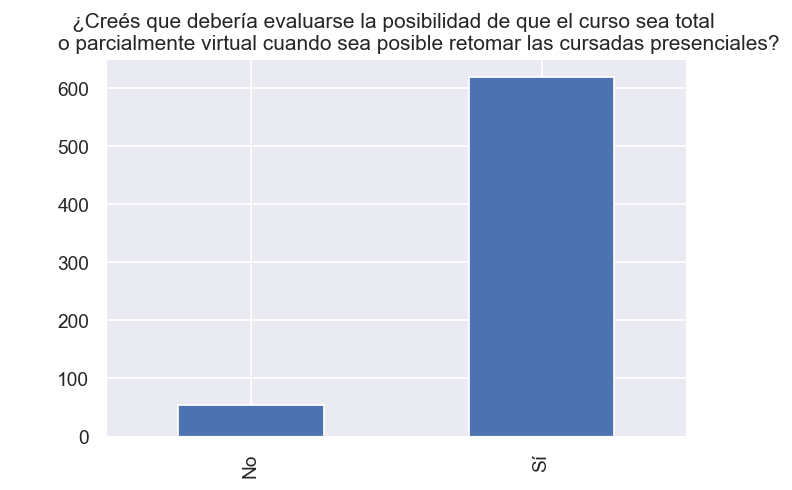

In [32]:
comp['¿Creés que debería evaluarse la posibilidad de que el curso sea total o parcialmente virtual cuando sea posible retomar las cursadas presenciales?'].replace({'Si' : 'Sí'}, inplace=True)

plt.figure(dpi=125)
ax = comp['¿Creés que debería evaluarse la posibilidad de que el curso sea total o parcialmente virtual cuando sea posible retomar las cursadas presenciales?'].value_counts().sort_index().plot(
        kind='bar', 
        title='''¿Creés que debería evaluarse la posibilidad de que el curso sea total 
        o parcialmente virtual cuando sea posible retomar las cursadas presenciales?''')

## ¿Estás conforme con la forma en que el curso evaluó sus contenidos? ¿Te sentiste cómodo/a?

In [33]:
for curso in comp['Elige el curso'].unique():
    display(Markdown(f"## Curso {curso}"))
    com = comp[comp['Elige el curso'] == curso]['¿Estás conforme con la forma en que el curso evaluó sus contenidos? ¿Te sentiste cómodo/a?'].dropna().drop_duplicates()
    if com.empty:
        display(Markdown("_No hay comentarios_"))
    else:
        display(Markdown("\n\n".join(f"- {x}" for x in com.values.tolist() if x != "")))

## Curso 75.40-95.14-Algoritmos y Programación I - 4 - Essaya

- si

- Si, por un lado te exigen mucho como por ejemplo en los tps y en algunos parciales, pero por otro lado esta bueno ya que de esa forma se aprende mas y se hace mas hincapie en lo que uno tiene que mejorar

- Si

- Si, muy comodo.

- Si, creo que fueron parciales razonables. 

- Si, todo lo que se evaluó se había visto en las clases.

- No estoy conforme pero si me sentí cómoda 

- Muy comodo

- Si. El primer parcialito fue algo más complejo de enfrentar al ser la primera vez manejando herramientas nuevas, pero uno transiciona hacia la comodidad.

- sí, muy exigentes, lo cual me parece perfecto, pero también muy flexibles. Se nota que tienen muchas ganas de enseñar!

- Sí, aunque para practicar tenía ejercicios de la época presencial, al evaluar de forma remota y poder usar herramientas como VScode se entiende que sean exámenes de mayor complejidad pero no tenía muchos ejercicios de una dificultad a la par para practicar

- Algunos TPs parecieron pedir mucho con lo que sabíamos hasta el momento, pero los disfruté. Estoy conforme. 

## Curso 75.02-95.11-Algoritmos y Programación I (Electrónica) - 2 - Essaya

- Me sentí comoda durante el curso (salvo por las horas de pantalla al dia que pasaba en todas las clases + momentos de estudio) y me gusto la forma de enseñar de los profesores, dispuestos a ayudar, resolver dudas o corregir tps o examenes con una rapidez increible.

- Si

- Si. Muy llevadero todo.

- Si. Fueron justos

- Si. Si

- si, muy exigente y exigia esatr al da todo el tiempo

- Ñ

- muy

- si

## Curso 75.08-95.03-Sistemas Operativos - 2 - Méndez

- Sí. Los orales fueron un plus en las correcciones

- Si, contenidos interesantes, capaz JOS te agarra un poco desprevenido de entrada, pero se aprende mucho del funcionamiento interno de un Kernel y como con estructuras primitivas es capaz de ser desarrollado.

- Si

- Si, lo que si el tp JOS es muy complicado, pero también tiene su parte interesante.

- Este cuatri implementaron para correcciones orales(30 min) en las que se hacían diferentes preguntas y se revisaba cada TP. Estuvo buena esta modalidad, y me parece una mejora con respecto a las devoluciones por github solamente. 

- Pienso que se tendria que evaluar mejor los contenidos teoricos durante la cursada.

- Si, los docentes son buena onda y te corrigen correctamente

- Sí. Este cuatrimestre se implementó una modalidad de evaluación oral de los TPs de JOS, lo cual ayudó a que quedaran más claras las correcciones, pero sin incomodar o perjudicar al alumno. Los criterios de corrección fueron adecuados y nos dieron la posibilidad de reentregar los TPs para subir la nota.

- No

## Curso 75.09-95.20-Análisis de la Información / Métodos y Modelos de la Ing. del Software I - 1 - Villagra

- No. Totalmente arbitrario dependiendo quién te corrige. Correcciones que no aportan en nada, y no hacen mas que frustrarte, al no entender qué es lo que está incorrecto. Cada oportunidad que se les intento hacer un critica constructiva, la misma fue rechazada, y hasta ninguneada (por ejemplo, el hecho de que te dejen ver los videos a una velocidad mas alta de lo normal, o que los enunciados de las tareas necesitaban ser más específicos).

- Si, aunque a veces me pareciera muy subjetivo la forma de evaluar algunas cosas, pero no me quejo

- No tanto, era bastante demandante y con las preguntas en vez de contestar te daban vueltas. Además te incitaban a "suponer" cosas que no estaban en los enunciados porque decian que es parte de nuestra carrera asumir cosas sin que nos las digan. Donde se ha visto una evaluacion asi??? Y si preguntabas te decian "Asumi lo que te parezca"

- Si

- Si, en muy pocos casos no fue uniforme el criterio de calificación pero supongo que es inevitable.

- Estoy conforme

-  

- Si, me pareció correcto

- Genial! Muy adecuada la forma de evaluar. Siempre tenes que estar al día pero lo hacen súper llevadero. 

- si

- No. Es una materia que de tanta evaluación constante llega al agotamiento y saca las ganas reales de aprender con entusiasmo una materia y sus temas. Tener más de 6 entregas de una semana a la otra considerando que los alumnos deben a su vez trabajar y mantener otras materias es una exageración innecesaria. Muchas de las tareas a su vez no ayudan a la materia en sí y a sus conocimientos básicos, sino son lecturas independientes.  Es una materia que constantemente te hace pasarla mal.

- Si, siempre se evaluó correctamente y lo mejor es que te marcaban una idea o camino para que uno piense y vea lo que estaba mal o incompleto.

- No. Te dan mil tareas ridículas, no te explican nada, se burlan cuando les decis que no entendes lo que hay que hacer, dicen que dejan todo a interpretación pero después te mandan a reentregar múltiples veces si lo no hiciste como ellos quieren (y lo que quieren jamás lo explican). Es como si les gustara molestar a los alumnos, porque cuando les pedis un poco de claridad con respecto a las tareas no te responden bien y, como dije antes, se burlan de vos. Son muy poco claros con el TP, no te explican hasta casi el final de la materia el propósito del mismo. En las clases no te enseñan prácticamente nada, es una materia entera para temas que se pueden ver en 1 mes como mucho. Para el TP te dejan sólo, parece que casi ningún profesor sabe programar así que si tenes alguna duda tenes que arreglártelas por tu cuenta. Lo único bueno es que se puede promocionar.  

- La idea de no tener evaluaciones tradicionales pero tener trabajos practicos me parece excelente, principalmente porque es un estimulo para aprender los temas, y aprender aplicando confome se van viendo los temas y no todo de golpe en un momento especifico.
Llegado cierto punto (claramente a partir de las tareas de modelo de dominio) la cantidad e intensidad de las tareas era saturante. No solo las tareas son largas si no que a la hora de reentregar, los docentes ni siquiera se molestan en marcarte todos los errores, de forma que es muy posible que tu primer reentrega tenga errores que no tenes forma de saber porque nadie te los esta diciendo. De esa forma llegas asustadisimo a la 2da reentrega sin saber si estas entregando una tarea con errores que no te marcaron, lo cual pedagogicamente tampoco es una buena estrategia. Ademas de eso, hay un punto en el cuatrimestre donde tenes:
Entregas individuales
Reentregas individuales
2das reentregas individuales
Trabajo del tp relacionado con documentacion
Trabajo del tp relacionado con programacion.
Se vuelve muy dificil organizarse y tener todo al dia, y basicamente tenes que dedicarle todo tu tiempo a intentar llegar con todo, lo cual te hace sufrir bastante materia en ese punto.
Con respecto al tp grupal, senti que se dio muy poco tiempo para terminar todo, en especial porque mientras haces el tp grupal, tenes un monton de tareas y reentregas individuales, por lo que no te podes dedicar de lleno al tp hasta que tenes todo el resto mas o menos resuelto, y ademas de eso para hacer el tp grupal tenes que aprender a usar tecnologias que capaz nunca antes usaste.
Capaz seria mas comodo empezar el tp grupal una vez que se termine con todo lo individual.
Aun asi, por lo menos todos en mi grupo promocionaron, y calculo que la mayoria del curso promociono, asi que a pesar de todo se pudo con todo y se aprendio en el proceso, por lo que se entiende que hay buena voluntad por parte de los profesores en valorar el esfuerzo y aprobar a los alumnos.

## Curso 75.33-75.43-95.60-Introducción a los Sistemas Distribuidos  - Alvarez Hamelin

- Me parece que los parciales tendrían que ser más conceptuales. Los TPs, por otro lado, me resultaron difíciles en el tiempo propuesto

- Sí

- Si

- Si, totalmente. Faltaría ajustar un poco los tiempos de entregar feedbacks y notas, pero a nivel criterios de corrección estoy conforme.

- si

## Curso 75.01-95.01-Computación - 3 y 10 - Perez Berro

- Sí, el seguimiento semana a semana en los tps fue muy bueno, nos mantenía al día constantemente. 

- Si, me senti comodo. Creo que se evaluó de manera logica a mi parecer. Yo que nunca habia programado tenia al principio un poco de incertidumbre de como iba a ser pero fue todo muy logico, si sabias aprobabas.

- Si, me sentí cómoda

- Si

- Si.

- Si, aunque me haya costado escribir el programa en lapiz me pareció correcto

- si muy

- si.si

- Si, la verdad me gustó mucho la modalidad de trabajo y el hecho de los TPs semanales grupales me ayudó a que entre compañeros también nos alentemos y poder mantener la cursada al día 

- Si, los trabajos practicos semanales son buenos afianzar los contenidos, y poder tener ejercicios similares de guia sirve mucho

- Me hubiera gustado que se evalúe de forma virtual, y no escribiendo el código en papel

- Si, bastante

- Si 

- si

- si totalmente

- Demasiada comoda, las profesoras siempre estuvieron a disposicion de resolver cualquier tipo de dudas. 

- No se me hizo muy comodo tener las evaluaciones escribiendo los programas a mano. seria mucho mas comodo poder programar en los examenes como fuimos haciendo en la cursada. 

- Si, muy cómoda.

- Un curso ampliamente agradable, muy conforme con los contenidos y la forma en la cual fueron dispuestos por parte de los profesores hacia los alumnos 

- Comparé con otros cursos y me parece excelente

- No, era incómodo, trabajoso y llevaba mucho tiempo tener que enviar por escrito el código del programa. Entiendo que es por una cuestión de seguridad pero podría evaluarse la forma de hacerlo más fácil y cómodo para ambas partes.

- Si, la profesora siempre contesto mis dudas y estuvo abierta a consultas personales por meet luego de cada examen.

- Si, totalmente 

## Curso 75.12-95.04-95.10-95.13-Análisis Numérico I/Modelación Numérica/Métodos Matemáticos y Numéricos - 4 - Schwarz

- Mucho

- Sí, sobre todo me pareció que el trabajo práctico fue una muy buena vía de evaluación. Además fue muy útil para poner en práctica los temas teóricos, y también para adentrarse más en el mundo de la programación. 

- Si.

- si

- si, me sentí bien

- Si, estoy conforme

- Me hubiese gustado saber cómo iban a tomar el parcial desde el principio ya me que enfoqué mas en lo practico, y en la misma semana de parcial me enteré que era totalmente diferente.

- Si, me parecio muy interesante el tp grupal al que se le van agregando consignas a medida que se van viendo temas, ayuda a llevar la materia al día tambien

- Si

- Si, en mi opinión los trabajos prácticos fueron muy largos y difíciles ya que anteriormente no vimos nada de programación por lo menos los ingenieros civiles. El resto bien!

- Si muy bien evaluado, no es facil y es acorde.

- Muy conforme

- me siento conforme pero senti que aunque leyera el pdf de la materia  habia algunas preguntas teoricas que no se le dio el enfasis necesario en las clases(aunque capaz fue tema mio de como maneje la parte teorica con el estudio) pero sacando eso me parecio muy buena cursada.

- Si. Los temas me parecieron interesantes, aunque difíciles. Sin embargo, la forma en la que se llevaron a cabo (sobre todo las clases prácticas, con los ejercicios que había que resolver para cada clase) hizo que se pudieran seguir bastante bien, y terminé aprendiendo mucho.

- Si, tuvimos todas las herramientas necesarias para alcanzar con los objetivos

- Si, no fue dificil. 

- Sí, fue coherente con lo dado en clase.

- Estoy conforme.

- Sí.

- Si, examenes donde se tomo lo que se enseñaba 

- Si, estoy bastante conforme.

## Curso 75.18-75.44-95.24-Proyectos Informáticos/Adm. y Control de Proyectos Informáticos I - Fontela

- Si

- Si 

- si

- Si, muy conforme

## Curso 75.12-95.10-95.13-Análisis Numérico/Modelación Numérica/Métodos Matemáticos y Numéricos  - 1 - Menéndez

- Si, quizá la corrección del tp fue un poco dispar entre los grupos (distintos correctores tienen distintas exigencias, entiendo que es normal)

- Sí

- Sisi muy cómodo 

- Si

- comodo

- no

- Si.

- si estoy conforme y cómodo

- si, estoy conforme

- sí

- si, conforme con estudiar mediante ejercicios de la guía es suficiente.

- Totalmente conforme con el curso, me sentí bastante bien

- Si, la instancia de evaluacion fue muy accesible en términos de organización. Los tps fueron largos y difíciles pero interesantes. 

- si, fue aceptable. 

- si

- No estoy conforme. 

Los TPs me parecieron demasiado exigentes para un curso tan introductorio. Pude completarlos satisfactoriamente, pero requirieron demasiadas horas de trabajo. Me parece bien que tuvieron instancia de recorrección y una instancia de evaluación oral para medir qué parte del trabajo hizo cada integrante del grupo.

En lo que respecta al parcial, me parece muy positivo que lo hayan hecho a libro abierto para esta materia: no tiene sentido exigir que el alumnado se memorice cada una de las expresiones, pues el foco debería estar puesto en comprender cómo y por qué funcionan los métodos numéricos y en cómo evaluar su efectividad. 

Sin embargo, considero que dieron demasiado poco tiempo para su resolución, dada la longitud del parcial y el hecho de que es en papel y a mano (una hora veinte para resolver tres ejercicios teóricos y dos prácticos, diez minutos para subir las fotos del examen). Esto me parece gravísimo.

Con tan poco tiempo, no hay margen para cometer errores de cuentas: hay que resolver todo perfectamente al primer intento. Por ejemplo, en un ejercicio práctico de métodos iterativos (siempre hay uno), equivocarse al principio en una cuenta conlleva que el método no converja y eso, a su vez, impide seguir avanzando con los demás incisos del ejercicio. Eso es desaprobación directa. El tiempo no alcanza para corregir el error una vez identificado.

Considero que para que ese parcial sea una herramienta pedagógica útil, deberían darse como mínimo veinte minutos más para su resolución.


## Curso 75.39-Aplicaciones Informáticas - Ierache

_No hay comentarios_

## Curso 75.06-95.58-Organización de Datos - 2 - Collinet

- no me gusto que la diferencia entre aprobar y promocionar sea solo de 1 punto

- Totalmente, me sentí cómodo y respetado

- Sí

- Si

- con el parcial me sentí muy cómoda como evaluaron, no inventaron formas raras de evaluar o pedir que haya absoluto silencio en una casa que es imposible que otros docentes piden o poner 3 cámaras o cosas raras sino que se adecuaron a cada alumno y tomaron por medio de un form lo cual estuvo bueno. El final es oral, en mi caso se hicieron preguntas orales acordes , nada fuera de lo comun. Muy bien evaluado.

- Me sentí muy cómodo durante el parcial y creo que estuvo bien evaluado. El oral promocional en líneas generales esta bien. Se hacen preguntas adecuadas y no súper especificas. Lo único negativo fue la duración del oral, que considero algo exagerada en mi caso (bordeando las 2 horas) aunque también es cierto que da cierto margen para equivocarse y reivindicarse en algunos casos

- Creo que las evaluaciones estuvieron muy bien pensadas y diseñadas, y lo evaluado fue acorde a lo que vimos e hicimos durante el cuatrimestre.

- Totalmente conforme. Súper cómodo con un trato genial. Momentos de digresión hermosos solían ocurrir en el curso.

- TP: ambas partes del trabajo práctico me parecieron correctamente evaluadas, cerré todos los conceptos de la materia haciendo el trabajo práctico. Además me parece correcta la división en las dos partes, sirve para entender que es inteligente primero pensar y luego accionar en el mundo de la ciencia de datos.

Parcial: no me sentí conforme. Los ejercicios que fueron evaluados no me parecieron útiles ni tampoco sentí que te evaluaban bien. Que determine si aprobás un examen o que no lo aprobás el escribir una cuenta trivial en un google forms (que tiene sus limitaciones de comodidad) me parece no sólo injusto, también ilógico. Sin embargo en su momento expresé mi disconformidad con mi corrector quien iba a elevar mi opinión a los profesores. Espero lo cambien.

Final promocional: me parece perfecto. Un oral donde tenés que demostrar todo lo que sabés de la materia. Sentí que estaba un poco solo al principio, es decir, uno está acostumbrado a tener una consigna, el tener que hablar como si fuera que preparaste una clase sobre todos los temas de la materia es un poco confuso. Yo agregaría algunas preguntas iniciales.

- Si, me parecio acorde a la cursada

- Masomenos. En el parcial se tomaron ejercicios que no se vieron de esa forma particular, pero si estudiaste los conceptos los sacabas.

- La modalidad esta muy buena aunque por la falta de exámenes de otro cuatrimestre me costo un poco prepararme para rendir. 

- La evaluación de los contenidos de la materia fue justa. 
En un principio me pareció que forzar a implementar determinada cantidad de modelos quitaba espacio para explorar cada modelo en particular y probar distintas cosas. Pero al terminar el TP le encontré ganancia en poder comparar cómo fue el uso iterativo de cada uno. 
Creo que podría haber una instancia de consulta 1:1 con el corrector asignado en la mitad del tiempo para realizar la parte 2 del TP para la cual daría 1 mes y no 2. 

- El parcial fue muy útil para ver cómo venimos con los temas, me pareció una buena forma de evaluar. 
El oral también fue justo y no te hacen sentir presionado.
Creo que hay que reforzar algunos detalles. Sentí que en las clases se ven todos los temas por separado y quedamos un poco sólos al momento de juntarlos en el TP. Faltaron más detalles en las correcciones, remarcar las cosas que se hicieron bien o mencionar otras opciones de resolución. Al final de la materia se podría proponer a los alumnos hacer públicos sus repositorios así vemos otras opciones de resolución del TP de nuestros compañeros.

## Curso 75.29-95.06-Teoría de Algoritmos II - Buchwald

- Si

## Curso 75.06-95.58-Organización de Datos - 1- Argerich

- Si

- En algunos aspectos me pareció que lo que daban en clase no era lo que evaluaban en el parcial.

- La metodología de evaluación me pareció acorde. Tal vez se haga un poco pesado tener parcialito por cada tema debido a que se tiene que llevar la materia al día, pero es mejor a la alternativa de tener un solo parcial.

- No, la forma de enseñanza fue penosa, mas teniendo en cuenta la facilidad que es grabar un vídeo haciéndolo claro una sola vez, estaba todo hecho así nomas.

- si

- Creo que si, en mi caso me fue bien en todos los exámenes (recuperé uno en primer instancia) pero no llegué a estudiar para el promocional, creo que la segunda mitad estuvo muy desbalanceada y alejada de la realidad de un estudiante en pandemia. Uno quizá no tiene tiempo de ver muchas horas de videos teóricos, hacer el tp2 que es extenso, cursar el horario de manera normal y hacer ejercicios, sin dejar de hacer otra cosa de otra materia. Por lo menos a mí me costó mucho encontrar el balance y perdí la chance de promocionar pese a tener muy buenas notas. 

- No

- Sí.

- Muy bueno el curso. Me gusta la forma de evaluar una vez cada dos semanas los temas más recientes. Uno termina aprendiendo mucho más (o eso me pasa a mí), aunque le tuve que dedicar bastante tiempo. El tp es muy divertido. 

- Si. Por supuesto que es mas facil rendir teniendo acceso a los apuntes

- No, aprobas según quien te corrige..... No entiendo como para algunos profes esta bien tu parcial, y para otros sos un desastre... Deberían comunicarse estas cosas. He visto gente que aprobaba con un parcial muy similar al mio y yo no... teniendo que ir a un recu sin sentido..

- Super conforme 

- Los parcialitos están bien, el final de promocion también. El tp2 ayudaría tener una mejor idea de que se espera en la entrega, la clase de consulta extra ayudo bastante. Que no se pongan densos con la camara y el microfono ayuda bastante

- No, la forma de evaluar es demasiado complicada

- No, me parece que la única pata floja fue la instancia de corrección en general. Muy poco abiertos a debatir sobre resoluciones de ejercicios (sentí por momentos que la instancia de poder alegar sobre una corrección estaba allí por obligación ya que parecía que los profesores te abordaban sabiendo que no iban a cambiar su corrección por nada. Y eso era muy frustrante) y muy poco unificada la corrección entre distintos docentes (que entiendo por experiencia propia que es algo realmente difícil de lograr en un curso.). Me pareció una falta de respeto bajar 20 puntos en el tp final por no subir link del video (cosa que si hicimos) lo que me lleva a sentir muy poco valorado el esfuerzo de cada estudiante a la hora de afrontar un curso tan difícil. (el video estaba, si google no pudo procesarlo hay que bajar el video y verlo local, no es que no lo subimos. tenia fecha de subida y todo.) Pero que se entienda la frustración del alumno luego de tanto esfuerzo y que por no poder abrir el video te bajen 20 puntos. Te hace pensar para que tanto esfuerzo?

- Si.

- Si, me pareció que evaluaron bien los contenidos.

- No estoy conforme. Explican una cosa y luego evaluan otra. No digo que los examenes tengan que ser iguales, ni mucho menos, a los ejercicios que dan en clase, pero lo de este curso esta a otro nivel. 

- Si, las correcciones son explicadas y fundamentadas.

- Las evaluaciones incluyen muchas veces ejercicios cuya resolución no se vio NUNCA  a lo largo de las clases. Esto llega a un punto que parece hecho completamente a propósito.

- Si, aunque la materia tiene partes en los que es necesaria la presencialidad con el docente  y con los compañeros de grupo.

- Si!

- La idea de separar los temas en parcialitos esta buena, porque te obliga a llevarla al dia, a veces los ejercicios eran muy largos como para hacerlos en una hora como el de spark de la primera fecha aunque luego agregaron tiempo..
Ya que disponen de una gran plantilla docente y las clases se graban los recuperatorios de los temas podrían ser separados tranquilamente mientras la clase se da otro profe puede tomar el recu y no esperar a la fecha donde se evalúan todos juntos.
Osea separar pandas y spark en un dia. Y lsh e ir en otro dia, y dar tres horas para resolverlos,
O que el recuperatorio de un tema sea el lunes o jueves próximos después de entregar las notas. Eso se podria aplicar.

- No. Me parece una falta de respeto de la cátedra mandar las clases teóricas grabadas para ahorrar tiempo de clases y solo mostrar ejercicios en clase. Muy malq estrategia

- Las correcciones no fueron lo suficientemente detalladas. Deberían dar la resolución al examen una vez terminado para así comparar con lo que se esperaba del alumno por parte de los docentes.

- No. Las clases estaban muy buenas, los temas también, pero las correcciones de las evaluaciones me parecieron exageradas, le buscaban "el pelo la huevo" como dice el refrán para restar puntos.
En el caso de los tps, la comunicación de las correcciones me pareció agresiva despreciando el trabajo y esfuerzo dedicado en el mismo, pero ya me habían advertido sobre esto así que no me alertó en el momento.

- La forma de evaluacion es mucho mejor a un parcial unico. Seria bueno presentar una solucion de la catedra de los examenes.

- Si, tomaron lo que se vio o con algúna vuelta de rosca pero nunca queriendo complicar innecesariamente al alumno. Además la instancia del parcial realmente era de aprendizaje, incluso creo que el hecho de tener el material a disposicion sumó a que uno saliera de rendir sabiendo más que cuando entró y no solo demostrando lo que sabía.

- Sí.
Sí.

- Se sintió que los temas estuvieron dados muy por arriba, o había un desnivel en cuanto a cómo se presentaban los temas o se daban, frente a lo que después se terminaba tomando.  Muchos temas terminaba quedando más la parte teórica que la práctica, que es lo que más se utiliza en el día a día y para trabajar. 


- Si, aunque siento que a veces falto un poco de claridad para especificar las expectativas que tenían de los tps. 

- Hasta el parcial hubo mucho contenido tanto teórico como práctico y fue bueno para llegar a rendir. Para el integrador son muchos contenidos que se evalúan, que se dan en forma teoría pero personalmente creo que falta una cantidad de contenido práctico. Practicando con finales anteriores se dificulta mucho ya que se toma con un nivel o cierto ejercicio se toma de cierta forma que nunca se dio la práctica correspondiente, o se dió con un nivel menor.

- Algunos ejercicios requieren ese plus o epifanía a la hora de resolverse. Sin embargo, nunca se tomó algo que no se haya dado.

- Se toman parcialitos de los primeros 4 temas. En particular uno fue muy dificil comparado a los visto en clase. 

- El examen final fue algo distinto de lo esperado. Vimos mucha teoria y poca practica entonces al tomar ejercicios nunca vistos fue dificil

## Curso 75.15-75.28-95.05-Base de Datos - 1 - Beiro

- Si

- Definitivamente

- Si completamente

- Estoy conforme :)

- Muy cómodo

- Sí

- Sí, como mencioné anteriormente, el curso me pareció muy bien armado y los profesores son realmente excelentes, siempre dispuestos a resolver dudas.

- Me parece excelente la modalidad de evaluación que plantean, los parcialitos te preparan para el parcial, lo cual me resultó muy útil.

- Si, los parcialitos son una buena herramienta para llevar al día los contenidos de la materia.

## Curso 75.42-Taller de Programación I - 3 - Deymonaz

- Fue muy raro todo. Nunca se entendió del todo como era la forma de evaluación, había gente que no era de la cátedra evaluando y no hubo un buen trato por parte de los profesores. No me gustó.

- si

- Si

- Si, supwr cómodo

- Totalmente conforme con la forma de evaluar una materia con SEMEJANTE proyecto que se trabajó durante todo el cuatrimestre. Súper cómodo.

- Si, muy comodo.

- Si, el proyecto se evalúa a lo largo del cuatrimestre lo que permite ir trabajando de forma pareja y tener siempre un docente que te va guiando

- Muy conforme. Considero muy acertado que los talleres sean tratados como tales( tipo de cursada, tipo de exámenes y demás) y no como una materia más.

- La evoluciona continua de la cursada me ayuda a poder mantenerme al día, ademas su modalidad de final me pareció la indicada para este tipo de materias

- Muy conforme

- Sí, el modo de evaluación es muy realista, es la primera materia que tengo donde las cosas realmente se asemejan un poco al formato que se maneja en la vida real cuando uno trabaja en una empresa.

- Si!

- Se adaptó a lo que es la materia, mucha práctica y un TP a la altura creo yo.

- Si muy cómodo

## Curso 75.12-95.04-95.13-Análisis Numérico I/Métodos Matemáticos y Numéricos - 5 - Sassano

- No, la forma de evaluar es absurda, pero al ser una cátedra tan fácil a nadie le molesta, porque igual vamos a aprobar todos. Los criterios de corrección en los parciales no tienen sentido para los contenidos de la materia y lo que se termina evaluando es memorizar un par de formulas y no cometer errores de calculo.

- Si, los temas evaluados eran acordes a los explicados en las clases

- Sí. Los 2 tps fueron interesantes, había que pensarlos un poco pero no era nada que no se pudiera hacer. El contenido y la dificultad de los exámenes me pareció adecuado. Muy conforme.

- Si. 

- Me parecio demasiado necesitar dos camaras para rendir y tener que armar un tripode para que se vea todo el espacio en la camara

- Siento que fue lo más parecido que se pudo a un examen presencial. Me pareció de las mejores formas de evaluación que tuve desde la cuarentena.

- Si, lo único que me gustaría es que la nota final no sea únicamente la del examen integrador. En mi caso particular tuve muy buenas notas en la cursada y en el integrador una menor nota y me quedó esta última. Creo que se debería tener en cuenta el desempeño en la cursada y no sólo la última nota.

- No del todo, hubo temas del parcial y de los trabajos prácticos que no tenia sentido evaluarlos. Que era saberse una formula o no en el caso del parcial y en el tp todo lo que es Fourier no tenia nada de sentido que sea evaluado y menos de esa forma

- Si. Estoy conforme. Me sentí comodo

- SI

- Si

- Sí, estoy muy conforme con como se evaluó. El tiempo era adecuado y los ejercicios al nivel de lo que había en las guías.

- En general si. Se debería dar mas importancia o evaluar un poco mas los últimos contenidos de la materia previos al final.

- Me pareció que el segundo TP fue demasiado complejo y que no reflejaba el nivel de las clases teóricas. A su vez, creo que en la segunda parte de la cursada no se subieron videos de práctica, resolviendo ejercicios de la guía o de parciales/finales; una pena, porque me ayudaron un montón en la primera parte.

Por otro lado, creo que los profesores en general se mostraban muy accesibles, dispuestos a ayudar, a explicarte los temas mil veces y a guiarte cuando te notaban perdido. Se aprecia mucho :D

- Muy conforme. Se evaluó lo que se dio, hasta hay ejercicios grabados de parcial.

- exagerados con lo de la camara

- Si, principalmente por el equipo de docentes de la práctica. La materia está dada con muy buena voluntad y de esa forma se facilita muchísimo el aprendizaje 

- Si, pero el 2do TP fue bastante complejo especialmente si no se tenía una buena base de materias anteriores como Computación, ya que en este TP no nos dieron ejemplos de algoritmos para los métodos solicitados.

- Definitivamente.

- La docente del curso se puso extremadamente exigente, tomando cosas que jamás se habían tomado y que no se explicaron en clase, porque "la cursada virtual es menos formativa que la presencial".
He cursado otras materias en cursos excelentes que han sabido aprovechar la virtualidad y han no sólo aprendido nuevas herramientas sino también se han formado los docentes en cómo dar clase a distancia y en cómo adaptarse a la nueva metodología que es dar una clase remota.
Lo único que hizo este curso fue quejarse una y otra vez de que la cursada virtual no sirve, que los estudiantes se copian, nos han tratado de forma despectiva y nos han constantemente minimizado y ninguneado.
No me sentí cómodo en absoluto y dudo que alguno de mis compañeros sí se hayan sentido así.
Los únicos que zafan, hasta ahí, son los ayudantes del curso, que cuando te ven sufrir después de 1 mes con un mismo tp te tiran un centro. Pero en términos generales, no le deseo a nadie la experiencia de cursar con Sassano y sus monos voladores.

## Curso 75.09-Análisis de la Información - 2 - González

- Si

- Para nada conforme con cómo se evalúa. Es la primera materia de toda la carrera (cursé varias) que me hacen estudiar cosas de ABSOLUTA memoria. El final te hacen repetir cosas de memoria, horrible. ¿Para qué sirve en ingeniería repetir como un loro?.

## Curso 75.04-95.12-Algoritmos y Programación II (Electrónica) - Calvo

- Parcial: No, criterio de aprobación exageradamente rigurosa. 
Final: Si, razonable. 

- Si

## Curso 75.07-95.02-Algoritmos y Programación III - 1 - Suarez

- Ni conforme ni cómodo. Las clases fueron muy pobres. 

- No. Se esmeran en hacer que la pases mal. Salvo algunas excepciones de docentes buenisimos.

- Si

- Parcialmente

- No.

- Los criterios de corrección pueden ser diametralmente opuestos según el corrector

- El parcial fue muy confuso.

- si

- Relativamente. En el primer TP me pareció que terminé aprendiendo a golpes, pero en el 2do TP sí pude aplicar lo visto y recibir una evaluación muy buena. En cuanto al parcial, creo que hubo mucha confusión en cuanto a lo que se tenía que hacer y me parece que en ese sentido el simulacro solo aportó a la confusión. De todas maneras el parcial en sí no estaba mal, sino que los límites entre lo que se pedía y lo que se tenía que abstraer fueron de dificil comprensión.

- Hay una evidente e incluso explícita falta de unificación de criterios a la hora de corregir material evaluable. Podés entregar un tp con implementaciones y patrones de diseño muy similares a los de tps de otros compañeros y, aún así, si tocan diferentes correctores hay altas probabilidades de que mientras a uno le destacan positivamente un diseño al otro le digan que está mal o que debería hacerse otra cosa y lo desaprueben.
Por otro lado, personalmente me parece malo que sólo haya una única instancia de recuperación del tp1 que lo pueda dejar libre a uno de la materia, y más aún que las devoluciones demoren tanto tiempo (el tp2 es grupal y muchos grupos debieron formarse antes de saber quién quedaba libre de la materia, ergo, hubo grupos que terminaron siendo 3 alumnos para un tp final pensado para hacerse de a 5).
El primer parcial fue excesivamente largo, tanto que parecía absurdo al lado de los simulacros hechos en clase e incluso al lado de los posteriores recuperatorios.

- No. El parcial fue de una dificultad mucho mayor a la esperada, totalmente distinto a los ejercicios de práctica y al simulacro.

- No, los temas fueron evaluados de una manera completamente diferente a la plantada por los profesores. Previo al parcial se realizó un simulacro que estuvo completamente alejado de la forma en la que se evaluaron los contenidos posteriormente. El parcial no era imposible, con práctica se puede realizar, pero realmente se practicó para otro tipo de evaluación. 

Además de lo mencionado, las "resoluciones" de los parciales luego propuestas por los profesores para poder comprender como debería resolverse y aprender de esto, fueron increíblemente vagas y poco claras. No se mostró la totalidad de la resolución, ni se tuvo en cuenta todo lo pedido en la consigna de los parciales. 

- POR FAVOR NOS PUEDEN DAR LAS NOTAS DEL FINAL A TIEMPO. NO PUEDE SER QUE MAÑANA SE RINDE UN FINAL Y NADIE NOS DIO LAS NOTAS TODAVIA DEL FINAL DEL 12 DE AGOSTO. YA ME QUEJE POR TODOS LADOS SIEMPRE HACEN LO MISMO CON ESTA MATERIA NUNCA SE ENTREGA NADA A TIEMPO

## Curso 75.12-95.04-95.13-Análisis Numérico I/Métodos Matemáticos y Numéricos - 3 - Griggio

- Si me parecio acertada la forma de evaluación. Me senti comoda y lo senti accesible en cuanto a contenidos y tiempo de evaluación

## Curso 75.67-Sistemas Automáticos de Diagnóstico y Detección de Fallas I - Merlino

- si

- Si, fue tranquila la materia, si le ponías un poquito de onda salía fácil.

## Curso 75.42-Taller de Programación I - 2 - Azcurra

- No

- Si

## Curso 75.14/95.48-Lenguajes Formales - Corsi

- Si

- Si, me pareció correcto.

- SI

- Sí

## Curso 75.41-95.15-Algoritmos y Programación II - 4 - Méndez

- Si

- Si es exigente el curso pero sin duda los temas vistos son de mucho valor

- Si, estuvo muy bueno todo, los TPs fueron bastante dificiles, pero pude terminarlos y aprendi un monton.

- Si, evaluaciones muy completas. Me sentí muy cómodo

- Muy conforme. Deja mucho margen para poder responder con comodidad, siempre y cuando esté bien justificado.

- Completamente

- Sí

## Curso 75.29-95.06-Teoría de Algoritmos I - Podberezski

- Si

- Si. Este cuatrimestre se agregaron parcialitos optativos de todos los temas durante el cuatrimestre, lo cual permite promocionar la materia o rendir menos temas en el final. Estas evaluaciones optativas ayudaron mucho a llevar al dia la materia, y siempre beneficiaron al alumno. Los criterios de corrección de los trabajos prácticos y de las evaluaciones fueron justos y se aclararon siempre en clase, y por cada TP hubo dos oportunidades de reentrega.

- 100%

- Sí, los ejercicios que toman tanto en los exámenes como en los tps no son boludeces y obligan a uno a procesar y comprender bien todos los temas para poder resolverlos correctamente.

- Si, fue expeditivo en qué me equivoqué y qué debo tener en cuenta para que esté bien la solución.

- Sí, los ejercicios tomados son similares a lo explicado en la práctica

- Sí. Se evalúa los contenidos dados en clase.

- Sí. Tienen un gran sistema en el que cada uno puede llevar la materia al ritmo que quiere, algo muy valorable, sobre todo siendo una materia optativa. Son muy justos al evaluar. El tp esta bueno y está pensado para que si tus compañeros abandonan la materia o cuelgan no la pases mal. 

- Si!

## Curso 75.01-95.01-Computación - 5 - Arriazu

- si

- Si

- Muy conforme, los exámenes son accesibles y me gustó mucho la modalidad del final. La profe te hace sentir muy cómoda y te quedas con ganas de seguir aprendiendo

- totalmente conforme

- Si conforme

- Sí

- Si. Los parcialitos me fueron útiles para estar al día y los TP me sirvieron para fijar cosas

## Curso 75.02-95.11-Algoritmos y Programación I (Electrónica) - 1 - Cardozo

- no, podria ser mucho mejor, viendo opiniones y metodos de evaluacion que se utilizaron en otras catedras. es muy pobre 

- Excelente 

- Solo rendí un examen y me pareció bien todo. Desconozco sobre la forma de evaluar los demás exámenes y el TP porque no los rendí.

- En cuanto al Trabajo, considero que faltó práctica con temas como Tipo de Dato Abstracto, antes de largarnos al Trabajo Práctico sin herramientas.

- No pude terminar la cursada ya que se me complico tanto material.

- creo q los ejercicios se parecian a los de la guia de ejercicios.

## Curso 75.41-95.15-Algoritmos y Programación II - 3 - Juárez

- Totalmente

- Si, me parece que uno aprende más y mejor aplicando las cosas en los trabajos prácticos.

- Sí, la verdad que me sentí muy cómodo al respecto.

- si

- Estoy conforme

- Cómodo y conforme con la calidad de los docentes

- Me gusto la forma de regularizar la materia con puntos. Son 3 trabajos practicos, 2 individual y el ultimo grupal. La dificultad se va incrementando pero los ayudantes estan para responder todas las dudas. Si llegas a cierta cantidad de puntos rendis solamente el oral (final se divide entre parte escrita y parte oral)

- Si, todo bien

- Si

- Si y no, explayo en la prox pregunta.

- Muy buenos tps!

- Si, me senti bien con la forma de evaluación del curso

## Curso 75.41-95.15-Algoritmos y Programación II - 2 - Buchwald

- Si conforme

- Medio difícil responder esto. Me pareció un curso demasiado demandante. Entiendo que tiene un temario largo pero creo q algún tp/tda se podría suprimir o reducir la cantidad de parciales porq parece una carrera contra el tiempo y si no entendiste enseguida un concepto, volaste. Se te hace difícil de remontar la materia. Creo q es una materia para hacerla sola o con otra q no requiera mucho tiempo. 

## Curso 75.10-Técnicas de Diseño - 1 - Pantaleo

- Sí, totalmente. 

- Si

- Totalmente

- Estaría bueno que cuando se envía una tarea para consultar dudas, estas sean respondidas en forma personal para saber en lo que uno se equivoca y mejorar. Lo mismo con los parciales, en caso de desaprobar estaría bueno saber el porque. 

- Si totalmente!

## Curso 75.26-95.19-Simulación - Caiafa

- Sí, totalmente.

- Si

- si

- Sí

- Si, conforme

- Estoy muy conforme con todas las formas de evaluación, me parecieron todas acordes y me ayudaron a afianzar mis conocimientos. Me sentí muy cómodo

- Mucho mas comodo que otras materias de la facultad. Muy conforme

- Sí perfecto

- Sí, perfectamente.

- Sí, me pareció justo y bien organizado.

- Conforme.

- Estoy conforme con el uso del campus como medio de evaluación, pero en el exámen se agregó un dato al enunciado durante el transcurso del mismo. Lo cual hizo que haya errores en el desarrollo.

## Curso 75.42-95.08-Taller de Programación I - 1 -Veiga

- Sí

- El nivel de las clases es muy bueno y los profesores explican todo con mucha claridad, sin embargo me parece desmedido el tamaño y dificultad de los trabajos prácticos. Ademas, me parece que las correcciones de los mismos son demasiado duras, y no todos los profesores tienen los mismos criterios: me paso en dos tps diferentes hacer igual una misma cosa, en el primer tp no recibí ningún comentario mientras que en el segundo se me marco como error. Destaco la celeridad de los docentes para responder por discord, siempre buscando ayudar al alumno. 

- Se sobreexige al alumno, cuando se podría llegar a un aprendizaje casi tan bueno, con muchísima menos carga en los tps. 

- No. Exigían demasiado

- Si, me hubiese gustado quizas un TP Final menos cargado de cosas pero es un lindo desafio.

- La catedra es muy demandante en cuestion de tps, es una barbaridad de tiempo que hay que dedicarle al tp final, y si uno esta trabajando, se hace dificil el poder llevar otras materias a la par de Taller. Igualmente es un monton lo que se aprende, pero tiene como costo el tiempo que se le tiene que dedicar.

- Si

- En cuanto a las evaluaciones me resultaron acordes pero el tiempo me pareció poco, más aún cuando se superponían varias entregas de TPs. 

- Para el final se da poco tiempo, y no poder volver para atrás con los ejercicios es muy molesto. Se siente mas un examen de memoria que de conocimientos. 

## Curso 75.52-Taller de Programación II - Calónico

- Si

- Sí, el curso se adecúa perfectamente a la modalidad virtual.

## Curso 75.47-Taller de Desarrollo de Proyectos II - Fontela

- Si, todos unos genios

- Sí

- Si, fue tal cual se planteó desde un principio.

- Buena metodologia

- Muy conforme. Me sentí cómodo con la evaluación aunque ésta fue algo exigente y aunque creo que hay algunos criterios que son dispares. De todas formas, esto que menciono debe ser tomado con pinzas porque parte de la dificultad de la materia ("el cambio de cliente a lo largo del proyecto") radica en la multiplicidad de criterios.

- El rol de docente / cliente es bastante polémico, con un cliente podes negociar, llegar a acuerdos y entendimientos. En cambio con un docente que es la misma persona que te evalua no, es dificil que haya grises. Grupos de 3 personas terminaron haciendo casi el mismo trabajo que grupos de 4 personas. Y acá también va en parte el (no) poder hablar con el cliente / docente. Siempre te exigen más.

## Curso 75.59-95.09-Técnicas de Programación Concurrente I - Deymonaz

- No

- Si, muy conforme.

- Si, que se evalúe por tp y no por parcial me parece lo mejor, quedan mas afianzados los conceptos, ademas de que es una materia taller

- Si

- sí

- Sí

- Sí, me pareció muy innovadora la modalidad evaluciación. Debería aplicarse en otros cursos también.

## Curso 75.07-95.02-Algoritmos y Programación III - 2 - Méndez

- Siempre se tomó lo que se dió, nunca hubo nada diferente a lo que nos enseñaron

- Muy, un equipo docente excelente y una cátedra muy bien armada. Super recomendable.

## Curso 75.12-95.04-95.13-Análisis Numérico/Métodos Matemáticos y Numéricos - 6 - Rodríguez

- Si

- Aceptable

- Si, el parcial se adecuo perfectamente a los temas dados en clase y eran accesible si uno estudiaba

- Si, lo evaluado fue lo enseñado en clase.

- Aveces te marías en las pestañas

- si

- La cursada me pareció que buscaba generar el interés y la participación de los alumnos. Los profesores siempre estuvieron atentos a las inquietudes y respondieron rapidamente.

- Sí

## Curso 75.40-95.14-Algoritmos y Programación I - 1 -Guarna

- Si

- Al principio costó adaptarme, pero cuando entendí como venía la cosa, si.

- si

## Curso 75.03-95.57-Organización del Computador - 2 - Moreno

- Si

- Si, es muy buena la manera en la que se evaluó con los trabajos prácticos 

- Si, pero aun sabiendo mucho de la materia y entendiendo mas o menos todo no se si me siento preparado para el final porque no se nos evaluo nunca de esa forma en la cursada. 

- no estoy conforme

- Si estuve conforme. Quizas faltaron algunas devoluciones (explicaciones de lo que hicimos mal o bien en nuestros tps) pero no fue culpa de los profes ya que tuvieron muchas complicaciones por falta de docentes

## Curso 75.40-95.14-Algoritmos y Programación I - 3 - Méndez

- Si

- Sí

- Me gusto mucho la evaluacion mediante tps y en los parciales y finales me senti muy comodo

- Si.

- Me sentí muy cómodo. Desde el primer momento te hablan en un tono que te hace sentir bienvenido. Hay un muy buen ambiente en esta cátedra.
En los TPs habían muchas oportunidades para que te contesten las dudas, ya sea en las maratones de consultas, por los canales de Slack o hablando directamente con el corrector que se te asigna al empezar el TP. 
El programa que usan para evaluar tu trabajo también me pareció bastante bueno.

- Si, totalmente.

- Si muy comodo

- No pude sentirme más cómodo con el método de evaluación. 

- Sí.

- Excelente 

- Totalmente conforme. Me sentí super cómodo con la manera en que se evaluó en la plataforma de la cátedra y cómo se respondían las dudas por el meet.

- Estoy conforme , me sentí muy cómodo 

- Excelentes

- Las evaluaciones estuvieron muy bien implementadas, es cierto que la página no contaba con las funciones que uno suele tener cuando programa por su cuenta, como lo son el copiar y pegar o el autocompletar, pero aún así se sintió como la manera correcta de evaluar la materia. (Tampoco sé como se planteaban las evaluaciones en la presencialidad pero así en principio es mucho mejor que lo que sería escribiendo el código con lápiz y papel). Los TPs, aunque difíciles, cimentaron muy bien los conocimientos enseñados y que los docentes aceptasen consultas de todo tipo ayudaba mucho a evitar frustraciones.

- si

- Si muy comodo, me gusto mucho el desafio de los tps

- Si, me sentí cómodo

- Sí, la metodología de evaluaciones estuvo muy bien armada.

- Si y si

- Si, completamente cómodo.

- Si, tanto los TPs como las evaluaciones tuvieron temáticas copadas sin perder la seriedad o la dificultad que deberían tener

- Totalmente conforme, me sentí muy cómodo.

- Si, efectivamente.

- Si, muy conforme y muy comoda. Siempre habia lugar para dudas y todo se recibia con muy buena predisposicion

- Sí, los trabajos prácticos, en mi opinión, son la mejor manera de evaluar.

- Completamente conforme y cómodo.

- Muy conforme. Los metodos de evaluacion se ajustaron muy bien a la cursada virtual

- Estoy conforme. Ademas, me pareció mucho más adecuada la forma en la que se nos evaluó en comparación a los parciales/finales a lapiz y papel.

- SI

- Si a todo

- Si estoy re conforme, fue súper cómodo cursar con esta cátedra

- Muy conforme y siempre me sentí cómodo.

- Si, las evaluaciones fueron bastante niveladas y los trabajos practicos fueron desafiantes pero divertidos de resolver.

## Curso 75.24-75.31-95.07-Teoría de la Programación/Teoría del Lenguaje/Teoria de Leng. de Prog. - Ferrigno

- Si

- Me sentí muy cómodo, antes de cada clase se enviaban las diapos que se iban a ver durante las clases para poder leerlas y ponerse en tema para luego profundizar. Por otro lado las instancias de consultas para el tp fueron perfectas, nada para mejorar.

- Me gustó bastante el tp y ver los videos de otros grupos

- Estoy conforme con los contenidos evaluados.

- Si. Hubieron muchas clases donde se explicaba la teoria del lenguaje en si, utilizando Oz como lenguaje de programación. La modalidad consistia en realizar un TP grupal de a 4 sobre cierto lenguaje de programación que te tocaba, realizando un proyecto y luego un video de 40 minutos explicando caracteristicas de ese lenguaje.

- si

- Sí

- 100%

- Si, el trabajo práctico estuvo muy bueno. Lo disfruté un montón y aprendí también 

- Si, puede poner en practica algunos de los temas vistos en el tp.

- Nos dieron una tabla con criterios de correccion para el tp que despues no se uso o al menos no nos mostraron las correcciones en base a esos criterios

- Estoy conforme con la forma en la que se evaluó el contenido.

- Estoy conforme con como se evaluaron los contenidos. La evaluación consta de hacer un trabajo práctico integrador durante toda la materia. Para esto se elige algún lenguaje y se desarrolla un caso de uso del mismo. El único problema es cuando la carga de trabajo no esta bien distribuída en el grupo, pero fuera de eso esta muy bueno.

## Curso 75.48-Calidad en el Desarrollo del Sistemas - Pantaleo

- Para nada. Creo que este es el punto más flojo de toda la materia, ya que los temas pueden ser más o menos interesantes, el TP en mi gusto personal no estuvo nada mal, pero el criterio de corrección es totalmente subjetivo. Tanto los trabajos prácticos como los parciales terminan siendo una lotería, en particular di parciales que pensé que estaban bien y desaprobé, y otro que pense que estaba bastante mal y aprobe con nota bastante alta. Trabajos prácticos de personas recursantes con notas excelentes en cuatrimestres pasados que entregaron prácticamente lo mismo (ya que el TP es muy similar) y apenas aprobaban. Hubo puntos de los enunciados que eran confusos y aunque todo el curso lo entendió de una forma y no se hizo ningún tipo de autocrítica. 

Realmente es una lástima porque veo que en la práctica le ponen muchas pilas, se esfuerzan por hacerlo lo más llevadero posible, tanto Jimena como Florencia se ponen la materia al hombro y basicamente dan todo el contenido. El enfoque de aula invertida y revisión del TP en cada clase me pareció que fue correcto, salvo los detalles menores que se marcaron en la retrospectiva de final de curso. Ojalá pueda llevarse un criterio de corrección un poco más objetivo, empaña mucho la materia. 

- no

- No. Los contenidos de la materia tienen mucho potencial pero se desaprovechan en analizar temas que están cayendo en desuso o en "herramientas de análisis" que rara vez se aplican en entornos de trabajo. Además, teniendo en cuenta la enorme cantidad de bibliografía que hay disponible en cuanto a la calidad de software, que el libro de referencia sea uno escrito por el titular de la cátedra deja mucho que desear.

- No y no. El mismo tp que el cuatrimestre anterior tenía un 9 (recursamos y nos permitieron usarlo de nuevo) resulta que ahora estaba todo mal y había que hacerlo de nuevo. Por otro lado si luego del discurso de la primera clase (en la que todos los profesores enojados por haber obtenido una mala puntuación en esta encuesta el cuatrimestre anterior, lejos de hacer un mea culpa culparona los estudiantes y a las autoridades de la facultad) no había quedado claro que el objetivo del cuatrimestre era complicarle la vida a los estudiantes, decidieron multiplicar por 6 el tp. Esto solo agregaba carga de trabajo sin representar ningún desafío nuevo ni punto de vista. Otra vez las correcciones de una entrega aa la otra y la nota final la dieron dos semanas después del final de cursada, cuando aún quienes habíamos aprobado el parcial en la primera oportunidad ya habíamos perdido 2 fechas de final. La evaluación de los parciales nuevamente fue hiper subjetiva pero voy a dejar que comenten sobre este tema quienes lo sufrieron en persona este cuatrimestre. 

- No. La dificultad del curso radica en su evaluación, sobre todo de los parciales y los TPs

- No, la forma de evaluar sigue siendo subjetiva. No cambiaron nada.

- No. Para el parcial no hay criterios. Es una corrección completamente subjetiva de las correctoras de la práctica, y viene de los cuatrimestres anteriores siendo igual. Lo único bueno es que cambiaron a la JTP, y es un poco menos peor que antes. Pero actualmente le falta mucho que mejorar aún.

## Curso 75.01-95.01-Computación - 7 - Cabrera

- Si, me pareció correcta la dificultad del primer parcial, pero con el tp final me sentí poco cómodo ya que creo que hubo poco acompañamiento del docente y quizá un poco difícil.

- Si

- Sí

- si

- no

- Sí, realizar la parte práctica de programación al mismo tiempo que el profesor explica es excelente.

## Curso 75.01-95.01-Computación - 4 - Servetto

- Sí

- si

- Si

- Si, tal vez el TP final fue un poco más exigente de lo esperado, en comparación con los demás trabajos realizados. 

- No estoy completamente conforme.

- Me hubiera gustado la posibilidad de promocionar por tiempos, pero tengo entendido que se imposibilito por la modalidad virtual

## Curso 75.15-75.28-95.05-Base de Datos - 2 -Servetto

- si

- Si.

## Curso 75.71-75.72-Seminario de Ing. Informática I y II - 1 - Cosso

- si

## Curso 75.55 Taller de Desarrollo de Proyectos III - Gabardini

- Si

## Curso 75.12-95.04-95.13-Análisis Numérico I/Métodos Matemáticos y Numéricos - 2 - Tarela

- Mas o menos

- El exámen estuvo al nivel del contenido que se vio en la cursada, la complicación estuvo en estudiar dicho contenido por los motivos explicados anteriormente.

- Si me parece buena la manera de evaluar los contenidos por medio del conjunto que hacen los trabajos prácticos, las entregas teóricas y un parcial.

- Sí, me sentí cómodo. Se trataron temas muy aplicables e interesantes, los cuales se complementaban con las clases de consulta

## Curso 75.50-Introducción a los Sistemas Inteligentes - Ochoa

- Justamente es lo único que me hace no puntuar el general del curso mejor. Siento que en el fondo no les importaba lo que entreguemos que siempre a todos nos iban a poner buena nota y hasta diría que aleatoria entre grupo y grupo. Estoy contenta cerré la cursada con una buena nota, pero no siento que sean justos. Al. Final les da lo mismo y solo importaban las ganas que cada uno l ponían. En mi caso era una de las últimas materias y la ellegi porque me gustaban mucho los temas, pero también podes salir con la misma o mejor nota sin ningún esfuerzo. 

## Curso 75.03-95.57-Organización del Computador - 1 - Benitez

_No hay comentarios_

## Curso 75.46-Administración y Control de Proyectos Informáticos II - Álvaro

- Nunca me terminó quedando claro que es lo que se tiene en cuenta para la nota

## Curso 75.73-Arquitectura de Software - Calónico

- Si a todo.

- Totalmente

- SI

## Curso 75.71-75.72-Seminario de Ing. Informática I y II - 2- Caram

- Si a ambas. 

- Buen sistema de evaluación

- Si, perfectamente

## Curso 75.01-95.01-Computación - 1 - Strobino

- Tuve una alta expectativa para el final, crei que seria una poco mas dificil.

- sí, se presentaron situaciones problemáticas interesantes para resolver con lo aprendido

- Si

- Si. Siento que de la manera en que llevado a cabo, aprendí un montón. 

- SI

- La evaluación no refleja el trabajo real que cada alumno realiza durante el cuatrimestre. 

- No

- si

- Me resulto muy grande el salto de complejidad entre el primer y el segundo trabajo practico.

- Si, fue una buena evaluacion

## Curso 75.40-95.14-Algoritmos y Programación I - 5 - Costa

- Si

- Siento que el primer TP es un baldazo de agua fría para cualquiera que no programó antes y los temas para el mismo se vieron demasiado justos de tiempo (dieron listas después de explicar el TP, que consistía en usar matrices). También al menos el ayudante que me tocó no respondía mucho, lo cual no ayudaba, pero aún así dedicándole tiempo y preguntando cosas en los varios momentos que dieron durante las clases para hacer consultas del TP lo pude aprobar de una con buena nota.

El parcial fue pesado, no necesariamente por dificultad, sino porque las clases de practica para el mismo la verdad fueron malas y nunca se terminó de resolver un parcial, ni siquiera se plantearon bien  los ejercicios típicos que toman (ni la idea de como resolverlos se terminó de cerrar). Recién después cuando se gastó una clase entera post parcial y un ayudante lo resolvió completo explicando de a poco como lo iba haciendo se entendió bien como resolverlo. 

- Si 

- Si, me parecio bien, aunque si pudiese elegir me gustaria que los parciales no tengan un horario tan restringido de entrega (3 hs). Podria ser entregar durante el dia. De esta forma podriamos mostrar nuestros conocimientos sobre el tema sin necesidad de estar preocupados por el reloj y sin hacer cosas a las apuradas

- Si, en ningun momento evaluaron cosas que no se hayan visto.

- si, me sentí cómodo con los métodos de evaluación y las posibilidades de reentrena

- Quizas con el primer tp si. Pero con el segundo quizas no

- Sí

- Si, con tener el contenido subido a la carpeta de drive y Github de la catedra fue lo mejor 

- No

- si, no me parecieron dificiles los temas pero pordrian dar un poco mas de tiempo para poder madurar mas los temas   

- No, Los exámenes a contrarreloj no me parecen la forma correcta de evaluar esta materia 

## Curso 75.41-95.15-Algoritmos y Programación II - 1 - Calvo

- Si

- Si, me agrada la idea de los parcialitos, porque ponen a prueba a cada tema de forma individual y ayuda a fijar los conocimientos 

- La forma de examen fue algo estricta pero entendible. Ahora por otro lado, quiero remarcar que el docente Leandro Santi fue una mala experiencia en el área. Desde destratro a mis pares, soberbia, clases dadas sin ganas y correcciones dudosas fueron algunas, lo que hizo que cada clase dada por el sean realmente malas experiencias.

- si

## Curso 75.10-95.21-Técnicas de Diseño/Métodos y Modelos de la Ing. del Software II - 2 - Paez

- Si, se enfocan en que entiendas bien los temas y se evalúa que tanto comprendes de los mismos, no toman nada que no hayan dado con anterioridad. No es un curso sencillo, se debe dedicar mucho tiempo y esfuerzo pero se aprenden realmente bien los temas que se dan y los docentes siempre están dispuestos a responder consultas y darte una mano.

- Si

- Me senti comodo, aunque debo decir que ciertas tareas han sido demandantes.

- Conforme

- Sí

- Muy comodo, la verdad que disfrute mucho. Es muy exigente la materia pero vale completamente la pena. Aprendi muchisimo y aplique muchisimo de toda la carrera

- Dentro de todo sí, solamente en el tp final no me sentí comodo por lo demandante que fué

## Curso 75.01-95.01-Computación - 6 y 9 - Jimenez Rey

- Si

- Si, solo con las actividades formativas fui capaz de realizar el examen práctico integrador, lo que demuestra la forma en la que se enseñaron y evaluaron los contenidos.

- Si, estoy conforme.

- Si, estoy conforme con la parte de programación. Considero que es su mejor aspecto mientras que en la parte de computación al no haber evaluaciones parciales sobre estos contenidos llegas al final teórico sin saber cómo es un examen de computación sobre contenidos teóricos.

- Fue muy estricto y dificil pero siento que se mas

- Si, estoy conforme y comoda

- Si, muy conforme y también me sentí muy cómodo. 

- Si.

- Estoy conforme, es una manera muy práctica

- si

- si, me senti comodo

- si, me sentí cómodo

- si.

- si estoy conforme 

## Curso 75.01-95.01-Computación - 12 - Guarna

- si

- Las tres instancias evaluativas (parcial, tp y final) estuvieron a la altura de los contenidos que se dieron en clase. El problema es que en la clase se dejaron fueron muchos temas que son importantes como, por ejemplo, el manejo de matrices en python.

- si 

## Curso 75.01-95.01-Computación - 11 - Calvo

- Si, Patricia explica de una manera muy clara y me sentí  cómoda  al momento de participar en clase

- Si

- si

## Curso 75.08-Sistemas Operativos - 1 - Clua

- Si.

## Curso 75.45-Taller de Desarrollo de Proyectos I - Piñeiro

_No hay comentarios_

## Curso 75.74-Sistemas Distribuidos I - Roca

- En general si, aunque todavia no me presente al final asi que no puedo opinar de forma completa aún. Me hubiera gustado que se profundisara mas en el uso de herramientas que usan en el ambito laboral, ya que la unica que sea usa en los tps es RabbitMQ pero tampoco es el centro del mismo. 

- Si, estoy conforme

## Curso 75.65-Manufactura Integrada por Computadora I - Ierache

- Si

## Curso 75.61-Taller de Programación III - Roca

- Si